Name:  

    SEAC4RS_compare_v4

Purpose:  

    Python script that is used to step through the building and use of the parameters from SEAC4RS
    Starts with the measured 4STAR zenith radiances, then loads the idl save file containing the modeled lut for that day
    Regroups all the necessary steps to build all the figures used to analyze the data
    Runs the ki^2 retrieval with 15 parameters
    plots the results
    Compares to eMAS retrievals for that day
    Also loads the SSFR irradiances from the ER2 and calculates the cloud properties from above
    Uses the Baum Aggregate Solid Columns (sp_v3_20130913) instead of the General Habit Mixtures 

Calling Sequence:

    python SEAC4RS_compare_v3.py
  
Input:

    none at command line
  
Output:

    figures and save files...
  
Keywords:

    none
  
Dependencies:

    - Sp_parameters.py : for Sp class definition, and for defining the functions used to build parameters
    - run_kisq_retrieval.py : for the retrieval functions
    - load_modis.py : for loading modis files
    - matplotlib
    - mpltools
    - numpy
    - plotly : optional
    - scipy : for saving and reading
    - math
    - os
    - gc
    - pdb
    - datetime
    - pyhdf
    - mpl_toolkits
    - gdal (from osgeo)
    - plotting_utils (user defined plotting routines)
    - map_utils, dependent on geopy
  
Needed Files:

  - file.rc : for consistent creation of look of matplotlib figures
  - sp_v3_20130913_4STAR.out: modeled spectra output for SEAC4RS at sza 17.9, idl save file
  - %%20130219starzen_rad.mat : special zenith radiance 4star matlab file 
  
Modification History:

    Written: Samuel LeBlanc, NASA Ames
    Modified: Samuel LeBlanc, NASA Ames, Santa Cruz, CA, 2015-10-05
            - ported from version 3, to 4
            - new normalization of radiance spectra applied, new SSFR data used

In [1]:
%config InlineBackend.rc = {}
import matplotlib 
matplotlib.rc_file('C:\\Users\\sleblan2\\Research\\python_codes\\file.rc')
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from mpltools import color
#matplotlib.use('nbagg')
import numpy as np, h5py
#import plotly.plotly as py
import scipy.io as sio
import math
import os
import Sp_parameters as Sp
#py.sign_in("samuelleblanc", "4y3khh7ld4")
#import mpld3
#mpld3.enable_notbeook()

In [2]:
%matplotlib notebook

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\IPython\kernel\__init__.py:13: ShimWarning: The `IPython.kernel` package has been deprecated. You should import from ipykernel or jupyter_client instead.
  "You should import from ipykernel or jupyter_client instead.", ShimWarning)


In [4]:
import IPython
IPython.InteractiveShell.cache_size = 0

In [3]:
# set the basic directory path
fp='C:/Users/sleblan2/Research/SEAC4RS/'

## Get the lookup table for the 4STAR data

In [8]:
# load the idl save file containing the modeled radiances
vv = 'v2'
s=sio.idl.readsav(fp+'model\\sp_'+vv+'_20130913_4STAR.out')#fp+'model/sp_v1.1_20130913_4STAR.out')
print s.keys()
print 'sp', s.sp.shape
print 'sp (wp, wvl, z, re, ta)'
# create custom key for sorting via wavelength
iwvls = np.argsort(s.zenlambda)
s.wv = np.sort(s.zenlambda)

['tau', 'ab', 'pw', 'sp_irrdn', 'sp', 'zenlambda', 'sza', 'zout', 'sp_irrup', 'z', 'ref']
sp (2L, 1556L, 2L, 35L, 22L)
sp (wp, wvl, z, re, ta)


In [9]:
if 'Sp' in locals():
    reload(Sp)
if 'lut' in locals():
    del lut
    import gc; gc.collect()

In [10]:
lut = Sp.Sp(s,irrad=True)
lut.params()
lut.param_hires()

1556 1556
in sp
(2L, 1556L, 2L, 35L, 22L)
in irrad
(2L, 1556L, 2L, 35L, 22L)
Running Parameters
Running parameter hires
(103L,)
(59L,)
Running interpolation on params: [########################################]100% -- Done! 


In [11]:
lut.sp_hires()

(103L,)
(59L,)
Running interpolation: [########################################]100% -- Done! 
Overwriting the current sp, tau, and ref with the new high resolution values


In [12]:
print lut.tau.shape
print lut.ref.shape
print lut.sp.ndim
print lut.par.size
print lut.par.shape
print lut.ref
print lut.par.shape

(103L,)
(59L,)
5
194464
(2L, 59L, 103L, 16L)
[  2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.  14.  15.  16.
  17.  18.  19.  20.  21.  22.  23.  24.  25.  26.  27.  28.  29.  30.  31.
  32.  33.  34.  35.  36.  37.  38.  39.  40.  41.  42.  43.  44.  45.  46.
  47.  48.  49.  50.  51.  52.  53.  54.  55.  56.  57.  58.  59.  60.]
(2L, 59L, 103L, 16L)


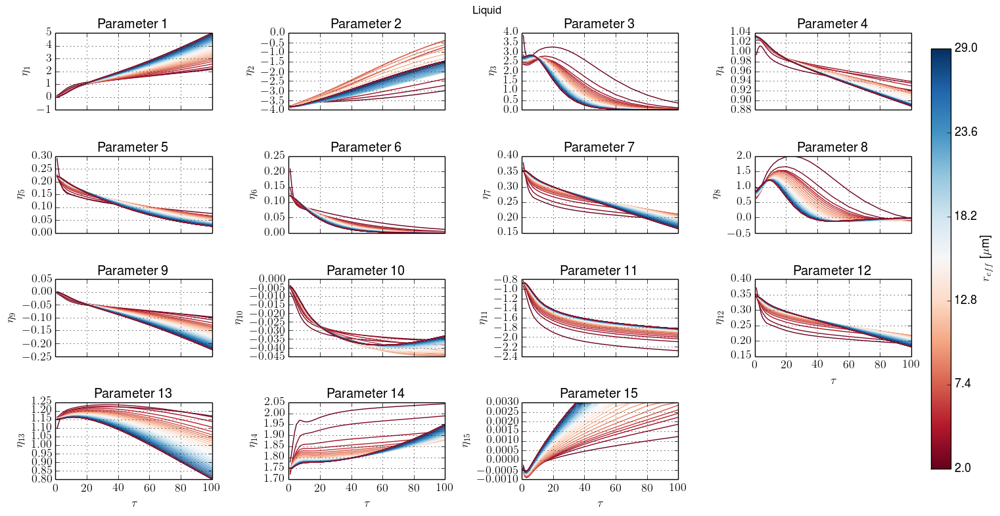

In [9]:
fig3,ax3 = plt.subplots(4,4,sharex=True,figsize=(15,8))
ax3 = ax3.ravel()

for i in range(lut.npar-1):
    color.cycle_cmap(len(lut.ref[lut.ref<30]),cmap=plt.cm.RdBu,ax=ax3[i])
    for j in xrange(len(lut.ref)):
        ax3[i].plot(lut.tau,lut.par[0,j,:,i])
    ax3[i].set_title('Parameter '+str(i+1))
    ax3[i].grid()
    ax3[i].set_xlim([0,100])
    ax3[i].set_ylabel('$\\eta_{%i}$' % (i+1))
    if i > 10: 
        ax3[i].set_xlabel('$\\tau$')

for tk in ax3[11].get_xticklabels():
    tk.set_visible(True)
ax3[-1].axis('off')

fig3.tight_layout()
plt.suptitle('Liquid')
plt.subplots_adjust(top=0.93,right=0.93)

cbar_ax = fig3.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.RdBu,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.ref[lut.ref<30])
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$r_{eff}$ [$\\mu$m]')
cba.ax.set_yticklabels(np.linspace(lut.ref[0],29,6));

plt.savefig(fp+'plots/20130913_'+vv+'_param_liq_vs_tau.png',dpi=600,transparent=True)
plt.show()

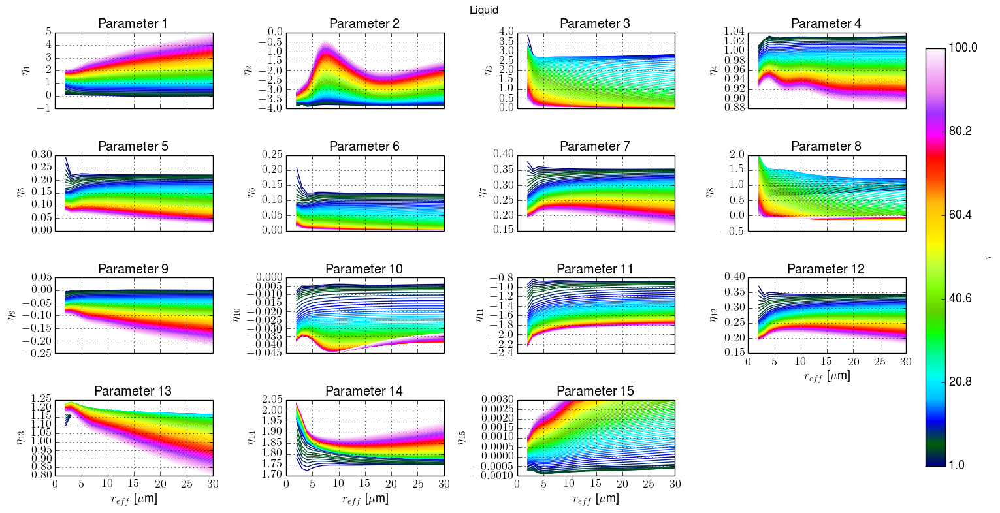

In [48]:
fig4,ax4 = plt.subplots(4,4,sharex=True,figsize=(15,8))
ax4 = ax4.ravel()

for i in range(lut.npar-1):
    color.cycle_cmap(len(lut.tau),cmap=plt.cm.gist_ncar,ax=ax4[i])
    for j in xrange(len(lut.tau)):
        ax4[i].plot(lut.ref,lut.par[0,:,j,i])
    ax4[i].set_title('Parameter '+str(i+1))
    ax4[i].grid()
    ax4[i].set_xlim([0,30])
    ax4[i].set_ylabel('$\\eta_{%i}$' % (i+1))
    if i > 10: 
        ax4[i].set_xlabel('$r_{eff}$ [$\mu$m]')

for tk in ax4[11].get_xticklabels():
    tk.set_visible(True)
ax4[-1].axis('off')
fig4.tight_layout()
plt.suptitle('Liquid')
plt.subplots_adjust(top=0.93,right=0.93)

cbar_ax = fig4.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.tau)
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$\\tau$')
labels = ['%5.1f' %F for F in np.linspace(lut.tau[0],lut.tau[-1],6)]
cba.ax.set_yticklabels(labels);

plt.savefig(fp+'plots/20130913_'+vv+'_param_liq_vs_ref.png',dpi=600,transparent=True)
plt.show()

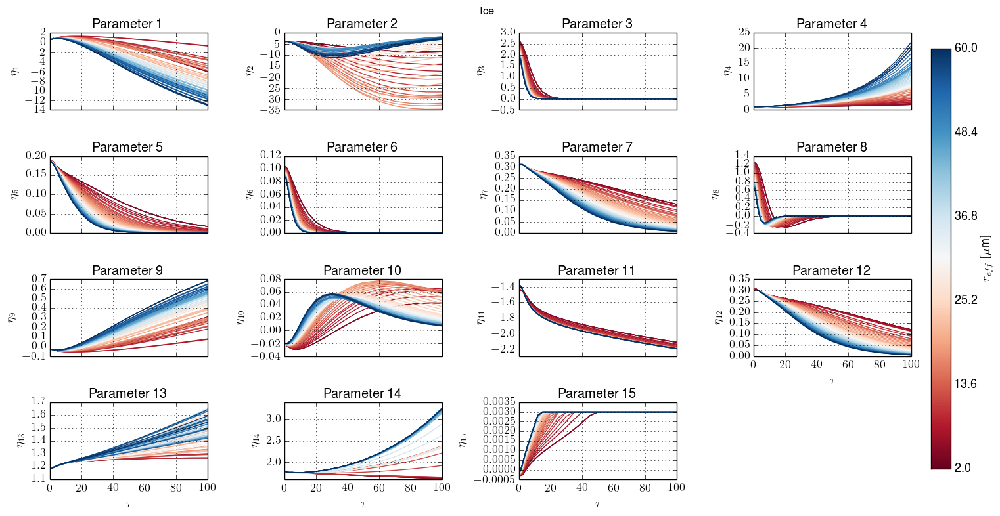

In [49]:
fig5,ax5 = plt.subplots(4,4,sharex=True,figsize=(15,8))
ax5 = ax5.ravel()

for i in range(lut.npar-1):
    color.cycle_cmap(len(lut.ref),cmap=plt.cm.RdBu,ax=ax5[i])
    for j in xrange(len(lut.ref)):
        ax5[i].plot(lut.tau,lut.par[1,j,:,i])
    ax5[i].set_title('Parameter '+str(i+1))
    ax5[i].grid()
    ax5[i].set_xlim([0,100])
    ax5[i].set_ylabel('$\\eta_{%i}$' % (i+1))
    if i > 10: 
        ax5[i].set_xlabel('$\\tau$')

for tk in ax5[11].get_xticklabels():
    tk.set_visible(True)
ax5[-1].axis('off')
fig5.tight_layout()
plt.suptitle('Ice')
plt.subplots_adjust(top=0.93,right=0.93)
cbar_ax = fig5.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.RdBu,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.ref)
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$r_{eff}$ [$\\mu$m]')
cba.ax.set_yticklabels(np.linspace(lut.ref[0],lut.ref[-1],6));

plt.savefig(fp+'plots/20130913_'+vv+'_param_ice_vs_tau.png',dpi=600,transparent=True)
plt.show()

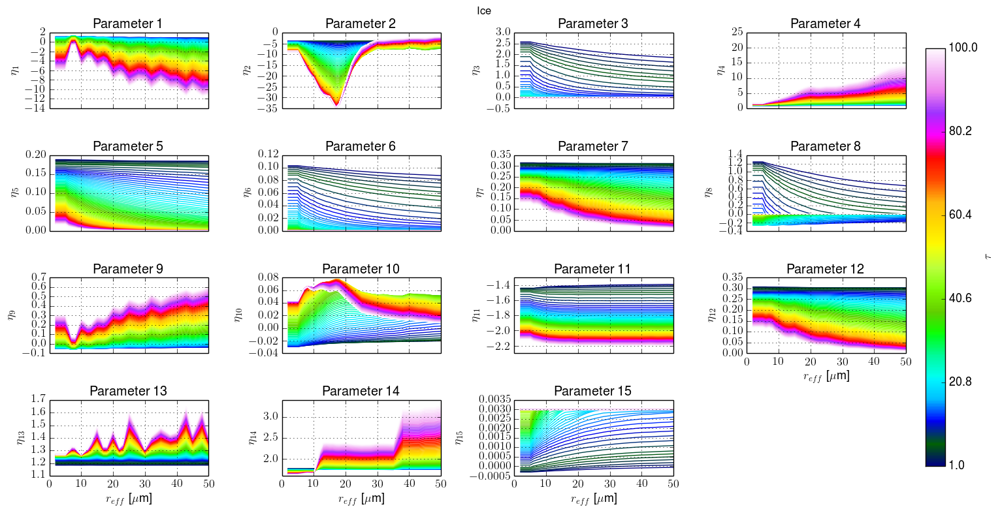

In [50]:
fig6,ax6 = plt.subplots(4,4,sharex=True,figsize=(15,8))
ax6 = ax6.ravel()
for i in range(lut.npar-1):
    color.cycle_cmap(len(lut.tau),cmap=plt.cm.gist_ncar,ax=ax6[i])
    for j in xrange(len(lut.tau)):
        ax6[i].plot(lut.ref,lut.par[1,:,j,i])
    ax6[i].set_title('Parameter '+str(i+1))
    ax6[i].grid()
    ax6[i].set_xlim([0,50])
    ax6[i].set_ylabel('$\\eta_{%i}$' % (i+1))
    if i > 10: 
        ax6[i].set_xlabel('$r_{eff}$ [$\mu$m]')

for tk in ax6[11].get_xticklabels():
    tk.set_visible(True)
ax6[-1].axis('off')
fig6.tight_layout()
plt.suptitle('Ice')
plt.subplots_adjust(top=0.93,right=0.93)
cbar_ax = fig6.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.tau)
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$\\tau$')
labels = ['%5.1f' %F for F in np.linspace(lut.tau[0],lut.tau[-1],6)]
cba.ax.set_yticklabels(labels);

plt.savefig(fp+'plots/20130913_'+vv+'_param_ice_vs_ref.png',dpi=600,transparent=True)
plt.show()

## Get the DC8 nav data

In [7]:
import load_modis
reload(load_modis)
from load_modis import mat2py_time, toutc, load_ict

In [7]:
dc8,dc8_header = load_ict(fp+'dc8/20130913/SEAC4RS-MMS-1HZ_DC8_20130913_R0.ict',return_header=True)

Some Scaling factors are not equal to one, Please check the factors:
[0.01, 0.01, 0.01, 0.01, 0.01, 0.001, 0.01, 0.01, 1e-05, 1e-05, 0.1, 0.01, 0.01, 0.01, 0.01]
('TIME_UTC', 'P', 'T', 'TAS', 'U', 'V', 'W', 'TEDR', 'REYN', 'G_LAT', 'G_LONG', 'G_ALT', 'POT', 'ROLL', 'HDG', 'PITCH')


<IPython.core.display.Javascript object>


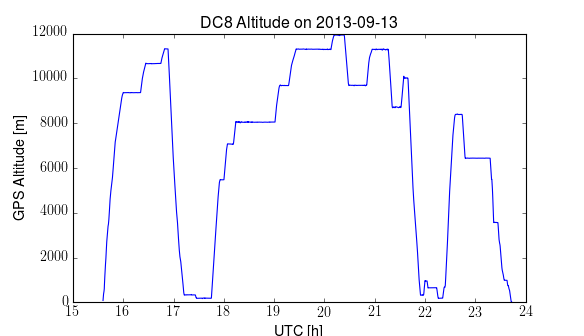

In [8]:
plt.figure()
plt.plot(dc8['TIME_UTC'],dc8['G_ALT'])
plt.xlabel('UTC [h]')
plt.ylabel('GPS Altitude [m]')
plt.title('DC8 Altitude on 2013-09-13')
plt.savefig(fp+'plots/20130913_DC8_alt.png',dpi=600,transparent=True)

In [9]:
print dc8['TIME_UTC'][12000]/3600.0
print dc8['G_ALT'][12000]

0.00525841226852
8047.3


<IPython.core.display.Javascript object>


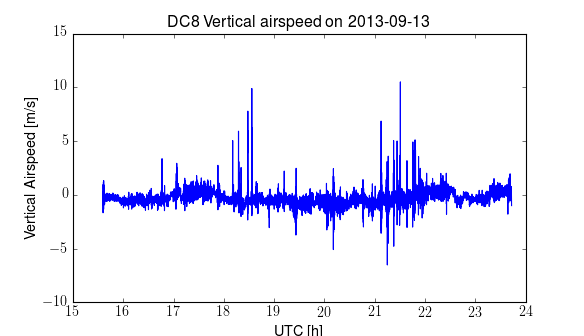

In [10]:
plt.figure()
plt.plot(dc8['TIME_UTC'],dc8['W'])
plt.xlabel('UTC [h]')
plt.ylabel('Vertical Airspeed [m/s]')
plt.title('DC8 Vertical airspeed on 2013-09-13')
plt.savefig(fp+'plots/20130913_DC8_W.png',dpi=600,transparent=True)

## Get the 4STAR data

In [4]:
# load the matlab file containing the measured TCAP radiances
mea = sio.loadmat(fp+'../4STAR/SEAC4RS/20130913/20130913starzen_3.mat')
mea.keys()

['QdVtb',
 'sunel',
 'm_aero',
 'El_deg',
 'visfilen',
 'skyresp',
 'nirAVG',
 'QdVlr',
 'nirheader',
 'sza',
 'Lon',
 'rad',
 'visVdettemp',
 'nirrow_labels',
 'raw',
 'rate',
 'pitch',
 'visrow_labels',
 'Tst',
 'ng',
 'fwhm',
 'program_version',
 'c0err',
 'sat_time',
 'nirt',
 'Tbox',
 'visheader',
 'nirTint',
 'm_H2O',
 'RHprecon_percent',
 'Tprecon',
 'filename',
 'note',
 'O3h',
 'NO2col',
 'm_ray',
 'Headng',
 'Lat',
 '__version__',
 'RH',
 'roll',
 'Pst',
 'aerosolcols',
 'nirsat_pixel',
 'Md',
 'nirVdettemp_C',
 'w',
 'vist',
 'sd_aero_crit',
 'sunaz',
 'dark',
 'AZcorr',
 'aeronetcols',
 'nirVdettemp',
 'Str',
 'Elstep',
 'visAVG',
 'c0',
 'Tprecon_C',
 'visTint',
 'O3col',
 'nircols',
 'Zn',
 'vissat_pixel',
 'AZstep',
 'AZ_deg',
 'nirfilen',
 'darkstd',
 'QdVtot',
 'RHprecon',
 '__header__',
 '__globals__',
 'toggle',
 'rawcorr',
 'sat_ij',
 't',
 'c0mod',
 'ELcorr',
 'skyresperr',
 'Alt',
 'Tbox_C',
 'viscols',
 'f',
 'visVdettemp_C']

Go through and get the radiances for good points, and for the time selected

In [8]:
print mea['t']
tt = mat2py_time(mea['t'])
mea['utc'] = toutc(tt)

[[ 735490.72298159]
 [ 735490.72299588]
 [ 735490.72301704]
 ..., 
 [ 735490.93319317]
 [ 735490.9332203 ]
 [ 735490.93324598]]


In [9]:
mea['good'] = np.where((mea['utc']>18.5) & (mea['utc']<19.75) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))

In [10]:
mea['w'][0][1068]

0.9926482589610186

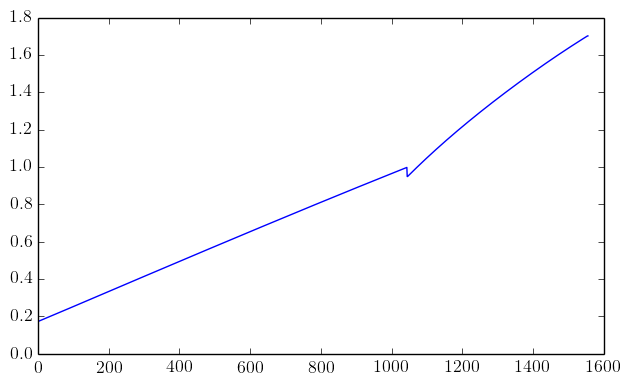

In [39]:
plt.plot(mea['w'][0])

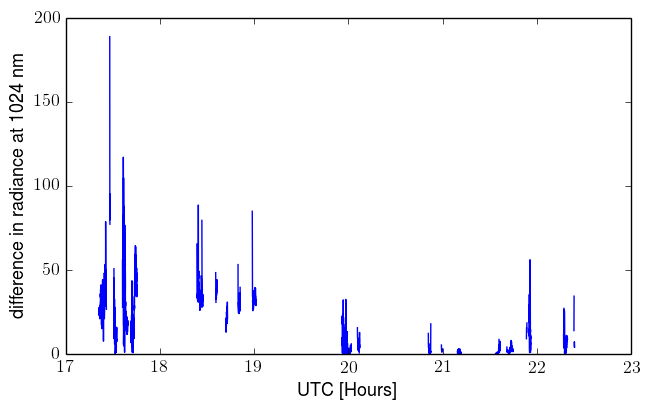

In [16]:
plt.figure()
plt.plot(mea['utc'],abs(mea['rad'][:,1024]-mea['rad'][:,1068]))
plt.xlabel('UTC [Hours]')
plt.ylabel('difference in radiance at 1024 nm')

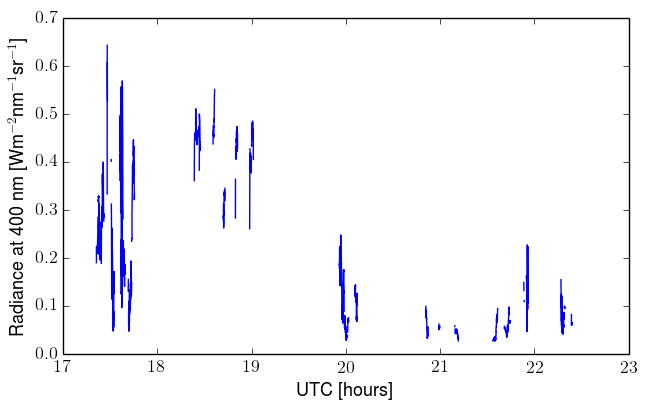

In [17]:
plt.figure()
plt.plot(mea['utc'],mea['rad'][:,400]/1000.)
plt.xlabel('UTC [hours]')
plt.ylabel('Radiance at 400 nm [Wm$^{-2}$nm$^{-1}$sr$^{-1}$]')

In [11]:
reload(Sp)
if 'meas' in locals():
    del meas
    import gc; gc.collect()
# first convert measurements to Sp class, with inherent parameters defined
meas = Sp.Sp(mea)
meas.params()

1556 1556
in rad
(1462L, 1556L) 2 1556
1 in ui
(1462L, 1556L)
Running Parameters


In [12]:
meas.sp.shape

(1462L, 1556L)

<IPython.core.display.Javascript object>


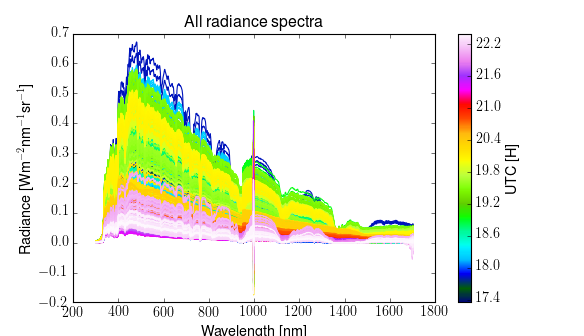

In [15]:
fig = plt.figure()
color.cycle_cmap(len(meas.utc),cmap=plt.cm.gist_ncar,ax=plt.gca())
for i in range(len(meas.utc)):
    plt.plot(meas.wvl,meas.sp[i,:]/1000.0)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Radiance [Wm$^{-2}$nm$^{-1}$sr$^{-1}$]')
plt.title('All radiance spectra')
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar)
scalarmap.set_array(meas.utc)
cba = plt.colorbar(scalarmap)
cba.set_label('UTC [h]')

<IPython.core.display.Javascript object>


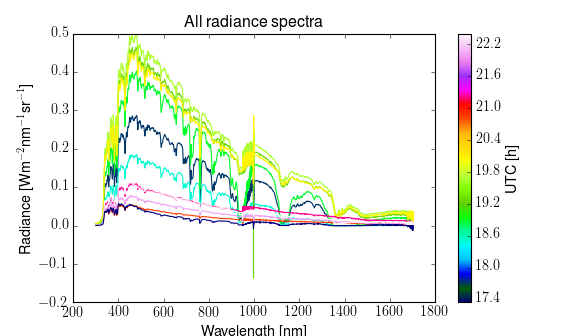

In [21]:
fig = plt.figure()
n=100
color.cycle_cmap(len(meas.utc)/n,cmap=plt.cm.gist_ncar,ax=plt.gca())
for i in range(len(meas.utc)):
    if not i%n:
        plt.plot(meas.wvl,meas.sp[i,:]/1000.0)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Radiance [Wm$^{-2}$nm$^{-1}$sr$^{-1}$]')
plt.title('All radiance spectra')
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar)
scalarmap.set_array(meas.utc)
cba = plt.colorbar(scalarmap)
cba.set_label('UTC [h]')
plt.savefig(fp+'plots/20130913_zenrad_spotcheck.png',dpi=600,transparent=True)

In [96]:
isubwvl = np.where((meas.wvl>315.0)&(meas.wvl<940.0))[0]

In [103]:
meas.sp.shape

(1462L, 1556L)

<IPython.core.display.Javascript object>


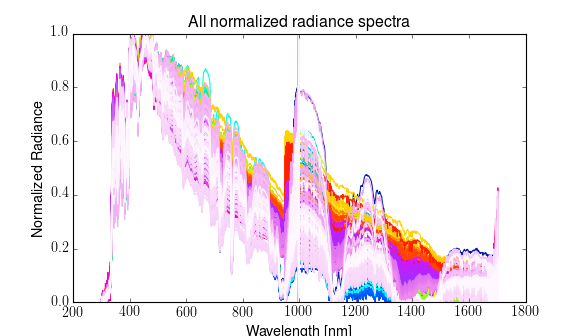

In [111]:
fig = plt.figure()
color.cycle_cmap(len(meas.utc),cmap=plt.cm.gist_ncar,ax=plt.gca())
for i in range(len(meas.utc)):
    plt.plot(meas.wvl,meas.norm[i,:])
plt.xlabel('Wavelength [nm]')
plt.ylabel('Normalized Radiance')
plt.ylim([0,1])
plt.title('All normalized radiance spectra')

<IPython.core.display.Javascript object>


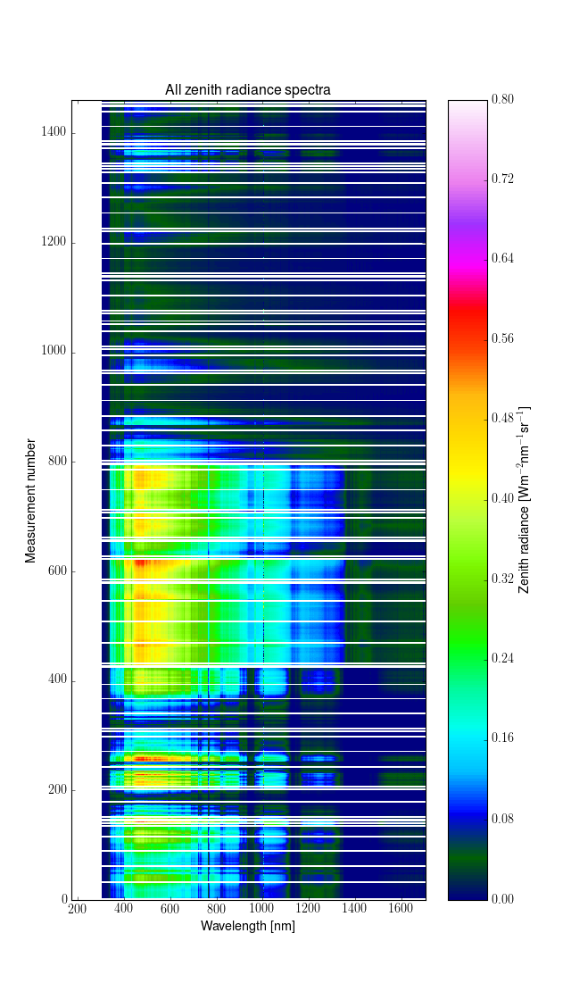

In [23]:
fig,ax = plt.subplots(1,1,figsize=(8,14))
pco = ax.pcolorfast(meas.wvl,np.where(meas.utc)[0],meas.sp[:-1,:-1]/1000.0,cmap='gist_ncar',vmin=0,vmax=0.8)
cba = plt.colorbar(pco)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Measurement number')
plt.title('All zenith radiance spectra')
cba.set_label('Zenith radiance [Wm$^{-2}$nm$^{-1}$sr$^{-1}$]')
plt.savefig(fp+'plots/20130913_curtain_zenrad_num.png',dpi=600,transparent=True)

<IPython.core.display.Javascript object>


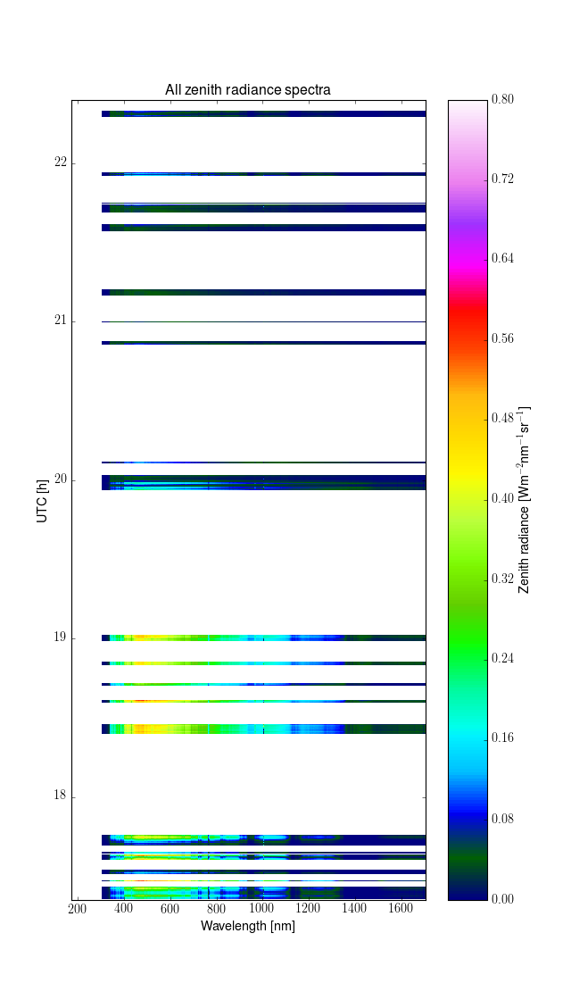

In [24]:
fig,ax = plt.subplots(1,1,figsize=(8,14))
pco = ax.pcolorfast(meas.wvl,meas.utc,meas.sp[:-1,:-1]/1000.0,cmap='gist_ncar',vmin=0,vmax=0.8)
cba = plt.colorbar(pco)
plt.xlabel('Wavelength [nm]')
plt.ylabel('UTC [h]')
plt.title('All zenith radiance spectra')
cba.set_label('Zenith radiance [Wm$^{-2}$nm$^{-1}$sr$^{-1}$]')
plt.savefig(fp+'plots/20130913_curtain_zenrad_utc.png',dpi=600,transparent=True)

<IPython.core.display.Javascript object>


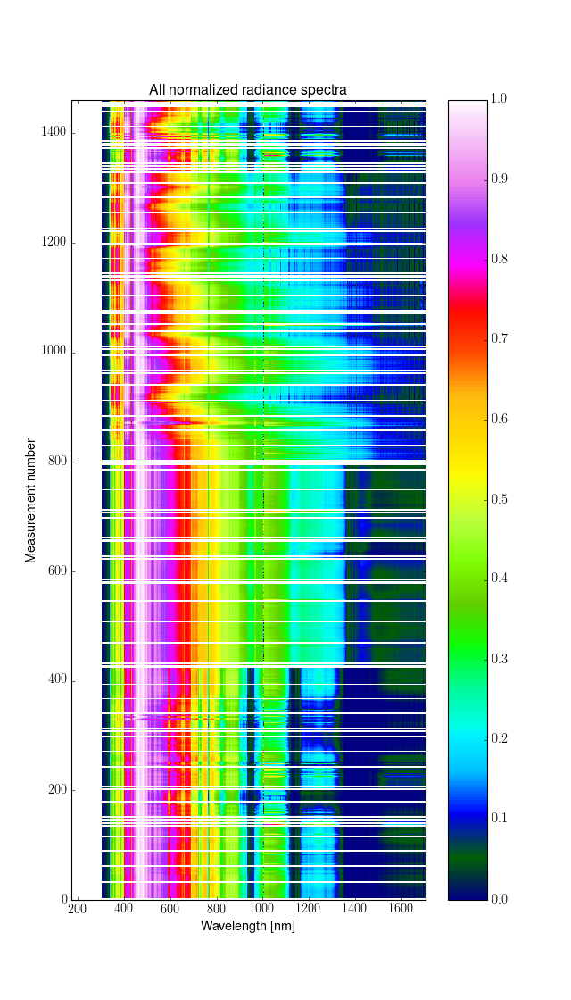

In [127]:
fig,ax = plt.subplots(1,1,figsize=(8,14))
pco = ax.pcolorfast(meas.wvl,np.where(meas.utc)[0],meas.norm[:-1,:-1],cmap='gist_ncar',vmin=0,vmax=1)
plt.colorbar(pco)
plt.xlabel('Wavelength [nm]')
plt.ylabel('Measurement number')
plt.title('All normalized radiance spectra')

## Run the retrieval on 4STAR data

In [129]:
from Sp_parameters import smooth

In [130]:
import run_kisq_retrieval as rk
reload(rk)

<module 'run_kisq_retrieval' from 'run_kisq_retrieval.pyc'>

In [131]:
subp = [1,2,4,5,6,10,11,13]
#subp = [2,3,5,6,7,11,12,14]

In [132]:
print max(meas.good)
print type(mea['good'])
print isinstance(mea['good'],tuple)
print type(mea['good'][0])

792
<type 'tuple'>
True
<type 'numpy.ndarray'>


In [133]:
(meas.tau,meas.ref,meas.phase,meas.ki) = rk.run_retrieval(meas,lut)

Retrieval progress over times: [########################################]100% -- Done! 


In [134]:
print meas.utc.shape
print len(meas.good), max(meas.good)

(1462L,)
180 792


<IPython.core.display.Javascript object>


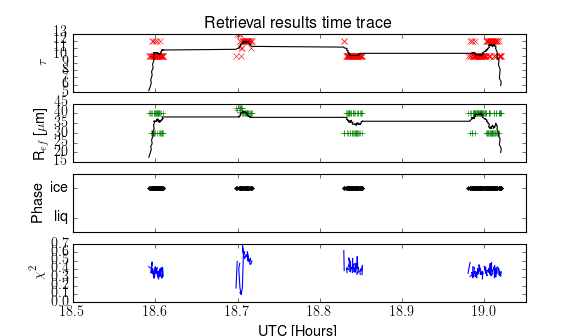

In [135]:
fig,ax = plt.subplots(4,sharex=True)
ax[0].set_title('Retrieval results time trace')
ax[0].plot(meas.utc,meas.tau,'rx')
ax[0].plot(meas.utc[meas.good],smooth(meas.tau[meas.good],20),'k')
ax[0].set_ylabel('$\\tau$')
ax[1].plot(meas.utc,meas.ref,'g+')
ax[1].set_ylabel('R$_{ef}$ [$\\mu$m]')
ax[1].plot(meas.utc[meas.good],smooth(meas.ref[meas.good],20),'k')
ax[2].plot(meas.utc,meas.phase,'k.')
ax[2].set_ylabel('Phase')
ax[2].set_ylim([-0.5,1.5])
ax[2].set_yticks([0,1])
ax[2].set_yticklabels(['liq','ice'])
ax[3].plot(meas.utc,meas.ki)
ax[3].set_ylabel('$\\chi^{2}$')
ax[3].set_xlabel('UTC [Hours]')
ax[3].set_xlim([18.5,19.05])
plt.savefig(fp+'plots\\SEAC4RS_20130913_retri_results_v4.png',dpi=600)
#plt.savefig(fp+'plots\\SEAC4RS_20130913_retri_results_v3.pdf',bbox='tight')

<IPython.core.display.Javascript object>


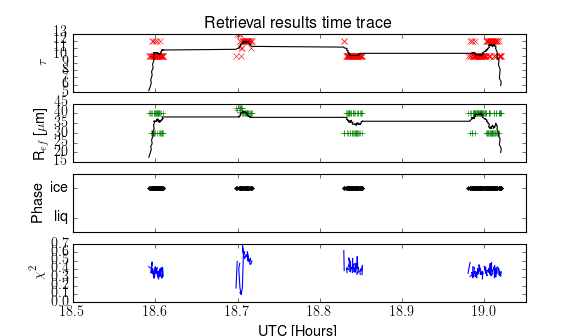

In [136]:
from Sp_parameters import smooth
fig,ax = plt.subplots(4,sharex=True)
ax[0].set_title('Retrieval results time trace')
ax[0].plot(meas.utc,meas.tau,'rx')
ax[0].plot(meas.utc[meas.good],smooth(meas.tau[meas.good],20),'k')
ax[0].set_ylabel('$\\tau$')
ax[1].plot(meas.utc,meas.ref,'g+')
ax[1].set_ylabel('R$_{ef}$ [$\\mu$m]')
ax[1].plot(meas.utc[meas.good],smooth(meas.ref[meas.good],20),'k')
ax[2].plot(meas.utc,meas.phase,'k.')
ax[2].set_ylabel('Phase')
ax[2].set_ylim([-0.5,1.5])
ax[2].set_yticks([0,1])
ax[2].set_yticklabels(['liq','ice'])
ax[3].plot(meas.utc,meas.ki)
ax[3].set_ylabel('$\\chi^{2}$')
ax[3].set_xlabel('UTC [Hours]')
ax[3].set_xlim([18.5,19.05])
plt.savefig(fp+'plots\\SEAC4RS_20130913_retri_results_v4.png',dpi=600)
#plt.savefig(fp+'plots\\SEAC4RS_20130913_retri_results_v3.pdf',bbox='tight')

Smooth out the retrieved 4STAR data

In [137]:
meas.tau[meas.good] = smooth(meas.tau[meas.good],20)
meas.ref[meas.good] = smooth(meas.ref[meas.good],20)

## Get SSFR data from ER2

In [138]:
import load_modis as lm
if 'lm' in locals():
    reload(lm)
from load_modis import load_ict

### First load the ER2 files

In [139]:
ssfr_er2_file = fp+'er2/20130913/SEAC4RS-SSFR_ER2_20130913_R0.ict'
ssfr_er2 = load_ict(ssfr_er2_file)
print len(ssfr_er2['UTC'])

('UTC', 'DN500', 'DN936', 'DN1600', 'DN_SW350_700', 'DN_SW350_2150', 'UP500', 'UP936', 'UP1600', 'UP_SW350_700', 'UP_SW350_2150')
41477


In [140]:
nasdat_er2_file = fp+'er2/20130913/seac4rs-nasdat_er2_20130913_r0.ict'
er2 = load_ict(nasdat_er2_file)
print len(er2['Start_UTC'])
print er2['Start_UTC']
print np.min(er2['Solar_Zenith_Angle'])

('Start_UTC', 'Latitude', 'Longitude', 'GPS_Altitude', 'Pressure_Altitude', 'Ground_Speed', 'True_Air_Speed', 'Mach_Number', 'True_Heading', 'Track_Angle', 'Drift_Angle', 'Pitch_Angle', 'Roll_Angle', 'Static_Air_Temp', 'Total_Air_Temp', 'E_Bay_Pressure', 'Wind_Speed', 'Wind_Direction', 'Solar_Zenith_Angle', 'Aircraft_Sun_Elevation', 'Sun_Azimuth', 'Aircraft_Sun_Azimuth')
28978
[ 15.51388889  15.51416667  15.51444444 ...,  23.5625      23.56277778
  23.56305556]
17.9


<IPython.core.display.Javascript object>


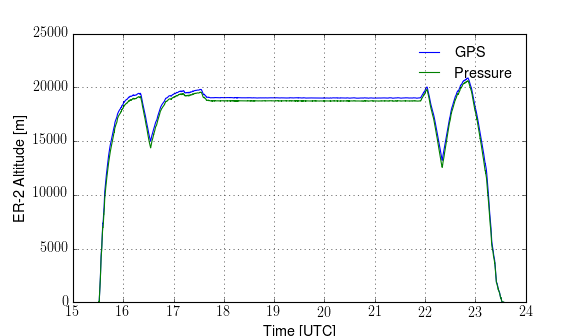

In [141]:
plt.figure()
feet2meter=0.3048
plt.plot(er2['Start_UTC'],er2['GPS_Altitude'],label="GPS",color='b')
plt.plot(er2['Start_UTC'],er2['Pressure_Altitude']*feet2meter,label="Pressure",color='g')
plt.grid(True)
plt.xlabel('Time [UTC]')
plt.ylabel('ER-2 Altitude [m]')
plt.legend(frameon=False)
plt.savefig(fp+'plots\\20130913_er2_alt.png',dpi=600,transparent=True)

In [142]:
print er2['Start_UTC'][12000]
print er2['GPS_Altitude'][12000]
print er2['Pressure_Altitude'][12000]

18.8472222222
19018.0
61502.5


<IPython.core.display.Javascript object>


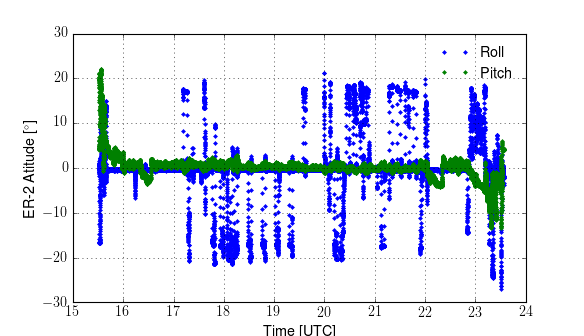

In [145]:
plt.figure()
feet2meter=0.3048
plt.plot(er2['Start_UTC'],er2['Roll_Angle'],'b.',label="Roll")
plt.plot(er2['Start_UTC'],er2['Pitch_Angle'],'g.',label="Pitch")
plt.grid(True)
plt.xlabel('Time [UTC]')
plt.ylabel('ER-2 Atitude [$^{\circ}$]')
plt.legend(frameon=False)
plt.savefig(fp+'plots\\20130913_er2_roll_pitch.png',dpi=600,transparent=True)

### Now load the SSFR files from the ER2

In [18]:
ssfr_idl_file = fp+'er2/20130913/20130913_calibspcs.out'
ssfr_idl = sio.idl.readsav(ssfr_idl_file)
print ssfr_idl.keys()
print np.shape(ssfr_idl['zspectra'])
print np.shape(ssfr_idl['sat'])

['status', 'zenlambda', 'zer', 'nadlambda', 'nspectra', 'zspectra', 'sat', 'ner', 'tmhrs']
(27194L, 416L)
(4L, 60000L)


In [19]:
class object():
    pass
ssfr = object()
if False:
    ssfr.utc = ssfr_er2['UTC']
    ssfr.Rvis = ssfr_er2['UP500']/ssfr_er2['DN500']
    ssfr.Rnir = ssfr_er2['UP1600']/ssfr_er2['DN1600']
    ssfr.Rvis[ssfr_er2['UP500']==-999] = np.nan
    ssfr.Rnir[ssfr_er2['UP500']==-999] = np.nan
    ssfr.Rnir[ssfr_er2['UP500']<=0] = np.nan
    ssfr.Rvis[ssfr_er2['UP500']<=0] = np.nan
    print np.max(er2['Start_UTC'])
    print np.max(ssfr.utc)
else:
    ssfr.utc = ssfr_idl['tmhrs']
    i500 = np.argmin(abs(ssfr_idl['zenlambda']-500.0))
    i1650 = np.argmin(abs(ssfr_idl['zenlambda']-1700.0))
    ssfr.Rvis = ssfr_idl['zspectra'][:,i500]/ssfr_idl['nspectra'][:,i500]
    ssfr.Rnir = ssfr_idl['zspectra'][:,i1650]/ssfr_idl['nspectra'][:,i1650-1]
    ssfr.Rvis[ssfr.Rvis<0] = np.nan
    ssfr.Rvis[ssfr.Rvis>1] = np.nan
    ssfr.Rnir[ssfr.Rnir<0] = np.nan
    ssfr.Rnir[ssfr.Rnir>1] = np.nan

In [20]:
print i500, i1650
i1600 = np.argmin(abs(ssfr_idl['zenlambda']-1600.0))

44 319


In [21]:
iu = np.argmin(abs(ssfr_idl['tmhrs']-18.5))
iu2 = np.argmin(abs(ssfr_er2['UTC']-18.5))
print iu,iu2

10957 16878


In [22]:
print ssfr_er2['UP500'][iu2], ssfr_idl['zspectra'][iu,i500], ssfr_er2['UP500'][iu2]/ssfr_idl['zspectra'][iu,i500]
print ssfr_er2['DN500'][iu2+200], ssfr_idl['nspectra'][iu+200,i500], ssfr_er2['DN500'][iu2+200]/ssfr_idl['nspectra'][iu+200,i500]
print ssfr_er2['UTC'][iu2+200]
print ssfr_idl['tmhrs'][iu+200]
print ssfr_idl['nspectra'][iu+200,i500]
rup500 = ssfr_er2['UP500'][iu2]/ssfr_idl['zspectra'][iu,i500]
rdn500 = ssfr_er2['DN500'][iu2+200]/ssfr_idl['nspectra'][iu+200,i500]

1.2370379 1.19977 1.03106419869
1.8046781 2.09766 0.860328269727
18.5555555556
18.5555555556
2.09766


In [23]:
print ssfr_er2['UP1600'][iu2], ssfr_idl['zspectra'][iu,i1600], ssfr_er2['UP1600'][iu2]/ssfr_idl['zspectra'][iu,i1600]
print ssfr_er2['DN1600'][iu2+200], ssfr_idl['nspectra'][iu+200,i1600], ssfr_er2['DN1600'][iu2+200]/ssfr_idl['nspectra'][iu+200,i1600]
print ssfr_er2['UTC'][iu2+200]
print ssfr_idl['tmhrs'][iu+200]
print ssfr_idl['nspectra'][iu+200,i500]
rup1600 = ssfr_er2['UP1600'][iu2]/ssfr_idl['zspectra'][iu,i1600]
rdn1600 = ssfr_er2['DN1600'][iu2+200]/ssfr_idl['nspectra'][iu+200,i1600]

0.0558323 0.05424 1.02935699704
0.2306706 0.262953 0.877230950041
18.5555555556
18.5555555556
2.09766


In [24]:
print rup500/rdn500

1.19845439813


In [25]:
ssfr.Rvis = ssfr.Rvis*rup500/rdn500
ssfr.Rnir = ssfr.Rnir*rup1600/rdn1600

In [26]:
print np.nanmin(ssfr.Rvis), np.nanmax(ssfr.Rvis)
print ssfr_idl['nadlambda'][i1650-2]
print i500, i1650
print len(ssfr.utc), len(ssfr.Rvis)

6.28141e-05 1.19818
1696.91
44 319
27194 27194


In [27]:
from scipy import interpolate
sza_fx = interpolate.interp1d(er2['Start_UTC'],er2['Solar_Zenith_Angle'],bounds_error=False)
ssfr.sza = sza_fx(ssfr.utc)
print sza_fx(18.41)
print ssfr.utc[17000], ssfr.sza[17000]

18.2
20.445 39.1


<IPython.core.display.Javascript object>


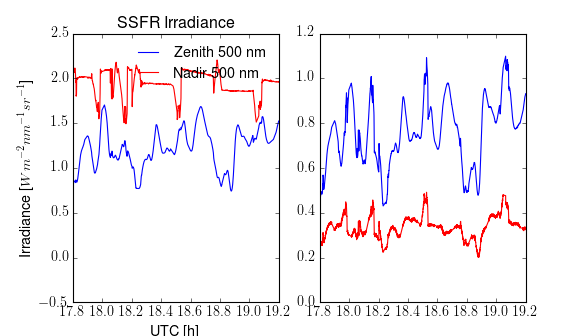

(17.8, 19.2)

In [28]:
fig = plt.figure()
fig.add_subplot(1,2,1)
plt.plot(ssfr.utc,ssfr_idl['zspectra'][:,i500],label='Zenith 500 nm')
plt.plot(ssfr.utc,ssfr_idl['nspectra'][:,i500],'r', label='Nadir 500 nm')
plt.title('SSFR Irradiance')
plt.xlabel('UTC [h]')
plt.ylabel('Irradiance [$Wm^{-2}nm^{-1}sr^{-1}$]')
plt.legend(frameon=False)
plt.xlim([17.8,19.2])
fig.add_subplot(1,2,2)
plt.plot(ssfr.utc,ssfr.Rvis,'b',ssfr.utc,ssfr.Rnir,'r')
plt.xlim([17.8,19.2])
#plt.ylim([0.22,0.32])

##### Check the lut for reflectance

In [29]:
lut.sp_hires(doirrad=True)

(103L,)
(59L,)
Running interpolation: [########################################]100% -- Done! 
Creating reflect spectra with tau, and ref of the new high resolution values


In [30]:
lut.reflect.shape

(2L, 1556L, 2L, 59L, 103L)

In [31]:
lut.ref

array([  2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.,  11.,  12.,
        13.,  14.,  15.,  16.,  17.,  18.,  19.,  20.,  21.,  22.,  23.,
        24.,  25.,  26.,  27.,  28.,  29.,  30.,  31.,  32.,  33.,  34.,
        35.,  36.,  37.,  38.,  39.,  40.,  41.,  42.,  43.,  44.,  45.,
        46.,  47.,  48.,  49.,  50.,  51.,  52.,  53.,  54.,  55.,  56.,
        57.,  58.,  59.,  60.])

<IPython.core.display.Javascript object>


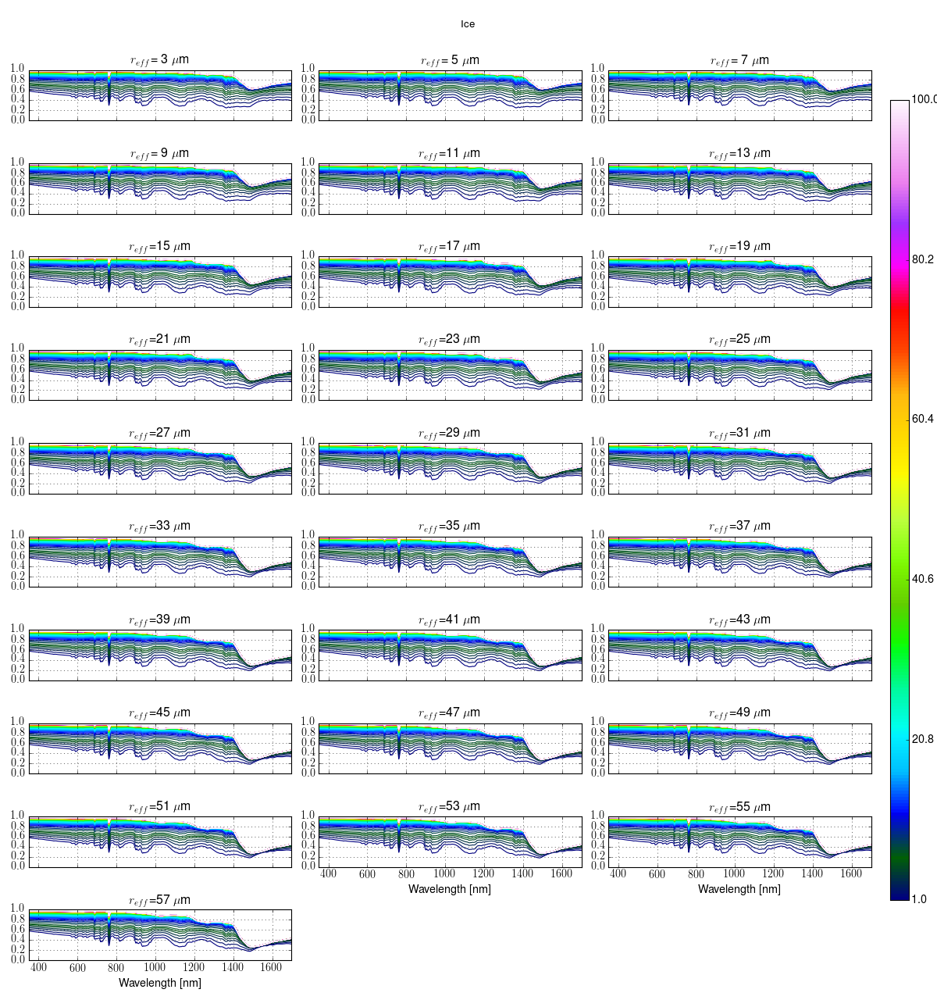

In [80]:
figref = plt.figure(15,16)
figref,axref = plt.subplots(10,3,sharex=True,figsize=(15,16))
axref = axref.ravel()
for i in range(lut.ref.size/2-1):
    color.cycle_cmap(len(lut.tau),cmap=plt.cm.gist_ncar,ax=axref[i])
    for j in xrange(len(lut.tau)):
        axref[i].plot(lut.wvl,lut.reflect[1,:,1,2*i,j])
    axref[i].set_title('$r_{eff}$=%2.0f $\\mu$m' % lut.ref[i*2+1])
    axref[i].grid()
    axref[i].set_xlim([350,1700])
    axref[i].set_ylim([0,1])
    if i > 24: 
        axref[i].set_xlabel('Wavelength [nm]')

ididnt = [u for u in range(axref.size) if u>i]
for u in ididnt: 
    axref[u].axis('off')
for u in range(len(ididnt)):
    for tk in axref[i-u-1].get_xticklabels():
        tk.set_visible(True)
    
figref.tight_layout()
plt.suptitle('Ice')
plt.subplots_adjust(top=0.93,right=0.93)
cbar_ax = figref.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.tau)
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$\\tau$')
labels = ['%5.1f' %F for F in np.linspace(lut.tau[0],lut.tau[-1],6)]
cba.ax.set_yticklabels(labels);
plt.savefig(fp+'plots/Spectral_reflectance_model_ice.png',dpi=600,transparent=True)
#plt.show()

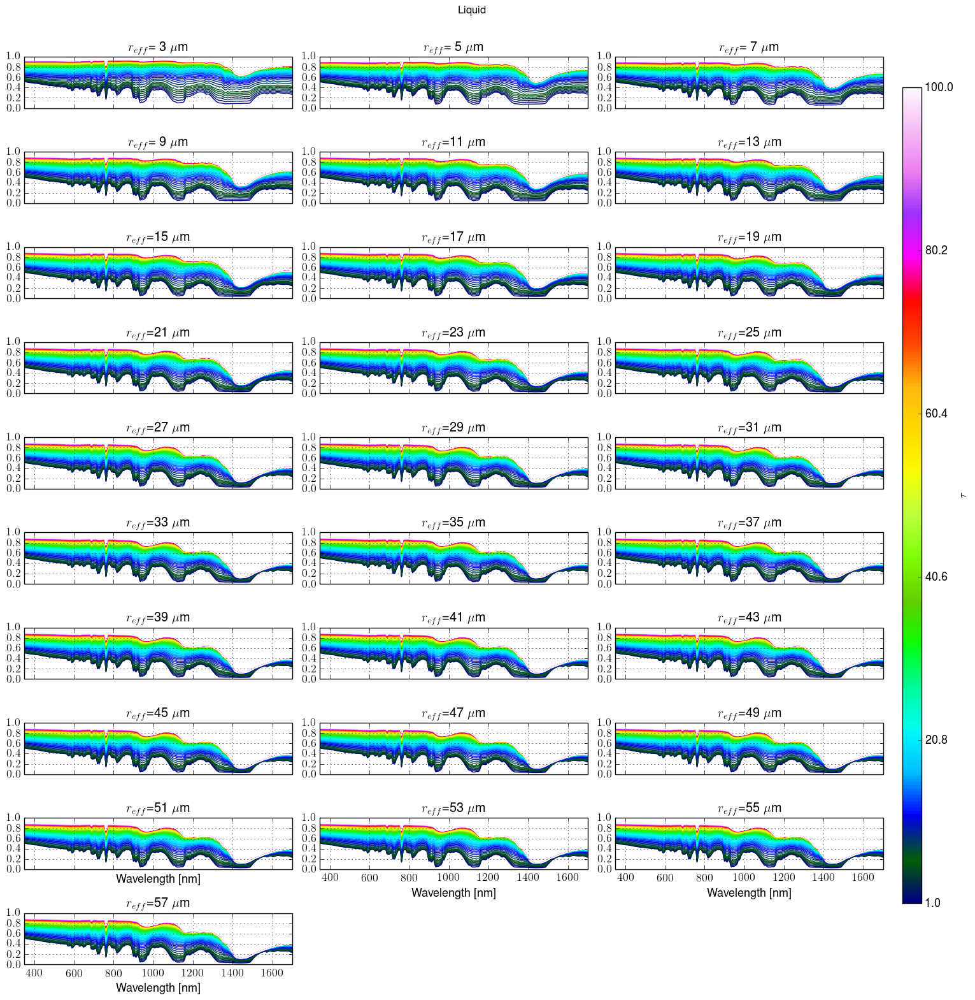

In [64]:
figref,axref = plt.subplots(10,3,sharex=True,figsize=(15,16))
axref = axref.ravel()
for i in range(lut.ref.size/2-1):
    color.cycle_cmap(len(lut.tau),cmap=plt.cm.gist_ncar,ax=axref[i])
    for j in xrange(len(lut.tau)):
        axref[i].plot(lut.wvl,lut.reflect[0,:,1,2*i,j])
    axref[i].set_title('$r_{eff}$=%2.0f $\\mu$m' %lut.ref[i*2+1])
    axref[i].grid()
    axref[i].set_xlim([350,1700])
    axref[i].set_ylim([0,1])
    if i > 23: 
        axref[i].set_xlabel('Wavelength [nm]')
        
ididnt = [u for u in range(axref.size) if u>i]
for u in ididnt: 
    axref[u].axis('off')
for u in range(len(ididnt)):
    for tk in axref[i-u-1].get_xticklabels():
        tk.set_visible(True)
        
figref.tight_layout()
plt.suptitle('Liquid')
plt.subplots_adjust(top=0.93,right=0.93)
cbar_ax = figref.add_axes([0.95,0.10,0.02,0.8])
scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.gist_ncar,norm=plt.Normalize(vmin=0,vmax=1))
scalarmap.set_array(lut.tau)
cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
cba.ax.set_ylabel('$\\tau$')
labels = ['%5.1f' %F for F in np.linspace(lut.tau[0],lut.tau[-1],6)]
cba.ax.set_yticklabels(labels);
plt.savefig(fp+'plots/Spectral_reflectance_model_liq.png',dpi=600,transparent=True)
plt.show()

### plot the lut

In [37]:
w500 = np.argmin(abs(lut.wvl-500.0))
w1700 = np.argmin(abs(lut.wvl-1700.0))

In [35]:
lut.reflect.shape

(2L, 1556L, 2L, 59L, 103L)

<IPython.core.display.Javascript object>


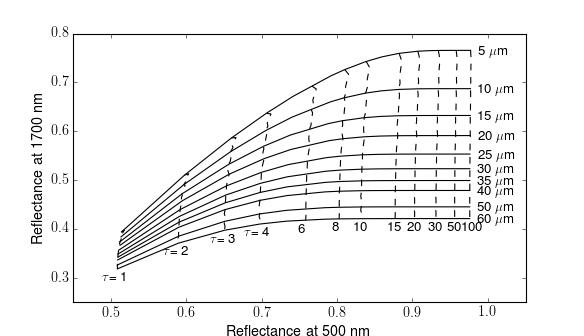

In [79]:
plt.figure()
taus = [1,2,3,4,6,8,10,15,20,30,50,100]
refs = [1,5,10,15,20,25,30,35,40,50,60]
for ir,r in enumerate(lut.ref):
    if r in refs: 
        plt.plot(lut.reflect[1,w500,1,ir,:],lut.reflect[1,w1700,1,ir,:],'k-')
        plt.annotate('%2i $\mu$m'%r,xy=(lut.reflect[1,w500,1,ir,-1]+0.01,lut.reflect[1,w1700,1,ir,-1]-0.01))
for it,t in enumerate(lut.tau):
    if t in taus:
        plt.plot(lut.reflect[1,w500,1,:,it],lut.reflect[1,w1700,1,:,it],'k--')
        if t<6:
            plt.annotate('$\\tau$=%2i'%t,xy=(lut.reflect[1,w500,1,-1,it]-0.02,lut.reflect[1,w1700,1,-1,it]-0.025))
        else:
            plt.annotate('%2i'%t,xy=(lut.reflect[1,w500,1,-1,it]-0.01,lut.reflect[1,w1700,1,-1,it]-0.025))
plt.xlabel('Reflectance at 500 nm') 
plt.ylabel('Reflectance at 1700 nm')
plt.xlim([0.45,1.05])
plt.ylim([0.25,0.8])
plt.savefig(fp+'plots/Reflectance_lut_ice.png',dpi=600,transparent=True)

### Now run the retrieval on reflectance from SSFR measurements based on the ER2 platorm

In [70]:
import run_2wvl_retrieval as rw
if 'rw' in locals():
    reload(rw)

In [71]:
(ssfr.tau,ssfr.ref,ssfr.ki) = rw.run_2wvl_retrieval(ssfr,lut,wvls=[500.0,1600.0])

Retrieval progress over times: [########################################]100% -- Done! 


In [72]:
ssfr.tau[ssfr.ref==60] = np.nan
ssfr.ref[ssfr.ref==60] = np.nan

(18.0, 19.2)

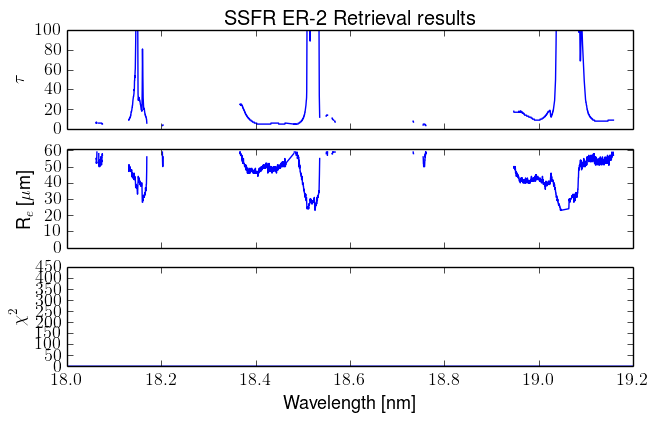

In [371]:
figsr,axsr = plt.subplots(3,1,sharex=True)
axsr[0].plot(ssfr.utc,ssfr.tau[:,1])
axsr[1].plot(ssfr.utc,ssfr.ref[:,1])
axsr[2].plot(ssfr.utc,ssfr.ki[:,1])
axsr[2].set_xlabel('Wavelength [nm]')
axsr[0].set_ylabel('$\\tau$')
axsr[1].set_ylabel('R$_{e}$ [$\\mu$m]')
axsr[1].set_ylim([0,61])
axsr[2].set_ylabel('$\\chi^{2}$')
axsr[0].set_title('SSFR ER-2 Retrieval results')
axsr[2].set_xlim([18.0,19.2])

## Load data from CPL to compare flight profiles of DC8 and ER2 to cloud layers

In [73]:
cpl_layer_file = fp+'er2\\20130913\\layers_13965_13sep13.txt'
import load_modis as lm
reload(lm)
from load_modis import load_cpl_layers
cpl_layers = load_cpl_layers(cpl_layer_file)

In [74]:
cpl_layers.dtype

dtype([('hh', '<i4'), ('mm', '<i4'), ('ss', '<i4'), ('lat', '<f8'), ('lon', '<f8'), ('alt', '<f8'), ('rol', '<f8'), ('num', '<i4'), ('gh', '<f8'), ('top', '<f8', (10,)), ('bot', '<f8', (10,)), ('type', '<i4', (10,)), ('utc', '<f8')])

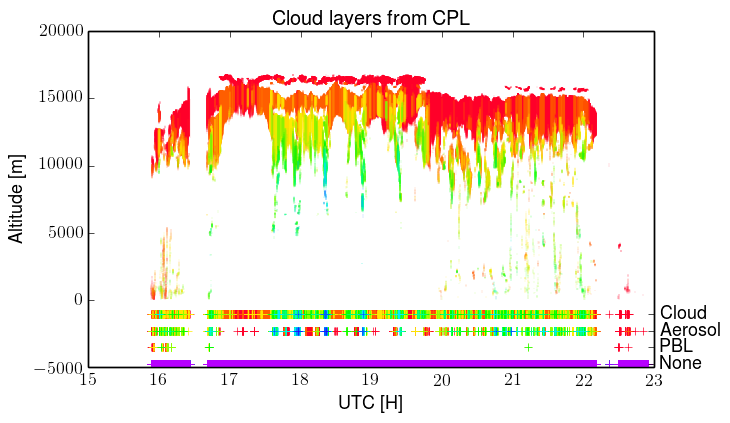

In [58]:
fig,ax = plt.subplots(1,1)
ax2 = ax.twinx()
ax2.set_yticks([0,1000,2000,3000])
ax2.set_yticklabels(['None','PBL','Aerosol','Cloud'])
ax2.set_ylim([-200,20000])
for i in xrange(10):
    ax.vlines(cpl_layers['utc'],cpl_layers['bot'][:,i],cpl_layers['top'][:,i],lw=0.1,color=plt.cm.gist_rainbow(i/10.0))
    ax2.plot(cpl_layers['utc'],cpl_layers['type'][:,i]*1000,'+',color=plt.cm.gist_rainbow(i/10.0))
plt.title('Cloud layers from CPL')
ax.set_xlabel('UTC [H]')
ax.set_ylabel('Altitude [m]')
#plt.tick_params(axis='y', which='both', labelleft='on', labelright='on')
plt.savefig(fp+'plots/20130913_cpl_layers.png',dpi=600,transparent=True)

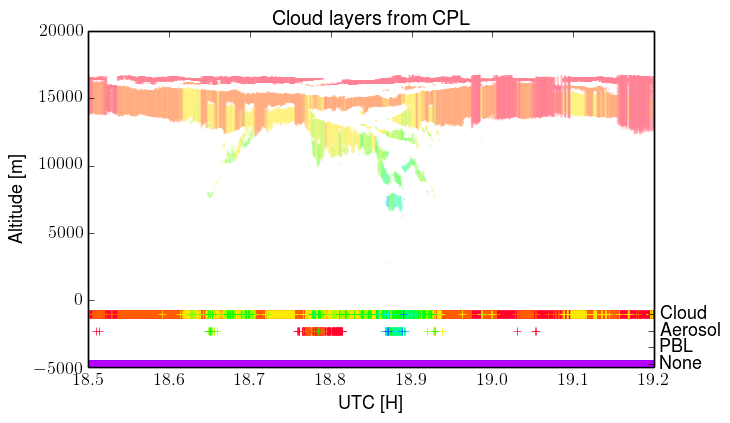

In [69]:
fig,ax = plt.subplots(1,1)
ax2 = ax.twinx()
ax2.set_yticks([0,1000,2000,3000])
ax2.set_yticklabels(['None','PBL','Aerosol','Cloud'])
ax2.set_ylim([-200,20000])
for i in xrange(10):
    ax.vlines(cpl_layers['utc'],cpl_layers['bot'][:,i],cpl_layers['top'][:,i],lw=0.1,color=plt.cm.gist_rainbow(i/10.0))
    ax2.plot(cpl_layers['utc'],cpl_layers['type'][:,i]*1000,'+',color=plt.cm.gist_rainbow(i/10.0))
plt.title('Cloud layers from CPL')
ax.set_xlabel('UTC [H]')
ax.set_ylabel('Altitude [m]')
ax.set_xlim([18.5,19.2])
#plt.tick_params(axis='y', which='both', labelleft='on', labelright='on')
plt.savefig(fp+'plots/20130913_cpl_layers_zoom.png',dpi=600,transparent=True)

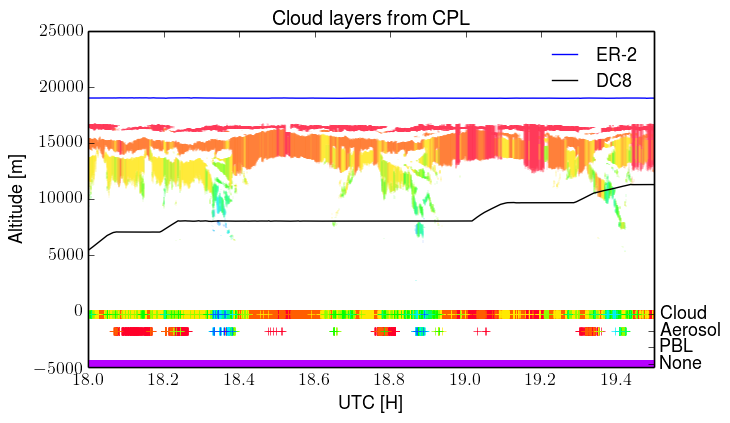

In [48]:
fig,ax = plt.subplots(1,1)
ax2 = ax.twinx()
ax2.set_yticks([0,1000,2000,3000])
ax2.set_yticklabels(['None','PBL','Aerosol','Cloud'])
ax2.set_ylim([-200,20000])
for i in xrange(10):
    ax.vlines(cpl_layers['utc'],cpl_layers['bot'][:,i],cpl_layers['top'][:,i],lw=0.1,color=plt.cm.gist_rainbow(i/10.0))
    ax2.plot(cpl_layers['utc'],cpl_layers['type'][:,i]*1000,'+',color=plt.cm.gist_rainbow(i/10.0))
plt.title('Cloud layers from CPL')
ax.set_xlabel('UTC [H]')
ax.set_ylabel('Altitude [m]')
ax.set_xlim([18.0,19.5])
ax.plot(er2['Start_UTC'],er2['GPS_Altitude'],label="ER-2",color='b')
ax.plot(dc8['TIME_UTC'],dc8['G_ALT'],label="DC8",color='k')
ax.legend(frameon=False)
#plt.tick_params(axis='y', which='both', labelleft='on', labelright='on')
plt.savefig(fp+'plots/20130913_cpl_layers_zoom_flightpath.png',dpi=600,transparent=True)

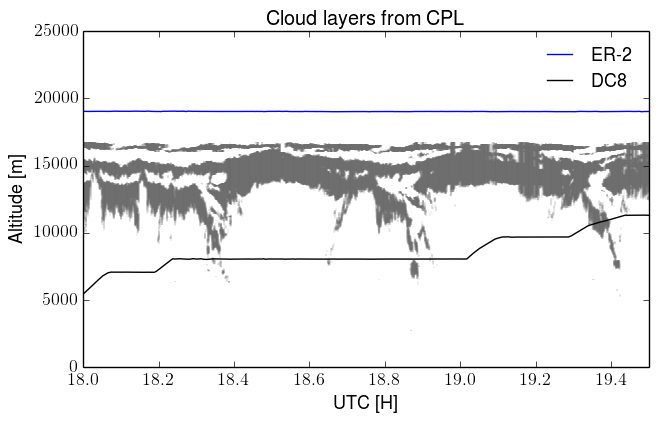

In [191]:
fig,ax = plt.subplots(1,1)
#ax2 = ax.twinx()
#ax2.set_yticks([0,1000,2000,3000])
#ax2.set_yticklabels(['None','PBL','Aerosol','Cloud'])
#ax2.set_ylim([-200,20000])
for i in xrange(10):
    ax.vlines(cpl_layers['utc'],cpl_layers['bot'][:,i],cpl_layers['top'][:,i],lw=0.1,color=plt.cm.Greys(200))
    #ax2.plot(cpl_layers['utc'],cpl_layers['type'][:,i]*1000,'+',color=plt.cm.gist_rainbow(i/10.0))
plt.title('Cloud layers from CPL')
ax.set_xlabel('UTC [H]')
ax.set_ylabel('Altitude [m]')
ax.set_xlim([18.0,19.5])
ax.set_ylim([0,25000])
ax.plot(er2['Start_UTC'],er2['GPS_Altitude'],label="ER-2",color='r')
ax.plot(dc8['TIME_UTC'],dc8['G_ALT'],label="DC8",color='b')
ax.legend(frameon=False)
#plt.tick_params(axis='y', which='both', labelleft='on', labelright='on')
plt.savefig(fp+'plots/20130913_cpl_layers_zoom_flightpath_grey.png',dpi=600,transparent=True)

In [75]:
ia = abs(cpl_layers['utc']-19.03).argmin()
print cpl_layers['top'][ia,0]
print cpl_layers['bot'][ia,:]

16489.0
[ 16279.  13610.     nan     nan     nan     nan     nan     nan     nan
     nan]


## Get the data from MODIS to compare

In [44]:
from mpl_toolkits.basemap import Basemap,cm
myd06_file = fp+'modis\\20130913\\MYD06_L2.A2013256.1910.006.2014267222159.hdf'
myd03_file = fp+'modis\\20130913\\MYD03.A2013256.1910.006.2013257153624.hdf'
print os.path.isfile(myd03_file) #check if it exists
print os.path.isfile(myd06_file)

True
True


In [45]:
import load_modis as lm
reload(lm)
if 'modis' in locals():
    del modis, modis_dicts
    import gc; gc.collect()

In [46]:
modis,modis_dicts = lm.load_modis(myd03_file,myd06_file)

Outputting the Geo subdatasets:
0: [4060x2708] Scan Offset MODIS_Swath_Type_GEO (8-bit integer)
1: [4060x2708] Track Offset MODIS_Swath_Type_GEO (8-bit integer)
2: [4060x2708] Height Offset MODIS_Swath_Type_GEO (8-bit integer)
3: [2030x1354] Height MODIS_Swath_Type_GEO (16-bit integer)
4: [2030x1354] SensorZenith MODIS_Swath_Type_GEO (16-bit integer)
5: [2030x1354] SensorAzimuth MODIS_Swath_Type_GEO (16-bit integer)
6: [2030x1354] Range MODIS_Swath_Type_GEO (16-bit unsigned integer)
7: [2030x1354] SolarZenith MODIS_Swath_Type_GEO (16-bit integer)
8: [2030x1354] SolarAzimuth MODIS_Swath_Type_GEO (16-bit integer)
9: [2030x1354] Land/SeaMask MODIS_Swath_Type_GEO (8-bit unsigned integer)
10: [2030x1354] WaterPresent MODIS_Swath_Type_GEO (8-bit unsigned integer)
11: [2030x1354] gflags MODIS_Swath_Type_GEO (8-bit unsigned integer)
12: [2030x1354] Latitude (32-bit floating-point)
13: [2030x1354] Longitude (32-bit floating-point)
14: [4060x2708] Scan Offset (8-bit integer)
15: [4060x2708] Trac

Now plot the resulting imagery

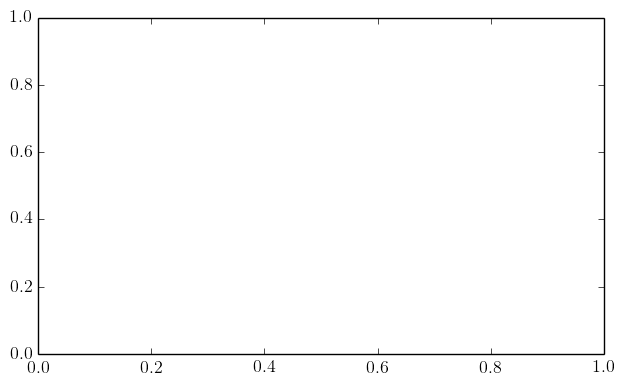

In [75]:
#set up a easy plotting function
def seac_map(ax=plt.gca()):
    m = Basemap(projection='stere',lon_0=-89,lat_0=20,
            llcrnrlon=-98, llcrnrlat=18,
            urcrnrlon=-85, urcrnrlat=32,resolution='h',ax=ax)
    m.drawcoastlines()
    #m.fillcontinents(color='#AAAAAA')
    m.drawstates()
    m.drawcountries()
    m.drawmeridians(np.linspace(-85,-99,8),labels=[0,0,0,1])
    m.drawparallels(np.linspace(18,32,8),labels=[1,0,0,0])
    return m

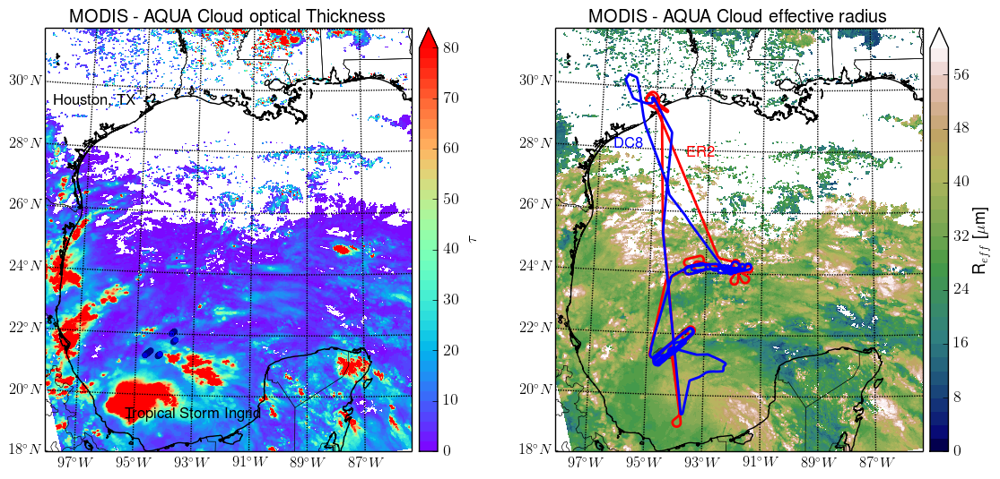

In [37]:
figm2,axm2 = plt.subplots(1,2,figsize=(13,10))
m1 = seac_map(axm2[0])
xt,yt = m1(-95.3831,29.7628)
axm2[0].text(xt,yt,'+')
axm2[0].text(xt,yt,'Houston, TX',horizontalalignment='right',verticalalignment='top')
xh,yh = m1(-95.3,19.1)
axm2[0].text(xh,yh,'+')
axm2[0].text(xh,yh,'Tropical Storm Ingrid',horizontalalignment='left',verticalalignment='bottom')
m2 = seac_map(axm2[1])
x,y = m1(modis['lon'],modis['lat'])
clevels = np.linspace(0,80,41)

cs1 = m1.contourf(x,y,modis['tau'],clevels,cmap=plt.cm.rainbow,extend='max')
cbar = m1.colorbar(cs1)
cbar.set_label('$\\tau$')
axm2[0].set_title('MODIS - AQUA Cloud optical Thickness')
x1,y1 = m1(meas.lon,meas.lat)
xer2,yer2 = m1(er2['Longitude'],er2['Latitude'])
xdc8,ydc8 = m1(dc8['G_LONG'],dc8['G_LAT'])
#m1.plot(xer2,yer2,'r',lw=2.0)
#m1.plot(xdc8,ydc8,'b',lw=2.0)
xx1,yy1 = m1(-93.8,27.8)
xx2,yy2 = m1(-96.5,28)
#plt.text(xx1,yy1,'ER2',color='r')
#plt.text(xx2,yy2,'DC8',color='b')
m1.scatter(x1,y1,c=meas.tau,cmap=plt.cm.jet,marker='o',vmin=clevels[0],vmax=clevels[-1],alpha=0.5,edgecolors='k',linewidth=0.15)

clevels2 = np.linspace(0,60,31)
cs2 = m2.contourf(x,y,modis['ref'],clevels2,cmap=plt.cm.gist_earth,extend='max')
cbar = m2.colorbar(cs2)
cbar.set_label('R$_{eff}$ [$\\mu$m]')
axm2[1].set_title('MODIS - AQUA Cloud effective radius')
m2.plot(xer2,yer2,'r',lw=2)
m2.plot(xdc8,ydc8,'b',lw=2)
plt.text(xx1,yy1,'ER2',color='r')
plt.text(xx2,yy2,'DC8',color='b')
m2.scatter(x1,y1,c=meas.ref,cmap=plt.cm.gist_earth,marker='o',vmin=clevels2[0],vmax=clevels2[-1],alpha=0.5,edgecolors='k',linewidth=0.15)
figm2.subplots_adjust(wspace=0.3)
plt.savefig(fp+'plots/modis_dc8_tau_ref_comp.png',dpi=600,transparent=True)
#plt.savefig(fp+'plots/modis_dc8_tau_ref_comp.pdf',bbox='tight')
plt.show()

## Import eMAS values

In [47]:
if 'lm' in locals():
    reload(lm)
from load_modis import load_emas, load_hdf

In [48]:
emas_file = fp+'er2/20130913/EMASL2_13965_13_20130913_1905_1918_V00.hdf'
print os.path.isfile(emas_file)

True


In [49]:
emas,emas_dicts = load_hdf(emas_file)

Outputting the Data subdatasets:
0: [4644x716] PixelLatitude (32-bit floating-point)
1: [4644x716] PixelLongitude (32-bit floating-point)
2: [4644x716] SensorZenithAngle (16-bit integer)
3: [4644x716] SensorAzimuthAngle (16-bit integer)
4: [4644x716] SolarZenithAngle (16-bit integer)
5: [4644x716] SolarAzimuthAngle (16-bit integer)
6: [4644x716] Spatial_Variability (16-bit integer)
7: [4644x716] Clear_Sky_Restoral_Possibility (8-bit unsigned integer)
8: [4644x716] Cloud_Top_Temperature (16-bit integer)
9: [4644x716] Surface_Temperature (16-bit integer)
10: [4644x716] Cloud_Top_Height (16-bit integer)
11: [4644x716] Cloud_Top_Pressure (16-bit integer)
12: [4644x716] Cloud_Top_Method (8-bit integer)
13: [4644x716] Cloud_Phase_Infrared (8-bit integer)
14: [4644x716] Above_Cloud_Water_Vapor_094 (16-bit integer)
15: [4644x716] Cloud_Optical_Thickness (16-bit integer)
16: [4644x716] Cloud_Optical_Thickness_PCL (16-bit integer)
17: [4644x716] Cloud_Optical_Thickness_16 (16-bit integer)
18: [4

In [50]:
emas_values = (('lat',0),('lon',1),('tau',15),('ref',23),('phase',58),('layer',59),('qa',68))
emas,emas_dicts = load_hdf(emas_file,values=emas_values)

Outputting the Data subdatasets:
0: [4644x716] PixelLatitude (32-bit floating-point)
1: [4644x716] PixelLongitude (32-bit floating-point)
2: [4644x716] SensorZenithAngle (16-bit integer)
3: [4644x716] SensorAzimuthAngle (16-bit integer)
4: [4644x716] SolarZenithAngle (16-bit integer)
5: [4644x716] SolarAzimuthAngle (16-bit integer)
6: [4644x716] Spatial_Variability (16-bit integer)
7: [4644x716] Clear_Sky_Restoral_Possibility (8-bit unsigned integer)
8: [4644x716] Cloud_Top_Temperature (16-bit integer)
9: [4644x716] Surface_Temperature (16-bit integer)
10: [4644x716] Cloud_Top_Height (16-bit integer)
11: [4644x716] Cloud_Top_Pressure (16-bit integer)
12: [4644x716] Cloud_Top_Method (8-bit integer)
13: [4644x716] Cloud_Phase_Infrared (8-bit integer)
14: [4644x716] Above_Cloud_Water_Vapor_094 (16-bit integer)
15: [4644x716] Cloud_Optical_Thickness (16-bit integer)
16: [4644x716] Cloud_Optical_Thickness_PCL (16-bit integer)
17: [4644x716] Cloud_Optical_Thickness_16 (16-bit integer)
18: [4

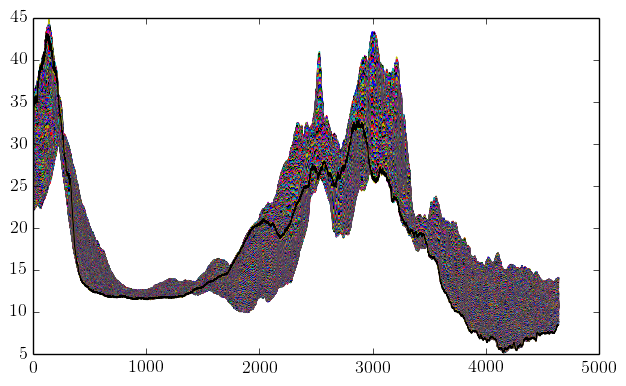

In [80]:
plt.figure()
plt.plot(emas['tau'])

Now Redo the load of emas data, but with the new V01 files, which includes the newest calibration as of 20150122, which is considered final for SEAC4RS. thermal band revisions (3.7 um and higher) may still occur.  

From Tom Arnold 20150120: While the calibration for the V01 data is considered final, some minor revision may still be made to the themal band (3.7um and higher) radiance data for two or three of the tracks I have given you. Separate from the calibration process, filtering (for a coherent noise problem) has been applied to all the eMAS thermal bands (bands 26-38).  Evaluation of the quality of the filtering has shown for some eMAS tracks, some additional filtering is still required (and will likely affect two or three of the tracks I have given you).  I will make that data available when it is completed for the tracks you need, though for the thick cirrus in the tracks you are interested in,  I don’t expect much impact to the cloud retrievals (most impact will be relatively small adjustment to some of the cloud top property data - such as cloud top temperature or pressure). I expect the re-filtered data to be available in the next couple weeks.

There is multiple eMAS files, representing each a different time slice. Load all of them.

In [212]:
emas_file_v1_10 = fp+'emas/20130913/EMASL2_13965_10_20130913_1815_1828_V01.hdf'
emas_file_v1_11 = fp+'emas/20130913/EMASL2_13965_11_20130913_1832_1845_V01.hdf'
emas_file_v1_12 = fp+'emas/20130913/EMASL2_13965_12_20130913_1848_1901_V01.hdf'
emas_file_v1_14 = fp+'emas/20130913/EMASL2_13965_14_20130913_1921_1934_V01.hdf'
emas_file_v1 = fp+'emas/20130913/EMASL2_13965_13_20130913_1905_1918_V01.hdf'
print os.path.isfile(emas_file_v1)

True


In [81]:
print fp
print emas_file_v1

C:/Users/sleblan2/Research/SEAC4RS/
C:/Users/sleblan2/Research/SEAC4RS/emas/20130913/EMASL2_13965_13_20130913_1905_1918_V01.hdf


In [52]:
emas_v1,emas_dicts_v1 = load_hdf(emas_file_v1)

Outputting the Data subdatasets:
0: [4644x716] PixelLatitude (32-bit floating-point)
1: [4644x716] PixelLongitude (32-bit floating-point)
2: [4644x716] SensorZenithAngle (16-bit integer)
3: [4644x716] SensorAzimuthAngle (16-bit integer)
4: [4644x716] SolarZenithAngle (16-bit integer)
5: [4644x716] SolarAzimuthAngle (16-bit integer)
6: [4644x716] Spatial_Variability (16-bit integer)
7: [4644x716] Clear_Sky_Restoral_Possibility (8-bit unsigned integer)
8: [4644x716] Cloud_Top_Temperature (16-bit integer)
9: [4644x716] Surface_Temperature (16-bit integer)
10: [4644x716] Cloud_Top_Height (16-bit integer)
11: [4644x716] Cloud_Top_Pressure (16-bit integer)
12: [4644x716] Cloud_Top_Method (8-bit integer)
13: [4644x716] Cloud_Phase_Infrared (8-bit integer)
14: [4644x716] Above_Cloud_Water_Vapor_094 (16-bit integer)
15: [4644x716] Cloud_Optical_Thickness (16-bit integer)
16: [4644x716] Cloud_Optical_Thickness_PCL (16-bit integer)
17: [4644x716] Cloud_Optical_Thickness_16 (16-bit integer)
18: [4

In [55]:
emas_values = (('lat',0),('lon',1),('tau',15),('ref',23),('phase',58),('layer',59),('qa',68))
emas_v1,emas_dicts_v1 = load_hdf(emas_file_v1, values=emas_values)

Outputting the Data subdatasets:
0: [4644x716] PixelLatitude (32-bit floating-point)
1: [4644x716] PixelLongitude (32-bit floating-point)
2: [4644x716] SensorZenithAngle (16-bit integer)
3: [4644x716] SensorAzimuthAngle (16-bit integer)
4: [4644x716] SolarZenithAngle (16-bit integer)
5: [4644x716] SolarAzimuthAngle (16-bit integer)
6: [4644x716] Spatial_Variability (16-bit integer)
7: [4644x716] Clear_Sky_Restoral_Possibility (8-bit unsigned integer)
8: [4644x716] Cloud_Top_Temperature (16-bit integer)
9: [4644x716] Surface_Temperature (16-bit integer)
10: [4644x716] Cloud_Top_Height (16-bit integer)
11: [4644x716] Cloud_Top_Pressure (16-bit integer)
12: [4644x716] Cloud_Top_Method (8-bit integer)
13: [4644x716] Cloud_Phase_Infrared (8-bit integer)
14: [4644x716] Above_Cloud_Water_Vapor_094 (16-bit integer)
15: [4644x716] Cloud_Optical_Thickness (16-bit integer)
16: [4644x716] Cloud_Optical_Thickness_PCL (16-bit integer)
17: [4644x716] Cloud_Optical_Thickness_16 (16-bit integer)
18: [4

In [214]:
emas_v1_10,emas_dicts_v1_10 = load_hdf(emas_file_v1_10, values=emas_values, verbose=False)
emas_v1_11,emas_dicts_v1_11 = load_hdf(emas_file_v1_11, values=emas_values, verbose=False)
emas_v1_12,emas_dicts_v1_12 = load_hdf(emas_file_v1_12, values=emas_values, verbose=False)
emas_v1_14,emas_dicts_v1_14 = load_hdf(emas_file_v1_14, values=emas_values, verbose=False)

In [56]:
emas_dicts_v1['tau']

{'1.6x um band number used': '10',
 '2.x um band number used': '20',
 'AircraftPlatform': 'ER2 809 (809)',
 'AltitudeCode': 'Global Pos (GPS)',
 'CalibrationName': 'SEAC4RS_103113-103113_071813-0',
 'CalibrationVersion': 'Version 1.0 Calibration',
 'Clear_Sky_Restoral_Status': 'y',
 'Collection_4_Phase_Used': 'n',
 'CompletionDate': '16-Oct-2014 14:28:27',
 'CreationDate': '16-Oct-2014 14:28:13',
 'DataUsersGuideSource': 'http://mas.arc.nasa.gov/',
 'Ending Pixel': '715',
 'Ending Scanline': '4643',
 'ExperimentName': 'SEAC4RS',
 'FlightComment': 'SEAC4RS Science Mission #13 / DC8 Coordination / Tropical Storm Ingrid',
 'FlightDate': '13 Sep 2013',
 'FlightLineComment': 'Flight altitude 62k',
 'FlightLineNumber': '13',
 'FlightNumber': '13-965',
 'GeoLocationProcess': 'Standard',
 'GeographicArea': 'Gulf of Mexico',
 'Ice_Phase_Forced': 'n',
 'Level-2_Creation_Date': '20141218 045023.13',
 'LocationCode': 'Global Pos (GPS)',
 'MAS_PGE06 version': 'MAS_PGE06 version 6.0.81',
 'MGeoContr

In [57]:
from map_utils import map_ind
dc8_ind = map_ind(emas['lon'],emas['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good'][0])

Running through flight track: [########################################]100% -- Done! 


Create different good filters for each different time slice

In [225]:
mea['good_10'] = np.where((mea['utc']>18.15) & (mea['utc']<18.50) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))[0]
mea['good_11'] = np.where((mea['utc']>18.50) & (mea['utc']<18.85) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))[0]
mea['good_12'] = np.where((mea['utc']>18.75) & (mea['utc']<19.10) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))[0]
mea['good_13'] = np.where((mea['utc']>19.00) & (mea['utc']<19.35) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))[0]
mea['good_14'] = np.where((mea['utc']>19.25) & (mea['utc']<19.60) & (mea['Str'].flatten()!=0) & (mea['sat_time'].flatten()==0))[0]

In [227]:
mea['good_13']

array([750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762,
       763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775,
       776, 777, 778, 779, 780, 781, 782, 786, 787, 788, 789, 790, 791, 792], dtype=int64)

In [238]:
print mea['Lat'][mea['good_13']].min(), mea['Lat'][mea['good_13']].max()
print mea['Lon'][mea['good_13']].min(), mea['Lon'][mea['good_13']].max()

21.2719 21.3542
-94.6864 -94.5847


In [239]:
print emas_v1['lat'].min(), emas_v1['lat'].max()
print emas_v1['lon'].min(), emas_v1['lon'].max()

20.9135 22.1125
-94.6073 -93.31


In [256]:
import map_utils as mu
reload(mu)

<module 'map_utils' from 'map_utils.py'>

In [257]:
dc8_ind_10 = mu.map_ind(emas_v1_10['lon'],emas_v1_10['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good_10'])
dc8_ind_11 = mu.map_ind(emas_v1_11['lon'],emas_v1_11['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good_11'])
dc8_ind_12 = mu.map_ind(emas_v1_12['lon'],emas_v1_12['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good_12'])
dc8_ind_13 = mu.map_ind(emas_v1['lon'],emas_v1['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good_13'])
dc8_ind_14 = mu.map_ind(emas_v1_14['lon'],emas_v1_14['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good_14'])

Running through flight track: [########################################]100% -- Done! 
Running through flight track: [########################################]100% -- Done! 
Running through flight track: [########################################]100% -- Done! 
** No points found within range +/- 0.02 in lat and lon, Extending range to +/- 0.2 **
Running through flight track: [########################################]100% -- Done! 
Running through flight track: [########################################]100% -- Done! 


In [258]:
print np.shape(dc8_ind)
print dc8_ind_10.shape
print dc8_ind_11.shape
print dc8_ind_12.shape
print dc8_ind_14.shape

(2L, 180L)
(2L, 137L)
(2L, 101L)
(2L, 117L)
(2L, 1462L)


In [59]:
print dc8_ind[0,-1],dc8_ind[1,-1]
print emas['lon'][388,715],emas['lat'][388,715]
print emas['lon'][388,714],emas['lat'][388,714]

sdist= lambda lon1,lat1,lon2,lat2:1000.0 * 3958.75 * np.arccos(np.cos(np.radians(lat1)-np.radians(lat2)) - np.cos(np.radians(lat1)) * np.cos(np.radians(lat2)) * (1 - np.cos(np.radians(lon1)-np.radians(lon2))))

388 715
-94.5215 21.235
-94.521 21.2345


In [125]:
print '%20.17f' % sdist(emas['lon'][388,715],emas['lat'][388,715],emas['lon'][385,714],emas['lat'][385,714])

 0.00000000000000000


### Now combine all eMAS results

In [271]:
emas_full = dict()
emas_full['lon'] = np.concatenate([emas_v1_10['lon'][dc8_ind_10[0,:],dc8_ind_10[1,:]],
                    emas_v1_11['lon'][dc8_ind_11[0,:],dc8_ind_11[1,:]],
                    emas_v1_12['lon'][dc8_ind_12[0,:],dc8_ind_12[1,:]],
                    emas_v1['lon'][dc8_ind_13[0,:],dc8_ind_13[1,:]],
                    emas_v1_14['lon'][dc8_ind_14[0,:],dc8_ind_14[1,:]]])
emas_full['lat'] = np.concatenate([emas_v1_10['lat'][dc8_ind_10[0,:],dc8_ind_10[1,:]],
                    emas_v1_11['lat'][dc8_ind_11[0,:],dc8_ind_11[1,:]],
                    emas_v1_12['lat'][dc8_ind_12[0,:],dc8_ind_12[1,:]],
                    emas_v1['lat'][dc8_ind_13[0,:],dc8_ind_13[1,:]],
                    emas_v1_14['lat'][dc8_ind_14[0,:],dc8_ind_14[1,:]]])
emas_full['tau'] = np.concatenate([emas_v1_10['tau'][dc8_ind_10[0,:],dc8_ind_10[1,:]],
                    emas_v1_11['tau'][dc8_ind_11[0,:],dc8_ind_11[1,:]],
                    emas_v1_12['tau'][dc8_ind_12[0,:],dc8_ind_12[1,:]],
                    emas_v1['tau'][dc8_ind_13[0,:],dc8_ind_13[1,:]],
                    emas_v1_14['tau'][dc8_ind_14[0,:],dc8_ind_14[1,:]]])
emas_full['ref'] = np.concatenate([emas_v1_10['ref'][dc8_ind_10[0,:],dc8_ind_10[1,:]],
                    emas_v1_11['ref'][dc8_ind_11[0,:],dc8_ind_11[1,:]],
                    emas_v1_12['ref'][dc8_ind_12[0,:],dc8_ind_12[1,:]],
                    emas_v1['ref'][dc8_ind_13[0,:],dc8_ind_13[1,:]],
                    emas_v1_14['ref'][dc8_ind_14[0,:],dc8_ind_14[1,:]]])

Do the mods calculations

In [60]:
from map_utils import map_ind
dc8_ind_modis = map_ind(modis['lon'],modis['lat'],mea['Lon'],mea['Lat'],meas_good=mea['good'][0])

Running through flight track: [########################################]100% -- Done! 


## Load APR-2 HDF files for DC8 radar images

In [11]:
fa = fp+'dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913'
fe = '_R23.h4'
files = ['180527','181019','182329','184933','190145','192149','194031']
aprfiles = [fa+s+fe for s in files]

In [12]:
aprfiles

['C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913180527_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913181019_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913182329_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913184933_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913190145_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913192149_R23.h4',
 'C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913194031_R23.h4']

In [38]:
reload(load_modis)

<module 'load_modis' from 'load_modis.py'>

In [39]:
from load_modis import load_apr
apr = load_apr(aprfiles)

Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913180527_R23.h4
(24L, 159L)
(24L, 600L, 159L)
(24L, 600L, 159L)
Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913181019_R23.h4
(24L, 402L)
(24L, 600L, 402L)
(24L, 600L, 402L)
Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913182329_R23.h4
swaping axes
(24L, 729L)
(24L, 600L, 729L)
(24L, 600L, 729L)
Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913184933_R23.h4
(24L, 364L)
(24L, 600L, 364L)
(24L, 600L, 364L)
Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2_DC8_20130913190145_R23.h4
(24L, 541L)
(24L, 600L, 541L)
(24L, 600L, 541L)
Running file:  C:/Users/sleblan2/Research/SEAC4RS/dc8/20130913//SEAC4RS-APR2_DC8_20130913/SEAC4RS-APR2

<IPython.core.display.Javascript object>


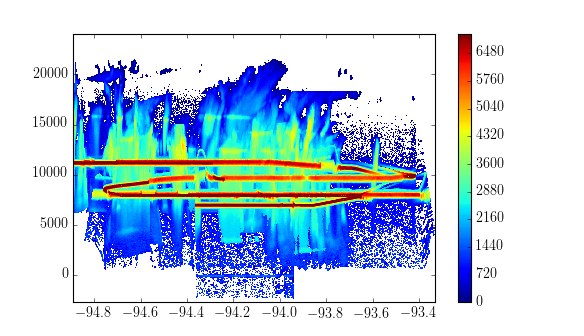

<matplotlib.colorbar.Colorbar instance at 0x00000000BA439688>

In [40]:
levels = np.arange(0,7000,30)
plt.figure()
csz = plt.contourf(apr['lonz'],apr['altflt'],apr['dbz'],levels,cmap=plt.cm.jet)
plt.colorbar(csz)

In [41]:
apr['utcz'] = apr['lonz']*0.0
for i in xrange(len(apr['utc'])):
    apr['utcz'][:,i] = apr['utc'][i]

In [42]:
levels = np.arange(0,7000,30)

<IPython.core.display.Javascript object>


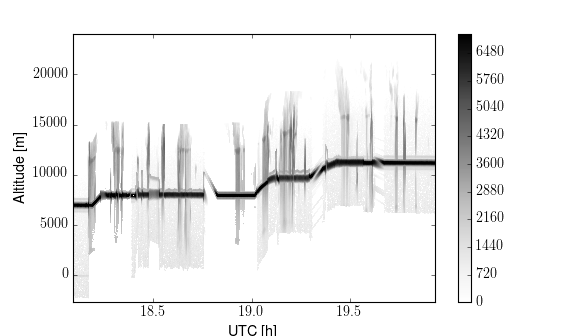

In [43]:
plt.figure()
csz = plt.contourf(apr['utcz'],apr['altflt'],apr['dbz'],levels,cmap=plt.cm.Greys)
plt.colorbar(csz)
plt.xlabel('UTC [h]')
plt.ylabel('Altitude [m]')

<IPython.core.display.Javascript object>


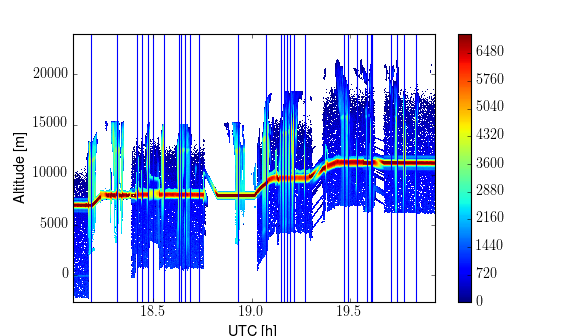

In [45]:
plt.figure()
csz = plt.contourf(apr['utcz'],apr['altflt'],apr['dbz'],levels,cmap=plt.cm.jet)
apr_t = [18.1827,18.3147,18.4175,18.4416,18.4749,18.499,18.5524,18.6285,18.6405,18.6633,18.6886,18.7327,
         18.9308,19.0749,19.1495,19.1655,19.1793,19.1976,19.2137,19.271,19.4728,19.4888,19.536,19.5851,19.6085,19.6151,19.7116,19.738,19.7753,19.8368]
plt.colorbar(csz)
for t in apr_t:
    plt.axvline(t)
plt.xlabel('UTC [h]')
plt.ylabel('Altitude [m]')

<IPython.core.display.Javascript object>


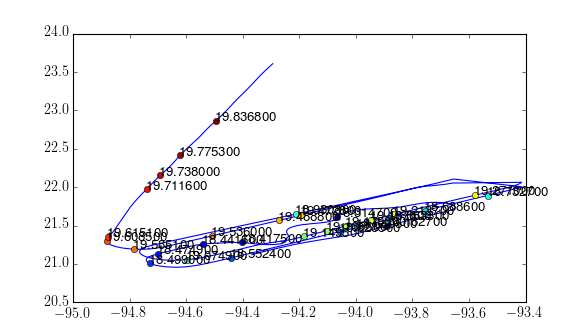

In [46]:
plt.figure()
plt.plot(apr['lonz'][11,:],apr['latz'][11,:])
color.cycle_cmap(len(apr_t),cmap=plt.cm.jet,ax=plt.gca())
for t in apr_t:
    ii = np.abs(apr['utc']-t).argmin()
    plt.plot(apr['lonz'][11,ii],apr['latz'][11,ii],'o')
    plt.annotate('%f'%t,(apr['lonz'][11,ii],apr['latz'][11,ii]))

<IPython.core.display.Javascript object>


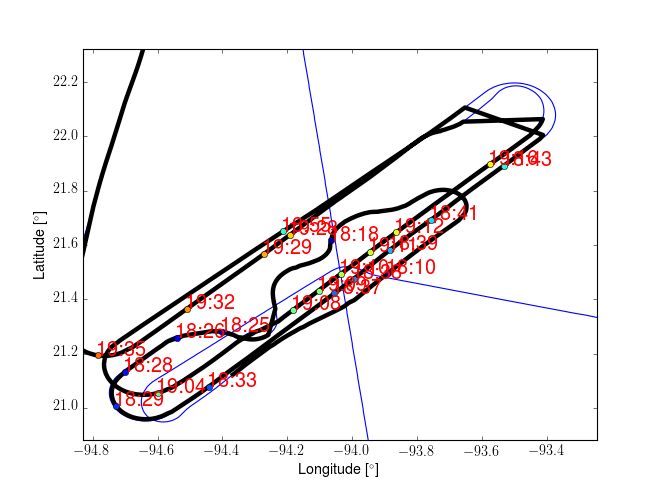

In [52]:
plt.figure()
plt.plot(dc8['G_LONG'],dc8['G_LAT'],'b-')
plt.plot(apr['lonz'][11,:],apr['latz'][11,:],'k-',linewidth=4)
color.cycle_cmap(len(apr_t),cmap=plt.cm.jet,ax=plt.gca())
for t in apr_t[:-6]:
    ii = np.abs(apr['utc']-t).argmin()
    plt.plot(apr['lonz'][11,ii],apr['latz'][11,ii],'o')
    plt.annotate(t2str(t),(apr['lonz'][11,ii],apr['latz'][11,ii]),fontsize=18,color='r')
plt.xlabel('Longitude [$^{\circ}$]')
plt.ylabel('Latitude [$^{\circ}$]')

In [48]:
def t2str(t):
    'Simple function to transform decimal time to string of time HH:MM'
    hh = int(t)
    mm = int((t-hh)*60)
    return '%2i:%02i'% (hh,mm)

In [53]:
apr_t[:-6]

[18.1827,
 18.3147,
 18.4175,
 18.4416,
 18.4749,
 18.499,
 18.5524,
 18.6285,
 18.6405,
 18.6633,
 18.6886,
 18.7327,
 18.9308,
 19.0749,
 19.1495,
 19.1655,
 19.1793,
 19.1976,
 19.2137,
 19.271,
 19.4728,
 19.4888,
 19.536,
 19.5851]

In [54]:
for t in apr_t[:-6]:
    print t2str(t)

18:10
18:18
18:25
18:26
18:28
18:29
18:33
18:37
18:38
18:39
18:41
18:43
18:55
19:04
19:08
19:09
19:10
19:11
19:12
19:16
19:28
19:29
19:32
19:35


In [60]:
it = np.abs(apr['utc']-19.1).argmin()

<IPython.core.display.Javascript object>


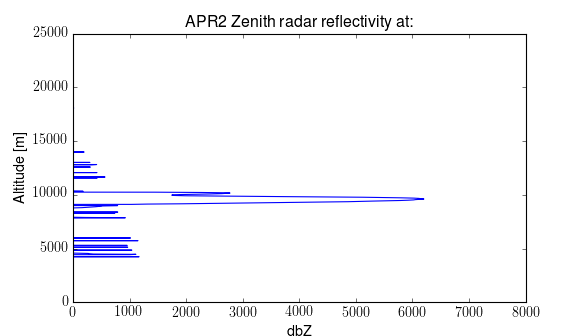

AttributeError: 'numpy.float64' object has no attribute 'iteritems'

In [67]:
plt.figure()
plt.plot(apr['dbz'][:,it],apr['altflt'][:,it])
plt.xlim([0,8000])
plt.xlabel('dbZ')
plt.ylabel('Altitude [m]')
plt.title('APR2 Zenith radar reflectivity at: %f2.2',apr['utc'][it])

(6000, 8000)

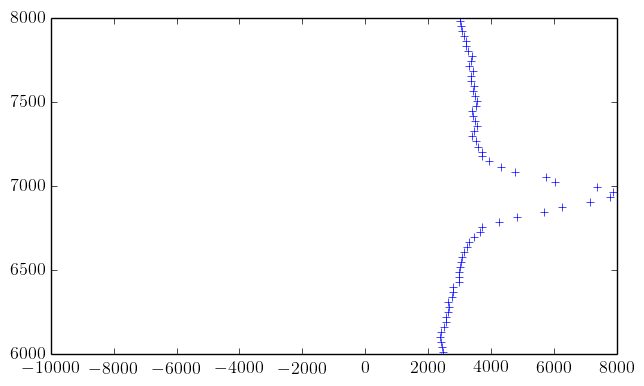

In [163]:
plt.figure
plt.plot(apr['dbz'][:,0],apr['altflt'][:,0],'+')
plt.ylim([6000,8000])

In [68]:
inoisezone = apr['dbz'][:,2000].argmax()
inoisezone

433

In [97]:
apr['dbz'][:,]

array([[-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       ..., 
       [-9999,  1135,  1200, ...,   983, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999],
       [-9999, -9999, -9999, ..., -9999, -9999, -9999]], dtype=int16)

(6000, 10000)

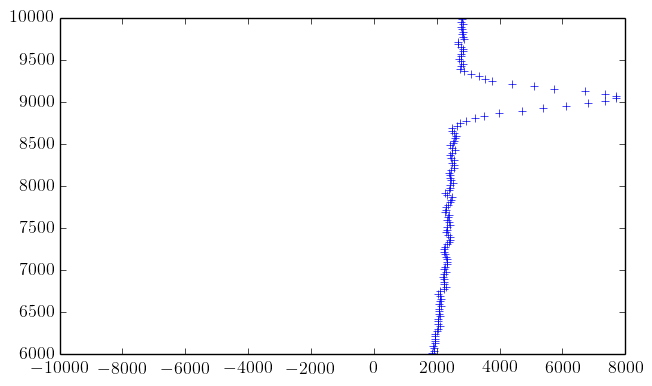

In [172]:
plt.figure
plt.plot(apr['dbz'][:,1000],apr['altflt'][:,1000],'+')
plt.ylim([6000,10000])

In [160]:
apr['altflt'][:,0]

array([  1.55907671e+04,   1.55607671e+04,   1.55307671e+04,
         1.55007671e+04,   1.54707671e+04,   1.54417671e+04,
         1.54117671e+04,   1.53817671e+04,   1.53517671e+04,
         1.53217671e+04,   1.52917671e+04,   1.52627671e+04,
         1.52327671e+04,   1.52027671e+04,   1.51727671e+04,
         1.51427671e+04,   1.51127671e+04,   1.50827671e+04,
         1.50537671e+04,   1.50237671e+04,   1.49937671e+04,
         1.49637671e+04,   1.49337671e+04,   1.49037671e+04,
         1.48747671e+04,   1.48447671e+04,   1.48147671e+04,
         1.47847671e+04,   1.47547671e+04,   1.47247671e+04,
         1.46957671e+04,   1.46657671e+04,   1.46357671e+04,
         1.46057671e+04,   1.45757671e+04,   1.45457671e+04,
         1.45157671e+04,   1.44867671e+04,   1.44567671e+04,
         1.44267671e+04,   1.43967671e+04,   1.43667671e+04,
         1.43367671e+04,   1.43077671e+04,   1.42777671e+04,
         1.42477671e+04,   1.42177671e+04,   1.41877671e+04,
         1.41577671e+04,

(0, 20000)

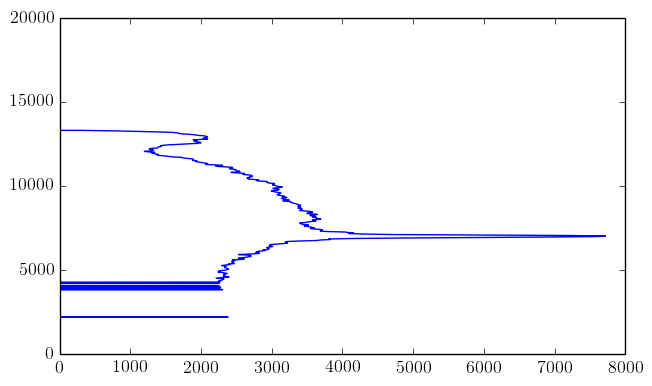

In [213]:
plt.figure
plt.plot(apr['dbz'][11,:,0],apr['altz'][11,:,0]+apr['alt'][11,0])
plt.xlim([0,8000])
plt.ylim([0,20000])

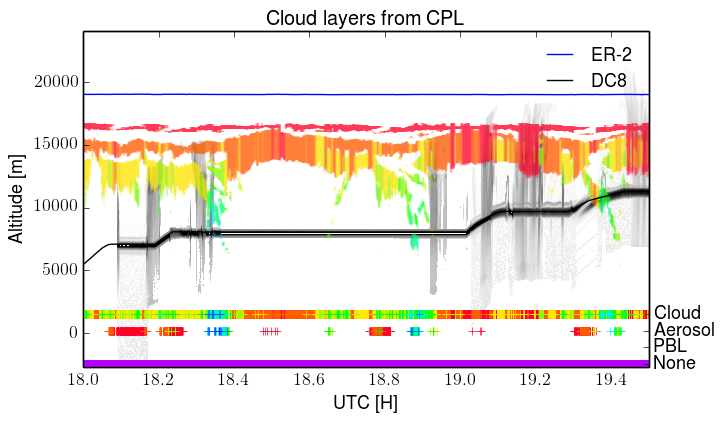

In [116]:
fig,ax = plt.subplots(1,1)
ax2 = ax.twinx()
ax2.set_yticks([0,1000,2000,3000])
ax2.set_yticklabels(['None','PBL','Aerosol','Cloud'])
ax2.set_ylim([-200,20000])
csz = ax.contourf(apr['utcz'],apr['altflt'],apr['dbz'],levels,cmap=plt.cm.Greys)
for i in xrange(10):
    ax.vlines(cpl_layers['utc'],cpl_layers['bot'][:,i],cpl_layers['top'][:,i],lw=0.1,color=plt.cm.gist_rainbow(i/10.0))
    ax2.plot(cpl_layers['utc'],cpl_layers['type'][:,i]*1000,'+',color=plt.cm.gist_rainbow(i/10.0))
plt.title('Cloud layers from CPL')
ax.set_xlabel('UTC [H]')
ax.set_ylabel('Altitude [m]')
ax.set_xlim([18.0,19.5])
ax.plot(er2['Start_UTC'],er2['GPS_Altitude'],label="ER-2",color='b')
ax.plot(dc8['TIME_UTC'],dc8['G_ALT'],label="DC8",color='k')
ax.legend(frameon=False)

In [69]:
it = np.abs(apr['utc']-19.19).argmin()
inoisezone = apr['dbz'][:,it].argmax()
i=range(inoisezone-15)+range(inoisezone+15,len(apr['altflt'][:,0]))

In [99]:
print 0.19*60
print 0.10*60

11.4
6.0


In [70]:
apr['utc'][it]

19.190000000000001

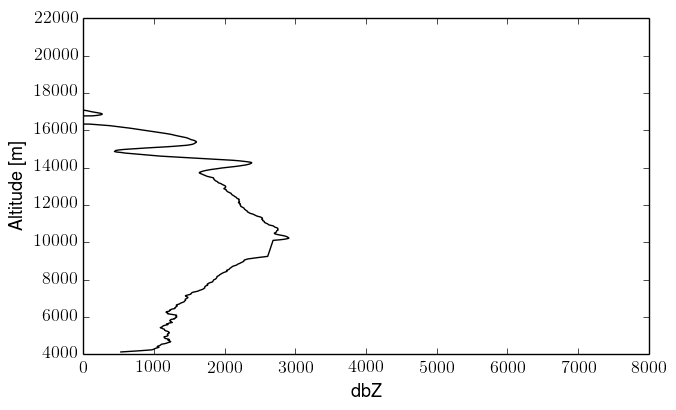

In [152]:
plt.figure
plt.plot(smooth(apr['dbz'][i,it],10),apr['altflt'][i,it],'k')
plt.xlim([0,8000])
plt.xlabel('dbZ')
plt.ylabel('Altitude [m]')
#plt.title('APR2 Zenith radar reflectivity at: ',apr['utc'][it])

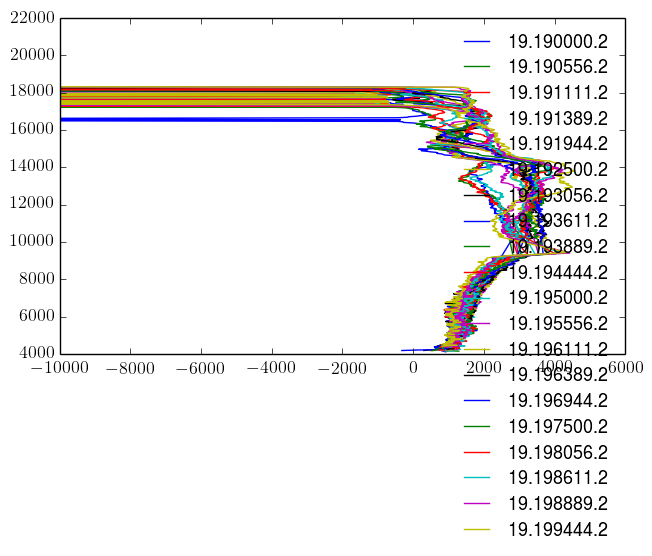

In [268]:
plt.figure()
for j in xrange(20):
    plt.plot(apr['dbz'][i,it+j],apr['altflt'][i,it+j],label='%f.2'%apr['utc'][it+j])
plt.legend(frameon=False)

## Load the cloud probe data

In [71]:
prb_file = fp+'dc8/20130913/SEAC4RS_20130913_Reff.txt'
probes = np.genfromtxt(prb_file,skip_header=2)

In [72]:
print probes[:,1]
print probes[:,2]

[ 180004.  181020.  181044.  181110.  181420.  181720.  181856.  182026.
  182820.  183303.  183831.  183901.  183911.  183935.  184135.  185358.
  190130.  191234.  192458.  193120.  193804.  194100.]
[ 180025.  181044.  181105.  181240.  181700.  181810.  181931.  182036.
  182841.  183324.  183853.  183906.  183922.  184046.  184635.  185505.
  190900.  192310.  192620.  193500.  194100.  194400.]


(22L, 9L)
[ 16.74  44.37  31.95  71.43  57.96  54.27  50.69  71.17  46.49  50.46
  52.32  67.18  53.15  71.78  56.35  63.94  56.69  57.21  34.76  34.12
  44.29  46.02]


(array([ 1.,  0.,  1.,  2.,  0.,  4.,  5.,  4.,  1.,  4.]),
 array([ 16.74 ,  22.244,  27.748,  33.252,  38.756,  44.26 ,  49.764,
         55.268,  60.772,  66.276,  71.78 ]),
 <a list of 10 Patch objects>)

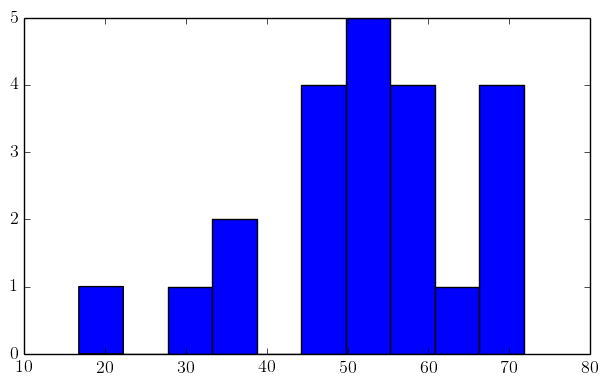

In [73]:
print probes.shape
print probes[:,7]
plt.figure()
plt.hist(probes[:,7])

## Load 2DS data for effective radius at specific times

In [74]:
twoDS = load_ict(fp+'dc8/20130913/seac4rs-2DS_DC8_20130913_R0.ict')

('Start_UTC', 'sv', 'conc', 'ext', 'iwc', 'irregularCNT', 'meanD', 'medianvolD', 'effectiveD', 'nbin01', 'nbin02', 'nbin03', 'nbin04', 'nbin05', 'nbin06', 'nbin07', 'nbin08', 'nbin09', 'nbin10', 'nbin11', 'nbin12', 'nbin13', 'nbin14', 'nbin15', 'nbin16', 'nbin17', 'nbin18', 'nbin19', 'nbin20', 'nbin21', 'nbin22', 'nbin23', 'nbin24', 'nbin25', 'nbin26', 'nbin27', 'nbin28', 'nbin29', 'nbin30', 'nbin31', 'nbin32', 'nbin33', 'nbin34', 'nbin35', 'nbin36', 'nbin37', 'nbin38', 'nbin39', 'nbin40', 'nbin41', 'nbin42', 'nbin43', 'nbin44', 'nbin45', 'nbin46', 'nbin47', 'nbin48', 'nbin49', 'nbin50', 'nbin51', 'nbin52', 'nbin53', 'nbin54', 'nbin55', 'nbin56', 'nbin57', 'nbin58', 'nbin59', 'nbin60', 'nbin61', 'abin01', 'abin02', 'abin03', 'abin04', 'abin05', 'abin06', 'abin07', 'abin08', 'abin09', 'abin10', 'abin11', 'abin12', 'abin13', 'abin14', 'abin15', 'abin16', 'abin17', 'abin18', 'abin19', 'abin20', 'abin21', 'abin22', 'abin23', 'abin24', 'abin25', 'abin26', 'abin27', 'abin28', 'abin29', 'abin

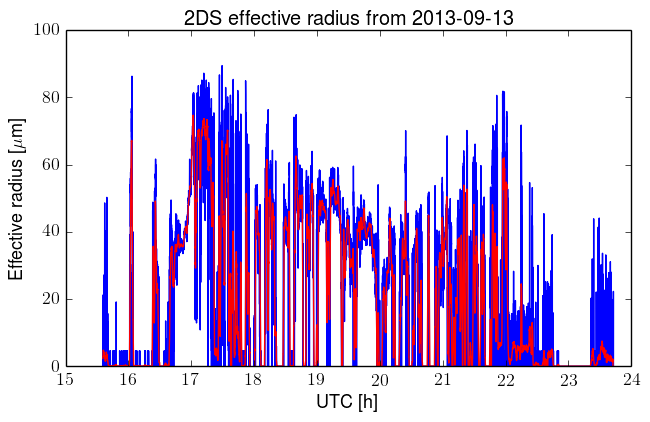

In [61]:
plt.figure
plt.plot(twoDS['Start_UTC'],twoDS['effectiveD']/2.0)
plt.plot(twoDS['Start_UTC'],smooth(twoDS['effectiveD']/2.0,60),'r')
plt.ylim([0,100])
plt.xlabel('UTC [h]')
plt.ylabel('Effective radius [$\\mu$m]')
plt.title('2DS effective radius from 2013-09-13')

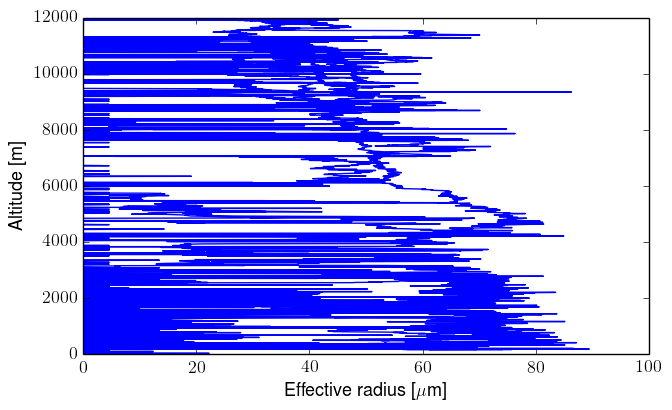

In [62]:
plt.figure
plt.plot(twoDS['effectiveD'][1:]/2.0,dc8['G_ALT'])
plt.xlim([0,100])
plt.xlabel('Effective radius [$\\mu$m]')
plt.ylabel('Altitude [m]')

In [75]:
# filter the data and only show a part
twoDS['effectiveD'][twoDS['effectiveD']<0] = np.nan
fl = np.where((twoDS['Start_UTC'] > 18.025) & (twoDS['Start_UTC'] < 19.45) & (twoDS['effectiveD'] > 28.0))

TypeError: tuple indices must be integers, not str

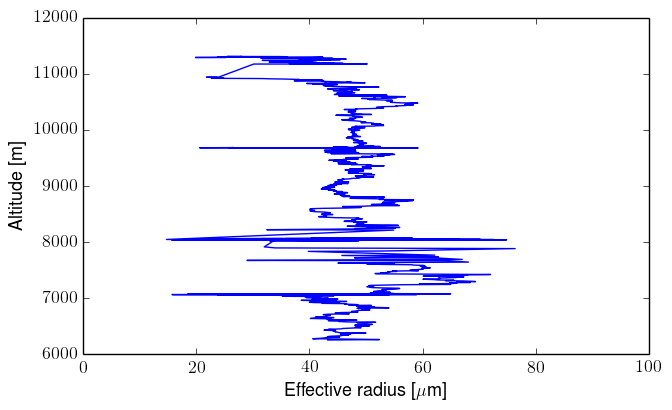

In [100]:
plt.figure
plt.plot(twoDS['effectiveD'][fl]/2.0,dc8['G_ALT'][fl],label='Cloud Probes (2DS)')
plt.xlim([0,100])
plt.xlabel('Effective radius [$\\mu$m]')
plt.ylabel('Altitude [m]')

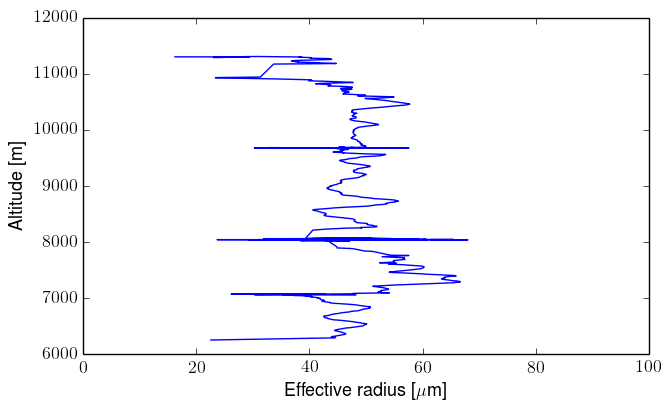

In [102]:
plt.figure
plt.plot(smooth(twoDS['effectiveD'][fl]/2.0,10),dc8['G_ALT'][fl],label='Cloud Probes (2DS)')
plt.xlim([0,100])
plt.xlabel('Effective radius [$\\mu$m]')
plt.ylabel('Altitude [m]')

## Load CCN results

In [681]:
ccn,ccnhead = load_ict(fp+'dc8/20130913/SEAC4RS-CCN_DC8_20130913_R0.ict',return_header=True)

('UTC_mid', 'Number_Concentration_STP', 'Number_Concentration', 'Supersaturation')


In [673]:
ccnhead

['36, 1001\n',
 'Nenes, Athanasios\n',
 'Georgia Institute of Technology\n',
 'NASA LARGE CCN Counter\n',
 'SEAC4RS 2013\n',
 '1, 1\n',
 '2013, 09, 13, 2014, 10, 31\n',
 '1\n',
 'UTC_mid, secs after midnight, time of acquisition\n',
 '3\n',
 '1, 1, 1\n',
 '-9999, -9999, -999\n',
 'Number_Concentration_STP, cm-3, CCN number concentration at 0 Celcius and 1 atm\n',
 'Number_Concentration, cm-3, CCN number concentration at ambient conditions\n',
 'Supersaturation, %, CCNC instrument supersaturation\n',
 '1\n',
 'SPECIAL COMMENTS:Concentrations are dependent on supersaturation.\n',
 '18 \n',
 'PI_CONTACT_INFO: athanasios.nenes@gatech.edu\n',
 'PLATFORM: NASA DC-8 aircraft.\n',
 'LOCATION: The aircraft was stationed in Ellington Field, TX. Latitude, longitude, and altitude included in data records.\n',
 'ASSOCIATED_DATA: N/A\n',
 'INSTRUMENT_INFO: Droplet Measurement Technologies Stream-wise Thermal Gradient Continuous-Flow CCN Counter\n',
 'DATA_INFO: Units: Number concentrations (#/cm3); 

In [685]:
ccn['Number_Concentration'][ccn['Number_Concentration']==-8888]=np.nan
ccn['Number_Concentration_STP'][ccn['Number_Concentration_STP']==-8888]=np.nan
ccn['Supersaturation'][ccn['Supersaturation']==-999]=np.nan

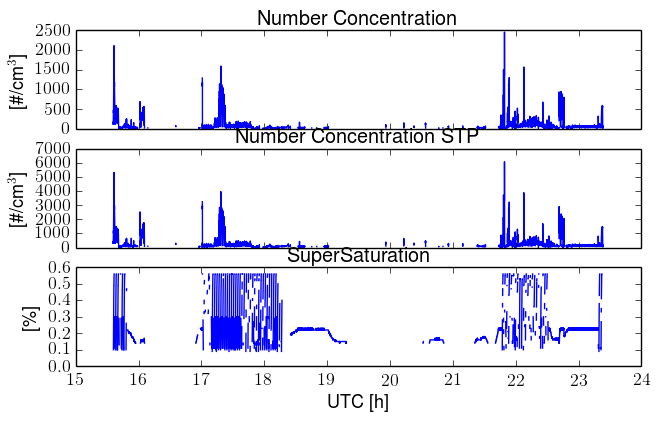

In [686]:
fig,ax = plt.subplots(3,1,sharex=True)
ax[0].plot(ccn['UTC_mid'],ccn['Number_Concentration'])
ax[1].plot(ccn['UTC_mid'],ccn['Number_Concentration_STP'])
ax[2].plot(ccn['UTC_mid'],ccn['Supersaturation'])
ax[0].set_title('Number Concentration')
ax[1].set_title('Number Concentration STP')
ax[2].set_title('SuperSaturation')
ax[2].set_xlabel('UTC [h]')
ax[0].set_ylabel('[\#/cm$^{3}$]')
ax[1].set_ylabel('[\#/cm$^{3}$]')
ax[2].set_ylabel('[\%]')

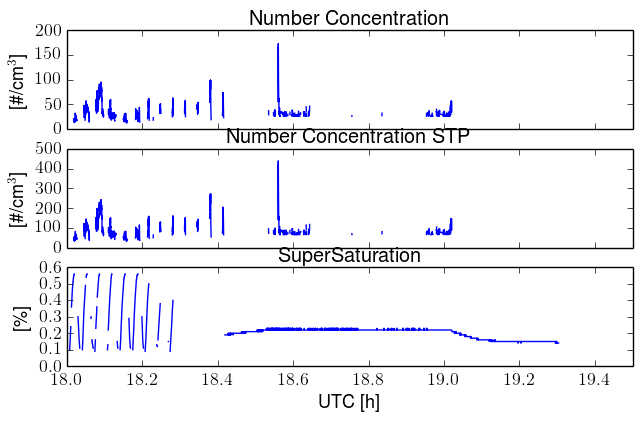

In [687]:
fig,ax = plt.subplots(3,1,sharex=True)
ax[0].plot(ccn['UTC_mid'],ccn['Number_Concentration'])
ax[1].plot(ccn['UTC_mid'],ccn['Number_Concentration_STP'])
ax[2].plot(ccn['UTC_mid'],ccn['Supersaturation'])
ax[0].set_title('Number Concentration')
ax[1].set_title('Number Concentration STP')
ax[2].set_title('SuperSaturation')
ax[2].set_xlabel('UTC [h]')
ax[2].set_xlim([18.0,19.5])
ax[0].set_ylim([0,200])
ax[1].set_ylim([0,500])
ax[0].set_ylabel('[\#/cm$^{3}$]')
ax[1].set_ylabel('[\#/cm$^{3}$]')
ax[2].set_ylabel('[\%]')

(18, 19.5)

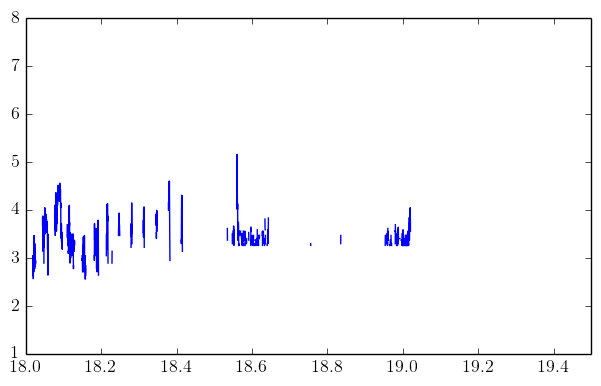

In [688]:
plt.plot(ccn['UTC_mid'],np.log(ccn['Number_Concentration']))
plt.xlim([18,19.5])

In [689]:
from Sp_parameters import find_closest
id = find_closest(dc8['TIME_UTC'],ccn['UTC_mid'])

In [690]:
ccn_good = np.where((ccn['UTC_mid']>18.0)&(ccn['UTC_mid']<19.5)& (np.isfinite(ccn['Number_Concentration'])))[0]

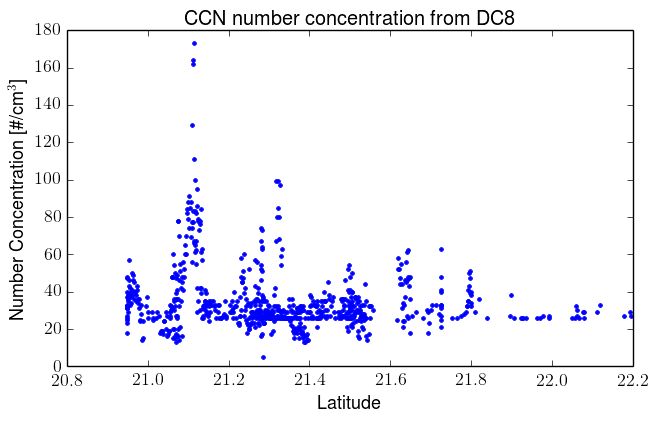

In [692]:
plt.plot(dc8['G_LAT'][id[ccn_good]],ccn['Number_Concentration'][ccn_good],'b.')
plt.xlabel('Latitude')
plt.ylabel('Number Concentration [\#/cm$^{3}$]')
plt.title('CCN number concentration from DC8')

## Load RSP results

In [301]:
rsp,rsp_header = load_ict(fp+'er2/20130913/SEAC4RS-RSP-ICECLD_ER2_20130913_R2.ict',return_header=True)
print rsp['Phase']
rsp_good = np.where((rsp['UTC']>17.8) & (rsp['UTC']<19.2) & (rsp['Phase']==0) & (rsp['COT']>0) & (rsp['R_eff159']>0))
print np.shape(rsp_good)
print len(rsp_good[0])

('UTC', 'Time_stop', 'Lat', 'Lon', 'Land_Ocean', 'Cloudmask', 'Phase', 'LI', 'Elevated_LI', 'SpecRI', 'CTH_stereo', 'CTH_Rayleigh', 'COT', 'AR', 'Shape', 'Distortion', 'g', 'R_eff159', 'R_eff225')
[    0.     0.     0. ..., -7777. -7777. -7777.]
(1L, 2637L)
2637


In [302]:
rsp_header

[' 57 , 1001\n',
 'van Diedenhoven, Bastiaan\n',
 'Columbia University / NASA Goddard Institute for Space Studies\n',
 'RSP ice cloud retrievals\n',
 'SEAC4RS\n',
 '1, 1\n',
 '2013, 09, 13, 2014, 10, 22\n',
 '0\n',
 'UTC, seconds\n',
 '18\n',
 '1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1\n',
 '-9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999, -9999\n',
 'Time_stop, Seconds, Time stop\n',
 'Lat, Degrees, Latitude\n',
 'Lon, Degrees, Longitude\n',
 'Land_Ocean, None, Land=0; Ocean=1\n',
 'Cloudmask, None, Cloudmask; 0=no cloud, 1=cloud, 2=cloud or thick aerosol\n',
 'Phase, None, Thermodynamic phase; 0=ice, 1=liquid, 2=elevated liquid\n',
 'LI, None, Liquid_index\n',
 'Elevated_LI, None, Elevated layer liquid_index\n',
 'SpecRI, None, Specular reflection index\n',
 'CTH_stereo, km, hyper-stereo cloud top height\n',
 'CTH_Rayleigh, km, Rayleigh cloud top height\n',
 'COT, None, Cloud optical thickness\n',
 'AR, 

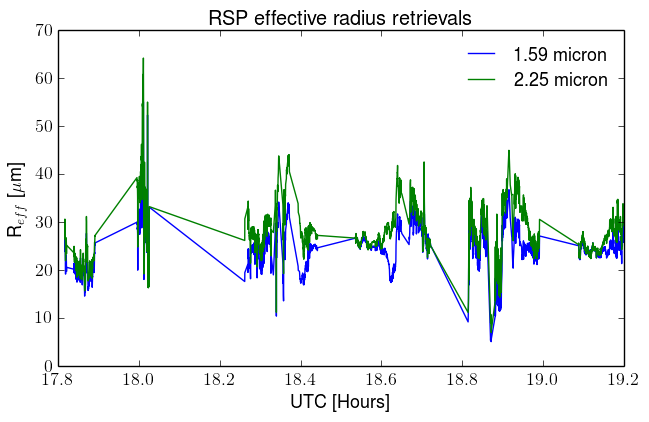

In [86]:
plt.plot(rsp['UTC'][rsp_good[0]],rsp['R_eff159'][rsp_good[0]],label='1.59 micron')
plt.plot(rsp['UTC'][rsp_good[0]],rsp['R_eff225'][rsp_good[0]],label='2.25 micron')
plt.xlabel('UTC [Hours]')
plt.ylabel('R$_{eff}$ [$\\mu$m]')
plt.title('RSP effective radius retrievals')
plt.legend(frameon=False)
plt.savefig(fp+'plots/20130913_RSP_reff.png',dpi=600,transparent=True)

In [87]:
print rsp_good[0][-1]

7862


In [88]:
# get the distance between two points for RSP
from map_utils import spherical_dist
print rsp['Lat'][rsp_good[0][-1]], rsp['Lon'][rsp_good[0][-1]]
print rsp['Lat'][rsp_good[0][-2]], rsp['Lon'][rsp_good[0][-2]]
print spherical_dist(np.array((rsp['Lat'][rsp_good[0][-1]],rsp['Lon'][rsp_good[0][-1]])),
                     np.array((rsp['Lat'][rsp_good[0][-2]],rsp['Lon'][rsp_good[0][-2]])))

21.5486 -93.926
21.5478 -93.9271
0.0897354397421


## Calculate the histogram for each comparisons

In [272]:
from Sp_parameters import nanmasked
modis_tau,im = nanmasked(modis['tau'][dc8_ind_modis[0,:],dc8_ind_modis[1,:]])
emas_tau,ie = nanmasked(emas['tau'][dc8_ind[0,:],dc8_ind[1,:]])
emas_tau_v1,ie1 = nanmasked(emas_v1['tau'][dc8_ind[0,:],dc8_ind[1,:]])
emas_tau_full,ief = nanmasked(emas_full['tau'])
modis_ref,im = nanmasked(modis['ref'][dc8_ind_modis[0,:],dc8_ind_modis[1,:]])
emas_ref,ie = nanmasked(emas['ref'][dc8_ind[0,:],dc8_ind[1,:]])
emas_ref_v1,ie1 = nanmasked(emas_v1['ref'][dc8_ind[0,:],dc8_ind[1,:]])
emas_ref_full,ief = nanmasked(emas_full['ref'])
star_tau,ist = nanmasked(meas.tau[meas.good])
star_ref,ist = nanmasked(meas.ref[meas.good])
ssfr.good = np.where((ssfr.utc>17.8)&(ssfr.utc<19.2))
ssfr_tau,iss = nanmasked(ssfr.tau[ssfr.good[0],1])
ssfr_ref,iss = nanmasked(ssfr.ref[ssfr.good[0],1])
rsp_tau,irs = nanmasked(rsp['COT'][rsp_good[0]])
rsp_ref,irs = nanmasked(rsp['R_eff159'][rsp_good[0]])

In [90]:
star_g = np.where((meas.utc>19.0)&(meas.utc<19.2)&isfinite(meas.tau))
print '4STAR',meas.tau[star_g[0][0]], meas.ref[star_g[0][0]]
ssfr_g = np.where((ssfr.utc>19.0)&(ssfr.utc<19.2)&isfinite(ssfr.tau[:,1]))
print 'ssfr reflect',ssfr.tau[ssfr_g[0][0],1],ssfr.ref[ssfr_g[0][0],1]
rsp_g = np.where((rsp['UTC']>19.0)&(rsp['UTC']<19.2)&isfinite(rsp['COT']))
print 'rsp',rsp['COT'][rsp_g[0][0]],rsp['R_eff159'][rsp_g[0][0]]
print 'emas',emas['tau'][dc8_ind[0,0],dc8_ind[1,0]],emas['ref'][dc8_ind[0,0],dc8_ind[1,0]]
print 'emas_v1',emas_v1['tau'][dc8_ind[0,0],dc8_ind[1,0]],emas_v1['ref'][dc8_ind[0,0],dc8_ind[1,0]]
print 'modis',modis['tau'][dc8_ind_modis[0,0],dc8_ind_modis[1,0]],modis['ref'][dc8_ind_modis[0,0],dc8_ind_modis[1,0]] 

4STAR 10.6 37.0
ssfr reflect 9.0 43.0
rsp 34.1176 25.1006
emas 12.45 29.44
emas_v1 13.08 29.39
modis 14.7899996694 33.0299992617


In [91]:
def plot_median_mean(x,lbl=False,color='k'):
    "plot the vertical median and mean over a histogram, if lbl set to true, sets the labels of the lines,default color='k'"
    if lbl:
        llm = 'Mean'
        lld = 'Median'
    else:
        llm = None
        lld = None
    plt.axvline(np.nanmean(x),color='k',label=llm,c=color,lw=2)
    plt.axvline(np.median(x),color='k',linestyle='--',label=lld,c=color,lw=2)

Now we present the histogram of retrieved cloud properties for each instrument
The instruments have different cross sectional area at cloud height that they sample
These are:, with the ratio of smoothing:
 - MODIS : 500m : 6
 - emas : 50m : 60
 - SSFR(reflectance) : 3000m : 1
 - RSP: 42 m : 70
 - 4STAR: 70 m : 40

## Run through data and convolve to get the same area

ER-2 Altitude: 19018 m
DC8 Altitude: 8047 m
Cloud base height: 13610 m
Cloud top height: 16489 m
 - Modis: 500 m
 - eMAS: 50m or 2.5 mrad FOV ()
 - RSP: 14 mrad FOV
 - 4STAR: 2 degree, 0.0349 rads
 - GOES: 1km
 - SSFR: 180 degrees, Pi rads

In [92]:
cld_base = 13610.0
cld_top = 16489.0
er2_hgt = 19018.0
dc8_hgt = 8047.0
r_eMAS = (er2_hgt - cld_top)*tan(0.0025)
r_RSP = (er2_hgt - cld_top)*tan(0.014)
r_SSFR = (er2_hgt - cld_top)*tan(pi/3)
r_4STAR = (cld_base - dc8_hgt)*tan(0.0349)

In [93]:
print r_eMAS
print r_RSP
print r_SSFR
print r_4STAR

6.32251317191
35.4083133734
4380.35649234
194.227563442


## Plot histogram of different tau and ref comparison

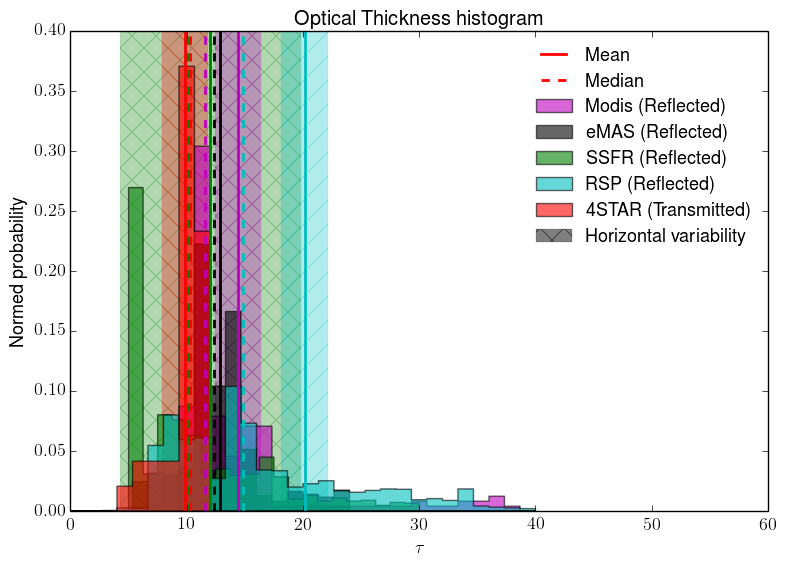

In [275]:
fig,ax = plt.subplots(1,figsize=(9,6))

import matplotlib.transforms as mtransforms
trans1 = mtransforms.blended_transform_factory(ax.transAxes, ax.transAxes)
trans = mtransforms.blended_transform_factory(ax.transData, ax.transAxes)

plt.fill_between([0,1],0,1,transform=trans1,color='#FFFFFF')
plt.fill_between([np.nanmean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2))-7.8,np.nanmean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2))+7.8],
                 0,1,transform=trans,color='g',edgecolor='g',hatch='x',linewidth=0.2,alpha=0.3)
plt.fill_between([np.nanmean(smooth(modis_tau,6))-2.0,np.nanmean(smooth(modis_tau,6))+2.0],0,1,transform=trans,
                 color='m',edgecolor='m',alpha=0.3,hatch='x',linewidth=0.2)
plt.fill_between([np.nanmean(smooth(rsp_tau,70))-2.0,np.nanmean(smooth(rsp_tau,70))+2.0],0,1,transform=trans,
                 color='c',edgecolor='c',alpha=0.3,hatch='/',linewidth=0.2)
plt.fill_between([np.nanmean(smooth(star_tau,40))-2.0,np.nanmean(smooth(star_tau,40))+2.0],0,1,transform=trans,
                 color='r',edgecolor='r',alpha=0.3,hatch='\\',linewidth=0.2)

plt.hist(smooth(modis_tau,6),bins=30, histtype='stepfilled', normed=True, color='m',alpha=0.6, label='Modis (Reflected)',range=(0,40))
#plt.hist(smooth(emas_tau,60),bins=30, histtype='stepfilled', normed=True, color='b',alpha=0.6, label='eMAS (Reflected)',range=(0,40))
#plt.hist(smooth(emas_tau_v1,60),bins=30, histtype='stepfilled', normed=True, color='k',alpha=0.6, label='eMAS (Reflected)',range=(0,40))
plt.hist(smooth(emas_tau_full,60),bins=30, histtype='stepfilled', normed=True, color='k',alpha=0.6, label='eMAS (Reflected)',range=(0,40))
plt.hist(smooth(ssfr_tau,2),bins=20, histtype='stepfilled', normed=True, color='g',alpha=0.6, label='SSFR (Reflected)',range=(5,30))
plt.hist(smooth(rsp_tau,70),bins=30, histtype='stepfilled', normed=True, color='c',alpha=0.6, label='RSP (Reflected)',range=(0,40))
plt.hist(smooth(star_tau,40),bins=30, histtype='stepfilled', normed=True, color='r',alpha=0.6, label='4STAR (Transmitted)',range=(0,40))
plt.title('Optical Thickness histogram')
plt.ylabel('Normed probability')
plt.xlabel('$\\tau$')
plot_median_mean(smooth(modis_tau,6),color='m')
#plot_median_mean(smooth(emas_tau ,60),color='b')
#plot_median_mean(smooth(emas_tau_v1,60),color='k')
plot_median_mean(smooth(emas_tau_full,60),color='k')
plot_median_mean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2),color='g')
plot_median_mean(smooth(star_tau,40),color='r',lbl=True)
plot_median_mean(smooth(rsp_tau,70),color='c')

xr = ax.get_xlim()
yr = ax.get_ylim()
ax.add_patch(plt.Rectangle((0,0),0,0,color='none',edgecolor='g',hatch='x',linewidth=0.2,alpha=0.5,label='Horizontal variability'))
ax.set_xlim(xr)
ax.set_ylim(yr)

plt.legend(frameon=False)
plt.xlim([0,60])
plt.savefig(fp+'plots/hist_modis_4star_tau_v4_fill.png',dpi=600,transparent=True)
#plt.savefig(fp+'plots/hist_modis_4star_tau.pdf',bbox='tight')

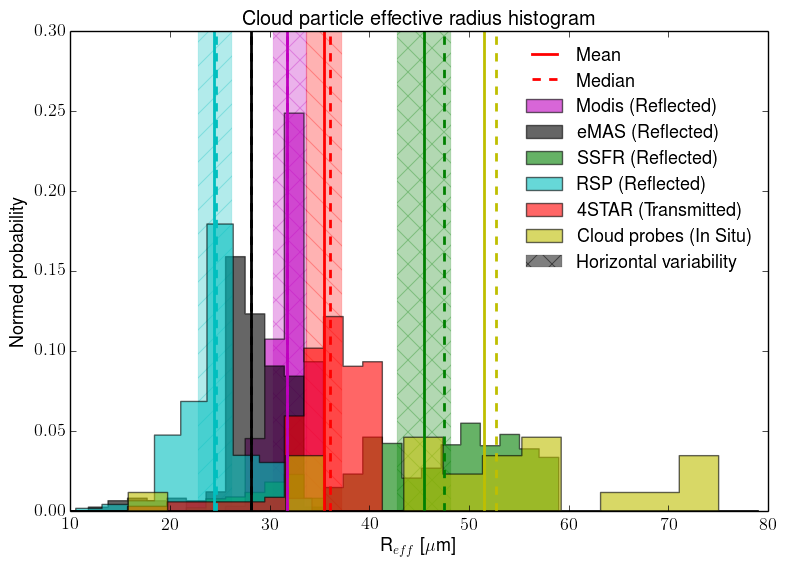

In [274]:
fig,ax = plt.subplots(1,figsize=(9,6))
import matplotlib.transforms as mtransforms
trans1 = mtransforms.blended_transform_factory(ax.transAxes, ax.transAxes)
trans = mtransforms.blended_transform_factory(ax.transData, ax.transAxes)

plt.fill_between([0,1],0,1,transform=trans1,color='#FFFFFF')
plt.fill_between([np.nanmean(ssfr_ref)-2.7,np.nanmean(ssfr_ref)+2.7],0,1,transform=trans,
                 color='g',edgecolor='g',hatch='x',linewidth=0.2,alpha=0.3)
plt.fill_between([np.nanmean(modis_ref)-1.7,np.nanmean(modis_ref)+1.7],0,1,transform=trans,
                 color='m',edgecolor='m',alpha=0.3,hatch='x',linewidth=0.2)
plt.fill_between([np.nanmean(rsp_ref)-1.7,np.nanmean(rsp_ref)+1.7],0,1,transform=trans,
                 color='c',edgecolor='c',alpha=0.3,hatch='/',linewidth=0.2)
plt.fill_between([np.nanmean(star_ref)-1.8,np.nanmean(star_ref)+1.8],0,1,transform=trans,
                 color='r',edgecolor='r',alpha=0.3,hatch='\\',linewidth=0.2)

#plt.axvspan(0,80,color='#FFFFFF')
#plt.axvspan(np.nanmean(modis_ref)-1.7,np.nanmean(modis_ref)+1.7,color='m',alpha=0.7)
#plt.axvspan(np.nanmean(ssfr_ref)-2.7,np.nanmean(ssfr_ref)+2.7,color='g',alpha=0.7)
#plt.axvspan(np.nanmean(rsp_ref)-1.7,np.nanmean(rsp_ref)+1.7,color='c',alpha=0.7)
#plt.axvspan(np.nanmean(star_ref)-1.8,np.nanmean(star_ref)+1.8,color='r',alpha=0.7)
plt.hist(smooth(modis_ref,6),bins=30, histtype='stepfilled', normed=True, color='m',alpha=0.6, label='Modis (Reflected)',range=(0,59))
#plt.hist(smooth(emas_ref,60),bins=30, histtype='stepfilled', normed=True, color='b',alpha=0.6, label='eMAS (Reflected)',range=(0,59))
#plt.hist(smooth(emas_ref_v1,60),bins=30, histtype='stepfilled', normed=True, color='k',alpha=0.6, label='eMAS (Reflected)',range=(0,59))
plt.hist(smooth(emas_ref_full,60),bins=30, histtype='stepfilled', normed=True, color='k',alpha=0.6, label='eMAS (Reflected)',range=(0,59))
plt.hist(smooth(ssfr_ref,2),bins=30, histtype='stepfilled', normed=True, color='g',alpha=0.6, label='SSFR (Reflected)',range=(0,59))
plt.hist(smooth(rsp_ref,70),bins=30, histtype='stepfilled', normed=True, color='c',alpha=0.6, label='RSP (Reflected)',range=(0,79))
plt.hist(star_ref,bins=30, histtype='stepfilled', normed=True, color='r',alpha=0.6, label='4STAR (Transmitted)',range=(0,59))
plt.hist(probes[:,7],bins=20, histtype='stepfilled', normed=True, color='y',alpha=0.6, label='Cloud probes (In Situ)',range=(0,79))
plt.title('Cloud particle effective radius histogram')
plt.ylabel('Normed probability')
plt.xlabel('R$_{eff}$ [$\\mu$m]')
plot_median_mean(smooth(modis_ref,6),color='m')
#plot_median_mean(smooth(emas_ref,60),color='b')
#plot_median_mean(smooth(emas_ref_v1,60),color='k')
plot_median_mean(smooth(emas_ref_full,60),color='k')
plot_median_mean(smooth(ssfr_ref,2),color='g')
plot_median_mean(smooth(rsp_ref,70),color='c')
plot_median_mean(probes[:,7],color='y')
plot_median_mean(star_ref,lbl=True,color='r')

ax.add_patch(plt.Rectangle((0,0),0,0,color='none',edgecolor='g',hatch='x',linewidth=0.2,alpha=0.5,label='Horizontal variability'))

plt.legend(frameon=False,loc='upper right')
plt.xlim([10,80])
plt.ylim([0,0.3])
plt.savefig(fp+'plots/hist_modis_4star_ref_v4_fill.png',dpi=600,transparent=True)

In [131]:
plt.figure()
plt.boxplot(smooth(modis_tau,6),vert=False,color='m')

TypeError: boxplot() got an unexpected keyword argument 'color'

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\matplotlib\patches.py:87: UserWarning: Setting the 'color' property will overridethe edgecolor or facecolor properties. 
  warnings.warn("Setting the 'color' property will override"


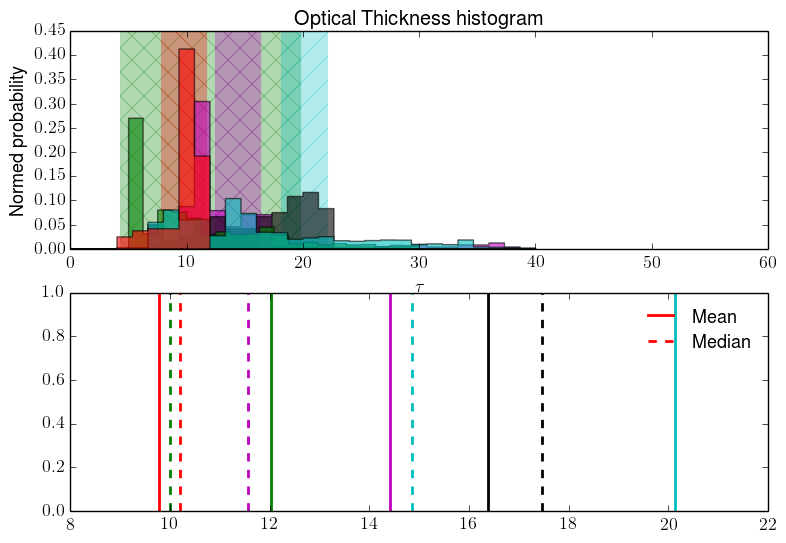

In [132]:
fig,(ax1,ax2) = plt.subplots(2,figsize=(9,6))

import matplotlib.transforms as mtransforms
trans1 = mtransforms.blended_transform_factory(ax1.transAxes, ax1.transAxes)
trans = mtransforms.blended_transform_factory(ax1.transData, ax1.transAxes)

ax1.fill_between([0,1],0,1,transform=trans1,color='#FFFFFF')
ax1.fill_between([np.nanmean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2))-7.8,np.nanmean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2))+7.8],
                 0,1,transform=trans,color='g',edgecolor='g',hatch='x',linewidth=0.1,alpha=0.3)
ax1.fill_between([np.nanmean(smooth(modis_tau,6))-2.0,np.nanmean(smooth(modis_tau,6))+2.0],0,1,transform=trans,
                 color='m',edgecolor='m',alpha=0.3,hatch='x',linewidth=0.1)
ax1.fill_between([np.nanmean(smooth(rsp_tau,70))-2.0,np.nanmean(smooth(rsp_tau,70))+2.0],0,1,transform=trans,
                 color='c',edgecolor='c',alpha=0.3,hatch='/',linewidth=0.1)
ax1.fill_between([np.nanmean(smooth(star_tau,40))-2.0,np.nanmean(smooth(star_tau,40))+2.0],0,1,transform=trans,
                 color='r',edgecolor='r',alpha=0.3,hatch='\\',linewidth=0.1)

ax1.hist(smooth(modis_tau,6),bins=30, histtype='stepfilled', normed=True, color='m',alpha=0.6, label='Modis (Reflected)',range=(0,40))
#plt.hist(smooth(emas_tau,60),bins=30, histtype='stepfilled', normed=True, color='b',alpha=0.6, label='eMAS (Reflected)',range=(0,40))
ax1.hist(smooth(emas_tau_v1,60),bins=30, histtype='stepfilled', normed=True, color='k',alpha=0.6, label='eMAS (Reflected)',range=(0,40))
ax1.hist(smooth(ssfr_tau,2),bins=20, histtype='stepfilled', normed=True, color='g',alpha=0.6, label='SSFR (Reflected)',range=(5,30))
ax1.hist(smooth(rsp_tau,70),bins=30, histtype='stepfilled', normed=True, color='c',alpha=0.6, label='RSP (Reflected)',range=(0,40))
ax1.hist(smooth(star_tau,40),bins=30, histtype='stepfilled', normed=True, color='r',alpha=0.6, label='4STAR (Transmitted)',range=(0,40))
ax1.set_title('Optical Thickness histogram')
ax1.set_ylabel('Normed probability')
ax1.set_xlabel('$\\tau$')
plot_median_mean(smooth(modis_tau,6),color='m')
#plot_median_mean(smooth(emas_tau ,60),color='b')
plot_median_mean(smooth(emas_tau_v1,60),color='k')
plot_median_mean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2),color='g')
plot_median_mean(smooth(star_tau,40),color='r',lbl=True)
plot_median_mean(smooth(rsp_tau,70),color='c')

xr = ax1.get_xlim()
yr = ax1.get_ylim()
ax1.add_patch(plt.Rectangle((0,0),0,0,color='none',edgecolor='g',hatch='x',linewidth=0.1,alpha=0.5,label='Horizontal variability'))
ax1.set_xlim(xr)
ax1.set_ylim(yr)

plt.legend(frameon=False)
ax1.set_xlim([0,60])


plt.savefig(fp+'plots/hist_modis_4star_tau_ref.png',dpi=600,transparent=True)

## Plot histogram of retrieved properties (tau and ref) in new 'bean' plots

In [95]:
from plotting_utils import plot_vert_hist

In [96]:
import plotting_utils
reload(plotting_utils)

<module 'plotting_utils' from 'plotting_utils.pyc'>

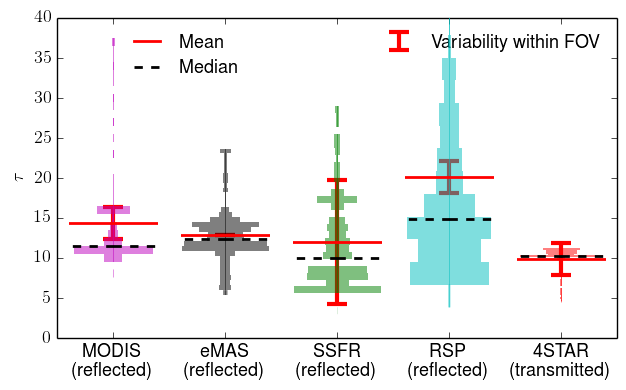

In [917]:
fig = plt.figure(figsize=(7,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[0,40],xlim=[-0.5,4.5])
ax1.set_ylabel('$\\tau$')
ax1.set_xticks([0,1,2,3,4])
ax1.set_xticklabels(['MODIS\n(reflected)','eMAS\n(reflected)','SSFR\n(reflected)','RSP\n(reflected)','4STAR\n(transmitted)'])
plot_vert_hist(fig,ax1,smooth(modis_tau,6),0,[0,40],legend=True,onlyhist=False,loc=2,color='m')
plot_vert_hist(fig,ax1,smooth(emas_tau_full,60),1,[0,40],legend=True,color='k')
plot_vert_hist(fig,ax1,smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2),2,[0,40],legend=True,color='g')
plot_vert_hist(fig,ax1,smooth(rsp_tau,70),3,[0,40],legend=True,color='c')
plot_vert_hist(fig,ax1,smooth(star_tau,40),4,[0,40],legend=True,color='r')
(_,caps,_) = ax1.errorbar([0,1,2,3,4],
             [np.nanmean(smooth(modis_tau,6)),
              np.nanmean(smooth(emas_tau_full,60)),
              np.nanmean(smooth(ssfr_tau[(ssfr_tau>5)&(ssfr_tau<30)],2)),
              np.nanmean(smooth(rsp_tau,70)),
              np.nanmean(smooth(star_tau,40))],yerr=[2,0,7.8,2,2],
             color='r',linestyle='.',linewidth=3,label='Variability within FOV',capsize=7)
for cap in caps:
    cap.set_markeredgewidth(3)
ax1.legend(frameon=False,numpoints=1)
plt.savefig(fp+'plots/vert_hist_tau_v4.png',dpi=600,transparent=True)

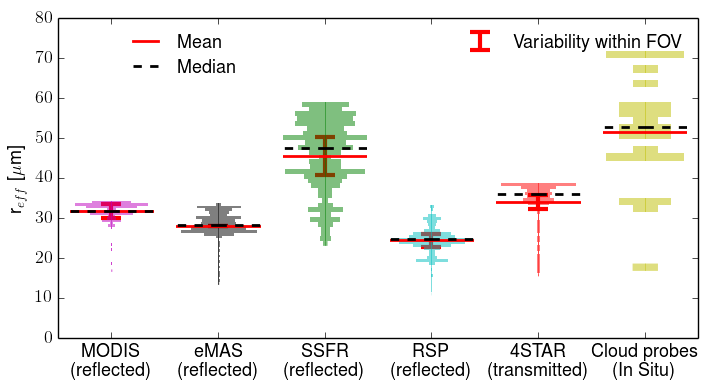

In [922]:
fig = plt.figure(figsize=(8,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[0,80],xlim=[-0.5,5.5])
ax1.set_ylabel('r$_{eff}$ [$\\mu$m]')
ax1.set_xticks([0,1,2,3,4,5])
ax1.set_xticklabels(['MODIS\n(reflected)','eMAS\n(reflected)','SSFR\n(reflected)','RSP\n(reflected)','4STAR\n(transmitted)','Cloud probes\n(In Situ)'])
plot_vert_hist(fig,ax1,smooth(modis_ref,6),0,[0,80],legend=True,onlyhist=False,loc=2,color='m')
plot_vert_hist(fig,ax1,smooth(emas_ref_full,60),1,[0,80],legend=True,color='k')
plot_vert_hist(fig,ax1,smooth(ssfr_ref,2),2,[0,80],legend=True,color='g')
plot_vert_hist(fig,ax1,smooth(rsp_ref,70),3,[0,80],legend=True,color='c')
plot_vert_hist(fig,ax1,smooth(star_ref,40),4,[0,80],legend=True,color='r')
plot_vert_hist(fig,ax1,probes[:,7],5,[0,80],legend=True,color='y')
(_,caps,_) = ax1.errorbar([0,1,2,3,4],
             [np.nanmean(smooth(modis_ref,6)),
              np.nanmean(smooth(emas_ref_full,60)),
              np.nanmean(smooth(ssfr_ref,2)),
              np.nanmean(smooth(rsp_ref,70)),
              np.nanmean(smooth(star_ref,40))],yerr=[1.7,0,4.7,1.7,1.8],
             color='r',linestyle='.',linewidth=3,label='Variability within FOV',capsize=7)
for cap in caps:
    cap.set_markeredgewidth(3)
ax1.legend(frameon=False,numpoints=1)
plt.savefig(fp+'plots/vert_hist_ref_v4.png',dpi=600,transparent=True)

## Scatter plots of the different effective radius

In [97]:
ids = find_closest(er2['Start_UTC'],ssfr.utc)

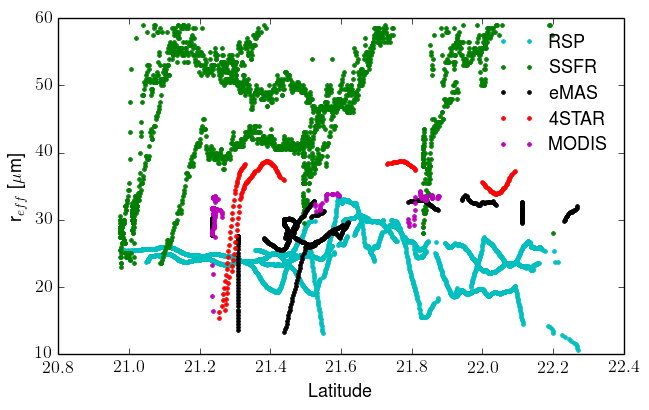

In [280]:
plt.plot(rsp['Lat'][rsp_good],smooth(rsp_ref,70),'c.',label='RSP')
plt.plot(er2['Latitude'][ids[ssfr.good[0][iss]]],smooth(ssfr_ref,2),'g.',label='SSFR')
plt.plot(emas_full['lat'][ief],smooth(emas_ref_full,60),'k.',label='eMAS')
plt.plot(meas.lat[meas.good[ist]],smooth(star_ref,40),'r.',label='4STAR')
plt.plot(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]],smooth(modis_ref,6),'m.',label='MODIS')
plt.legend(frameon=False)
plt.xlabel('Latitude')
plt.ylabel('r$_{eff}$ [$\\mu$m]')

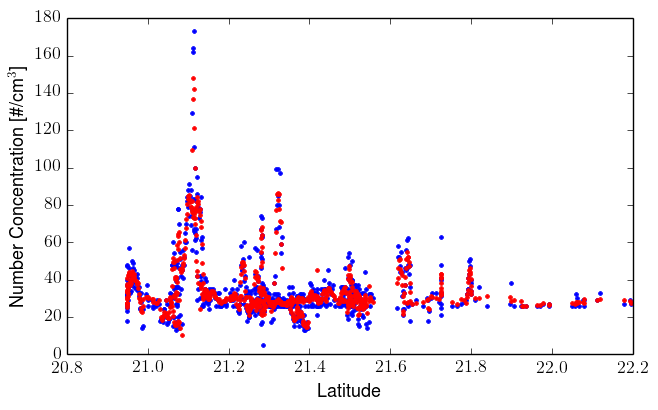

In [693]:
plt.plot(dc8['G_LAT'][id[ccn_good]],ccn['Number_Concentration'][ccn_good],'b.')
plt.plot(dc8['G_LAT'][id[ccn_good]],smooth(ccn['Number_Concentration'][ccn_good],5,nan=False),'r.')
plt.xlabel('Latitude')
plt.ylabel('Number Concentration [\#/cm$^{3}$]')

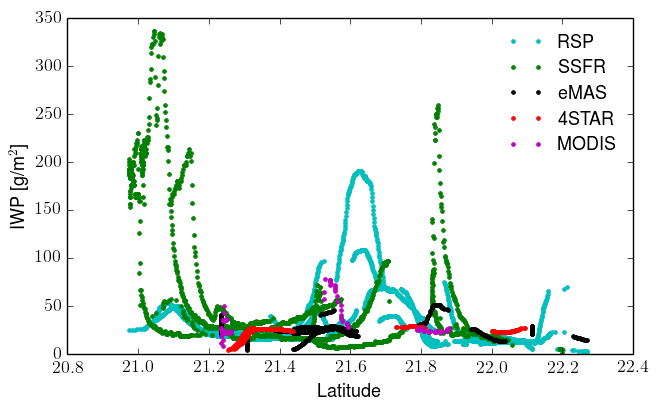

In [582]:
plt.plot(rsp['Lat'][rsp_good],smooth(rsp_ref,70)*smooth(rsp_tau,70)*2/3/10,'c.',label='RSP')
plt.plot(er2['Latitude'][ids[ssfr.good[0][iss]]],smooth(ssfr_ref,2)*smooth(ssfr_tau,2)*2/3/10,'g.',label='SSFR')
plt.plot(emas_full['lat'][ief],smooth(emas_ref_full,60)*smooth(emas_tau_full,60)*2/3/10,'k.',label='eMAS')
plt.plot(meas.lat[meas.good[ist]],smooth(star_ref,40)*smooth(star_tau,40)*2/3/10,'r.',label='4STAR')
plt.plot(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]],smooth(modis_ref,6)*smooth(modis_tau,6)*2/3/10,'m.',label='MODIS')
plt.legend(frameon=False)
plt.xlabel('Latitude')
plt.ylabel('IWP [g/m$^{2}$]')

In [694]:
id_w_up = np.where(dc8['W'][id[ccn_good]]>0.0)[0]

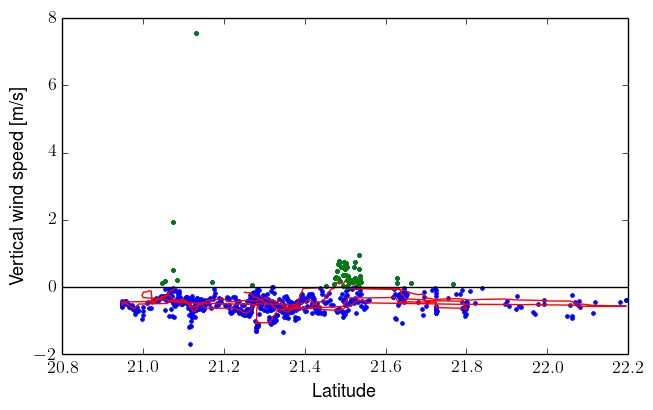

In [695]:
plt.plot(dc8['G_LAT'][id[ccn_good]],dc8['W'][id[ccn_good]],'b.')
plt.plot(dc8['G_LAT'][id[ccn_good]],smooth(dc8['W'][id[ccn_good]],20),'r')
plt.plot(dc8['G_LAT'][id[ccn_good[id_w_up]]],dc8['W'][id[ccn_good[id_w_up]]],'g.')
plt.axhline(0,color='k')
plt.ylabel('Vertical wind speed [m/s]')
plt.xlabel('Latitude')

### Plot CCN vs. ref

In [696]:
id_ccn_rsp = find_closest(dc8['G_LAT'][id[ccn_good]],rsp['Lat'][rsp_good])
id_ccn_ssfr = find_closest(dc8['G_LAT'][id[ccn_good]],er2['Latitude'][ids[ssfr.good[0][iss]]])
id_ccn_emas = find_closest(dc8['G_LAT'][id[ccn_good]],emas_full['lat'][ief])
id_ccn_star = find_closest(dc8['G_LAT'][id[ccn_good]],meas.lat[meas.good[ist]])
id_ccn_modis = find_closest(dc8['G_LAT'][id[ccn_good]],modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]])

In [697]:
id_ccn_up_rsp = find_closest(dc8['G_LAT'][id[ccn_good[id_w_up]]],rsp['Lat'][rsp_good])
id_ccn_up_ssfr = find_closest(dc8['G_LAT'][id[ccn_good[id_w_up]]],er2['Latitude'][ids[ssfr.good[0][iss]]])
id_ccn_up_emas = find_closest(dc8['G_LAT'][id[ccn_good[id_w_up]]],emas_full['lat'][ief])
id_ccn_up_star = find_closest(dc8['G_LAT'][id[ccn_good[id_w_up]]],meas.lat[meas.good[ist]])
id_ccn_up_modis = find_closest(dc8['G_LAT'][id[ccn_good[id_w_up]]],modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]])

In [698]:
iu_rsp = ccn_good[id_w_up[id_ccn_up_rsp]]
iu_ssfr = ccn_good[id_w_up[id_ccn_up_ssfr]]
iu_emas = ccn_good[id_w_up[id_ccn_up_emas]]
iu_star = ccn_good[id_w_up[id_ccn_up_star[:,0]]]
iu_modis = ccn_good[id_w_up[id_ccn_up_modis]]

In [699]:
import plotting_utils as pu

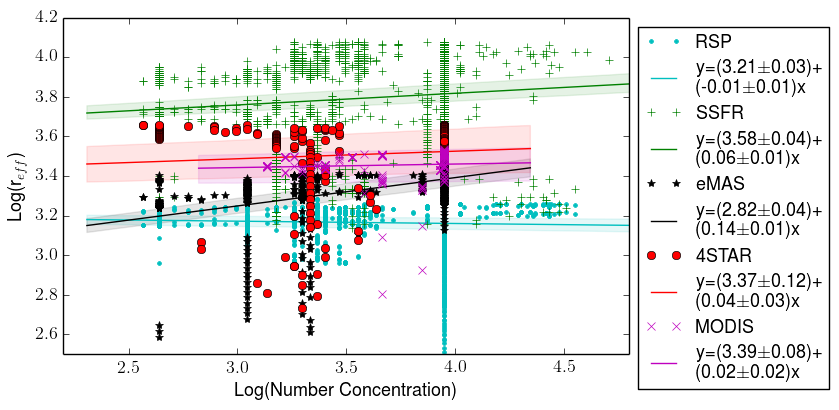

In [700]:
plt.plot(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_rsp]),np.log(smooth(rsp_ref,70)),'c.',label='RSP')
pu.plot_lin(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_rsp]),np.log(smooth(rsp_ref,70)),
            x_err=np.log(ccn['Number_Concentration'][ccn_good][id_ccn_rsp]*0.055),y_err=np.log(smooth(rsp_ref,70)*0.15),
            color='c',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_ssfr]),np.log(smooth(ssfr_ref,2)),'g+',label='SSFR')
pu.plot_lin(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_ssfr]),np.log(smooth(ssfr_ref,2)),
            x_err=np.log(ccn['Number_Concentration'][ccn_good][id_ccn_ssfr]*0.055),color='g',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_emas]),np.log(smooth(emas_ref_full,60)),'k*',label='eMAS')
pu.plot_lin(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_emas]),np.log(smooth(emas_ref_full,60)),
            x_err=np.log(ccn['Number_Concentration'][ccn_good][id_ccn_emas]*0.055),color='k',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_star]),np.log(smooth(star_ref,40)),'ro',label='4STAR')
pu.plot_lin(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_star])[:,0],np.log(smooth(star_ref,40)),
            x_err=np.log(ccn['Number_Concentration'][ccn_good][id_ccn_star]*0.055)[:,0],color='r',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_modis]),np.log(smooth(modis_ref,6)),'mx',label='MODIS')
pu.plot_lin(np.log(ccn['Number_Concentration'][ccn_good][id_ccn_modis]),np.log(smooth(modis_ref,6)),
            x_err=np.log(ccn['Number_Concentration'][ccn_good][id_ccn_modis]*0.055),color='m',use_method='statsmodels',ci=75)
plt.xlabel('Log(Number Concentration)')
plt.ylabel('Log(r$_{eff}$)')
plt.xlim([2.2,4.8])
plt.ylim([2.5,4.2])

plt.legend(bbox_to_anchor=[1,1],loc=2)
plt.savefig(fp+'plots/20130913_log_reff_vs_log_ccn.png',dpi=600,transparent=True)

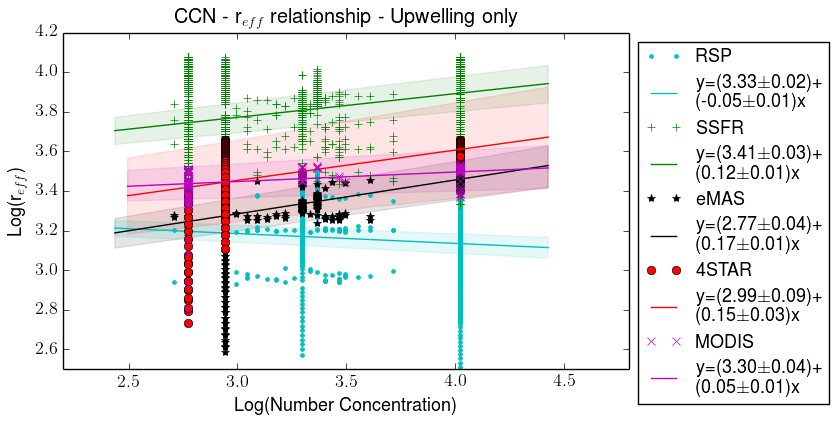

In [701]:
plt.plot(np.log(ccn['Number_Concentration'][iu_rsp]),np.log(smooth(rsp_ref,70)),'c.',label='RSP')
pu.plot_lin(np.log(ccn['Number_Concentration'][iu_rsp]),np.log(smooth(rsp_ref,70)),
            x_err=np.log(ccn['Number_Concentration'][iu_rsp]*0.055),y_err=np.log(smooth(rsp_ref,70)*0.15),
            color='c',use_method='statsmodels',ci=95)
plt.plot(np.log(ccn['Number_Concentration'][iu_ssfr]),np.log(smooth(ssfr_ref,2)),'g+',label='SSFR')
pu.plot_lin(np.log(ccn['Number_Concentration'][iu_ssfr]),np.log(smooth(ssfr_ref,2)),
            x_err=np.log(ccn['Number_Concentration'][iu_ssfr]*0.055),color='g',use_method='statsmodels',ci=95)
plt.plot(np.log(ccn['Number_Concentration'][iu_emas]),np.log(smooth(emas_ref_full,60)),'k*',label='eMAS')
pu.plot_lin(np.log(ccn['Number_Concentration'][iu_emas]),np.log(smooth(emas_ref_full,60)),
            x_err=np.log(ccn['Number_Concentration'][iu_emas]*0.055),color='k',use_method='statsmodels',ci=95)
plt.plot(np.log(ccn['Number_Concentration'][iu_star]),np.log(smooth(star_ref,40)),'ro',label='4STAR')
pu.plot_lin(np.log(ccn['Number_Concentration'][iu_star]),np.log(smooth(star_ref,40)),
            x_err=np.log(ccn['Number_Concentration'][iu_star]*0.055),color='r',use_method='statsmodels',ci=95)
plt.plot(np.log(ccn['Number_Concentration'][iu_modis]),np.log(smooth(modis_ref,6)),'mx',label='MODIS')
pu.plot_lin(np.log(ccn['Number_Concentration'][iu_modis]),np.log(smooth(modis_ref,6)),
            x_err=np.log(ccn['Number_Concentration'][iu_modis]*0.055),color='m',use_method='statsmodels',ci=95)
plt.xlabel('Log(Number Concentration)')
plt.ylabel('Log(r$_{eff}$)')
plt.title('CCN - r$_{eff}$ relationship - Upwelling only')
plt.xlim([2.2,4.8])
plt.ylim([2.5,4.2])

plt.legend(bbox_to_anchor=[1,1],loc=2)
plt.savefig(fp+'plots/20130913_log_reff_vs_log_ccn_up.png',dpi=600,transparent=True)

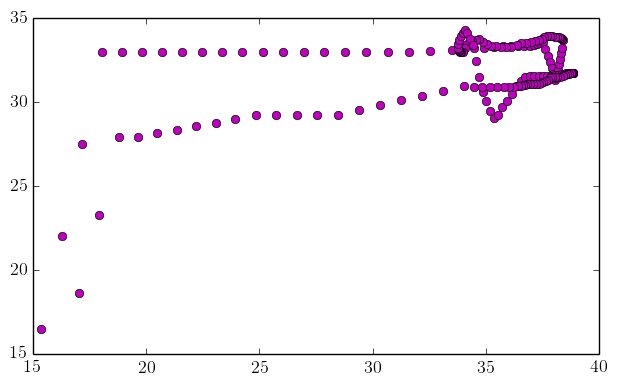

In [291]:
plt.plot(smooth(star_ref,40),smooth(modis_ref,6),'mo')
#plt.plot(smooth(star_ref,40),smooth(emas_ref_v1,60),'ko')
#plt.plot(smooth(star_ref,40),smooth(ssfr_ref,2),'go')
#plt.plot(smooth(star_ref,40),smooth(rsp_ref,70),'co')

Plotting the ccn vs. ref results in low numbers and repeats of values. This is because we are using a nearest-neighbor approximation. Now we repeat the process but with interpolation instead.

In [702]:
from scipy import interpolate

In [753]:
idc8_lat = np.argsort(dc8['G_LAT'][id[ccn_good]])
dc8_sort = np.sort(dc8['G_LAT'][id[ccn_good]])
ccn_sort = ccn['Number_Concentration'][ccn_good][idc8_lat]

In [763]:
dc8_sort_nonunique,inonunique = np.unique(dc8_sort,return_index=True)
ccn_sort_nonunique = ccn_sort[inonunique]

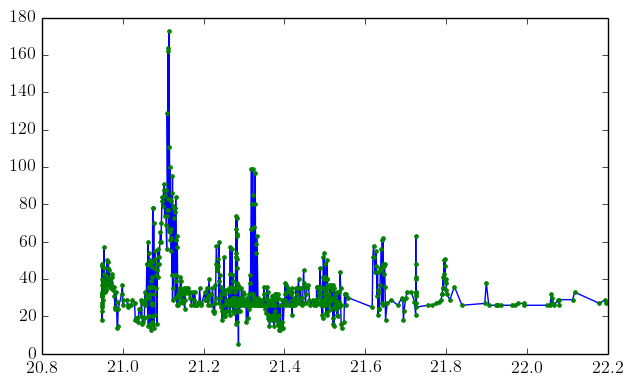

In [754]:
plt.plot(dc8_sort,ccn_sort)
plt.plot(dc8['G_LAT'][id[ccn_good]],ccn['Number_Concentration'][ccn_good],'.')

In [788]:
f_ccn = interpolate.InterpolatedUnivariateSpline(dc8_sort_nonunique,ccn_sort_nonunique,k=1)
ccn_ref_rsp = f_ccn(rsp['Lat'][rsp_good])
ccn_ref_ssfr = f_ccn(er2['Latitude'][ids[ssfr.good[0][iss]]])
ccn_ref_emas = f_ccn(emas_full['lat'][ief])
ccn_ref_star = f_ccn(meas.lat[meas.good[ist],0])
ccn_ref_modis = f_ccn(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]])

In [803]:
i_extrap_rsp = np.where((rsp['Lat'][rsp_good] > np.max(dc8_sort_nonunique)) | (rsp['Lat'][rsp_good] < np.min(dc8_sort_nonunique)))
i_extrap_ssfr = np.where((er2['Latitude'][ids[ssfr.good[0][iss]]] > np.max(dc8_sort_nonunique)) | (er2['Latitude'][ids[ssfr.good[0][iss]]] < np.min(dc8_sort_nonunique)))
i_extrap_emas = np.where((emas_full['lat'][ief] > np.max(dc8_sort_nonunique)) | (emas_full['lat'][ief] < np.min(dc8_sort_nonunique)))
i_extrap_star = np.where((meas.lat[meas.good[ist],0] > np.max(dc8_sort_nonunique)) | (meas.lat[meas.good[ist],0] < np.min(dc8_sort_nonunique)))
i_extrap_modis = np.where((modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]] > np.max(dc8_sort_nonunique)) | (modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]] < np.min(dc8_sort_nonunique)))

In [804]:
ccn_ref_rsp[i_extrap_rsp] = np.nan
ccn_ref_ssfr[i_extrap_ssfr] = np.nan
ccn_ref_emas[i_extrap_emas] = np.nan
ccn_ref_star[i_extrap_star] = np.nan
ccn_ref_modis[i_extrap_modis] = np.nan

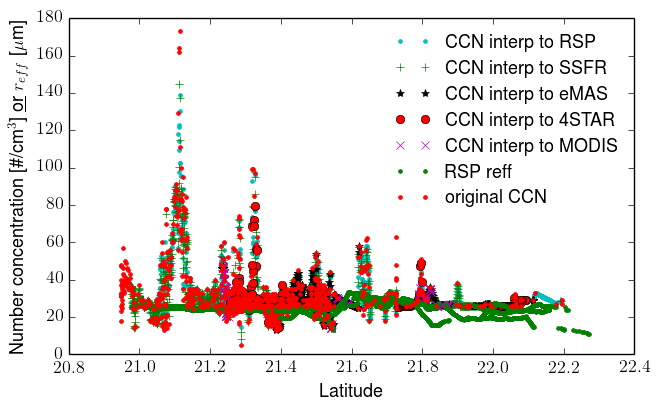

In [805]:
plt.plot(rsp['Lat'][rsp_good],ccn_ref_rsp,'c.',label='CCN interp to RSP')
plt.plot(er2['Latitude'][ids[ssfr.good[0][iss]]],ccn_ref_ssfr,'g+',label='CCN interp to SSFR')
plt.plot(emas_full['lat'][ief],ccn_ref_emas,'k*',label='CCN interp to eMAS')
plt.plot(meas.lat[meas.good[ist],0],ccn_ref_star,'ro',label='CCN interp to 4STAR')
plt.plot(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]],ccn_ref_modis,'mx',label='CCN interp to MODIS')
plt.plot(rsp['Lat'][rsp_good],smooth(rsp_ref,70),'g.',label='RSP reff')
plt.plot(dc8['G_LAT'][id[ccn_good]],ccn['Number_Concentration'][ccn_good],'r.',label='original CCN')
plt.legend(frameon=False)
plt.xlabel('Latitude')
plt.ylabel('Number concentration [\#/cm$^{3}$] \underline{or} $r_{eff}$ [$\mu$m]')

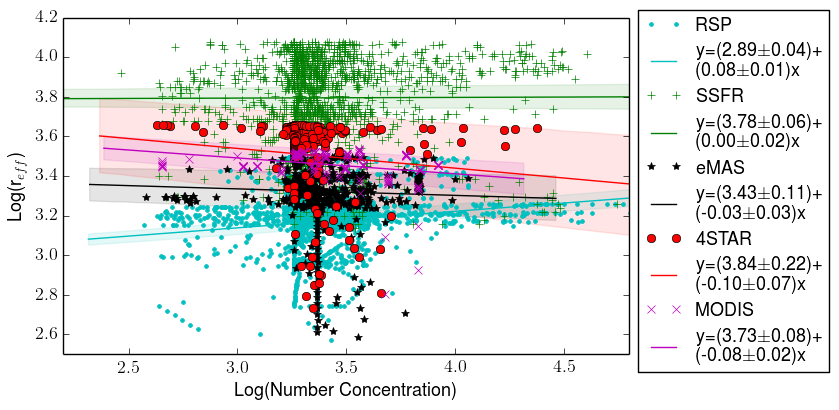

In [806]:
plt.plot(np.log(ccn_ref_rsp),np.log(smooth(rsp_ref,70)),'c.',label='RSP')
pu.plot_lin(np.log(ccn_ref_rsp),np.log(smooth(rsp_ref,70)),
            x_err=np.log(ccn_ref_rsp*0.055),y_err=np.log(smooth(rsp_ref,70)*0.15),
            color='c',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_ssfr),np.log(smooth(ssfr_ref,2)),'g+',label='SSFR')
pu.plot_lin(np.log(ccn_ref_ssfr),np.log(smooth(ssfr_ref,2)),
            x_err=np.log(ccn_ref_ssfr*0.055),color='g',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_emas),np.log(smooth(emas_ref_full,60)),'k*',label='eMAS')
pu.plot_lin(np.log(ccn_ref_emas),np.log(smooth(emas_ref_full,60)),
            x_err=np.log(ccn_ref_emas*0.055),color='k',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_star),np.log(smooth(star_ref,40)),'ro',label='4STAR')
pu.plot_lin(np.log(ccn_ref_star),np.log(smooth(star_ref,40)),
            x_err=np.log(ccn_ref_star*0.055),color='r',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_modis),np.log(smooth(modis_ref,6)),'mx',label='MODIS')
pu.plot_lin(np.log(ccn_ref_modis),np.log(smooth(modis_ref,6)),
            x_err=np.log(ccn_ref_modis*0.055),color='m',use_method='statsmodels',ci=75)
plt.xlabel('Log(Number Concentration)')
plt.ylabel('Log(r$_{eff}$)')
plt.xlim([2.2,4.8])
plt.ylim([2.5,4.2])

plt.legend(bbox_to_anchor=[1,1.05],loc=2)
plt.savefig(fp+'plots/20130913_log_reff_vs_log_ccn_interp.png',dpi=600,transparent=True)

Now set up for only using the values that have positive vertical velocities as measured by dc8

First need to interpolate the vertical wind speed, then find the points

In [833]:
idc8_good = np.where((dc8['TIME_UTC']>18.0)&(dc8['TIME_UTC']<19.5))[0]
idc8_sort_lat = np.argsort(dc8['G_LAT'][idc8_good])
dc8_lat_sort = dc8['G_LAT'][idc8_good[idc8_sort_lat]]
dc8_w_sort = dc8['W'][idc8_good[idc8_sort_lat]]
dc8_lat_nonunique,idc8_lat_nonunique = np.unique(dc8_lat_sort,return_index=True)
dc8_w_sort_nounique = dc8_w_sort[idc8_lat_nonunique]

In [843]:
f_w_dc8 = interpolate.InterpolatedUnivariateSpline(dc8_lat_nonunique,smooth(dc8_w_sort_nounique,2))
dc8_w_rsp = f_w_dc8(rsp['Lat'][rsp_good])
dc8_w_ssfr = f_w_dc8(er2['Latitude'][ids[ssfr.good[0][iss]]])
dc8_w_emas = f_w_dc8(emas_full['lat'][ief])
dc8_w_star = f_w_dc8(meas.lat[meas.good[ist],0])
dc8_w_modis = f_w_dc8(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]])

In [853]:
dc8_w_rsp[dc8_w_rsp>20] = np.nan
dc8_w_ssfr[dc8_w_ssfr>20] = np.nan
dc8_w_emas[dc8_w_emas>20] = np.nan
dc8_w_star[dc8_w_star>20] = np.nan
dc8_w_modis[dc8_w_modis>20] = np.nan

(20.9, 22.3)

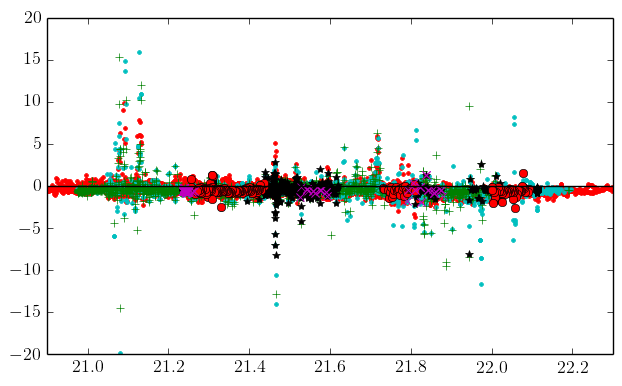

In [858]:
plt.plot(dc8['G_LAT'][id],dc8['W'][id],'r.')
plt.plot(rsp['Lat'][rsp_good],dc8_w_rsp,'c.')
plt.plot(er2['Latitude'][ids[ssfr.good[0][iss]]],dc8_w_ssfr,'g+')
plt.plot(emas_full['lat'][ief],dc8_w_emas,'k*')
plt.plot(meas.lat[meas.good[ist],0],dc8_w_star,'ro')
plt.plot(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]],dc8_w_modis,'mx')
plt.plot([20.9,22.3],[0,0],'k')
plt.xlim([20.9,22.3])

In [863]:
iup_rsp = dc8_w_rsp>0
iup_ssfr = dc8_w_ssfr>0
iup_emas = dc8_w_emas>0
iup_star = dc8_w_star>0
iup_modis = dc8_w_modis>0

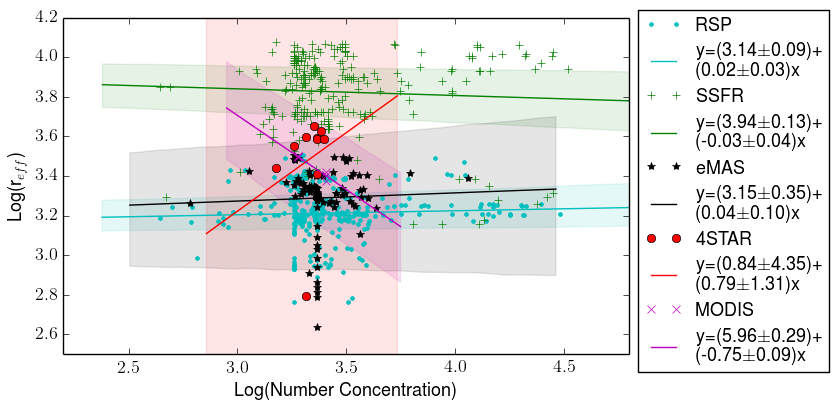

In [865]:
plt.plot(np.log(ccn_ref_rsp[iup_rsp]),np.log(smooth(rsp_ref,70)[iup_rsp]),'c.',label='RSP')
pu.plot_lin(np.log(ccn_ref_rsp[iup_rsp]),np.log(smooth(rsp_ref,70)[iup_rsp]),
            x_err=np.log(ccn_ref_rsp[iup_rsp]*0.055),y_err=np.log(smooth(rsp_ref,70)[iup_rsp]*0.15),
            color='c',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_ssfr[iup_ssfr]),np.log(smooth(ssfr_ref,2)[iup_ssfr]),'g+',label='SSFR')
pu.plot_lin(np.log(ccn_ref_ssfr[iup_ssfr]),np.log(smooth(ssfr_ref,2)[iup_ssfr]),
            x_err=np.log(ccn_ref_ssfr[iup_ssfr]*0.055),color='g',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_emas[iup_emas]),np.log(smooth(emas_ref_full,60)[iup_emas]),'k*',label='eMAS')
pu.plot_lin(np.log(ccn_ref_emas[iup_emas]),np.log(smooth(emas_ref_full,60)[iup_emas]),
            x_err=np.log(ccn_ref_emas[iup_emas]*0.055),color='k',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_star[iup_star]),np.log(smooth(star_ref,40)[iup_star]),'ro',label='4STAR')
pu.plot_lin(np.log(ccn_ref_star[iup_star]),np.log(smooth(star_ref,40)[iup_star]),
            x_err=np.log(ccn_ref_star[iup_star]*0.055),color='r',use_method='statsmodels',ci=75)
plt.plot(np.log(ccn_ref_modis[iup_modis]),np.log(smooth(modis_ref,6)[iup_modis]),'mx',label='MODIS')
pu.plot_lin(np.log(ccn_ref_modis[iup_modis]),np.log(smooth(modis_ref,6)[iup_modis]),
            x_err=np.log(ccn_ref_modis[iup_modis]*0.055),color='m',use_method='statsmodels',ci=75)
plt.xlabel('Log(Number Concentration)')
plt.ylabel('Log(r$_{eff}$)')
plt.xlim([2.2,4.8])
plt.ylim([2.5,4.2])

plt.legend(bbox_to_anchor=[1,1.05],loc=2)
plt.savefig(fp+'plots/20130913_log_reff_vs_log_ccn_interp_up.png',dpi=600,transparent=True)

Recalculate the reff vs. ccn with derivative

In [866]:
from Sp_parameters import deriv

In [882]:
ccn_rsp_dif = smooth(deriv(np.log(smooth(rsp_ref,70)),np.log(ccn_ref_rsp)),5)
ccn_ssfr_dif = smooth(deriv(np.log(smooth(ssfr_ref,2)),np.log(ccn_ref_ssfr)),5)
ccn_emas_dif = smooth(deriv(np.log(smooth(emas_ref_full,60)),np.log(ccn_ref_emas)),5)
ccn_star_dif = smooth(deriv(np.log(smooth(star_ref,40)),np.log(ccn_ref_star)),5)
ccn_modis_dif = smooth(deriv(np.log(smooth(modis_ref,6)),np.log(ccn_ref_modis)),5)

In [876]:
np.nanmean(ccn_rsp_dif)

-26702720553.53511

(-5, 5)

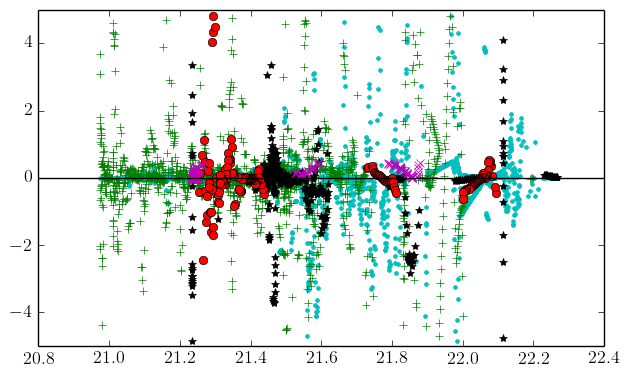

In [887]:
plt.plot(rsp['Lat'][rsp_good],ccn_rsp_dif,'c.')
plt.plot(er2['Latitude'][ids[ssfr.good[0][iss]]],ccn_ssfr_dif,'g+')
plt.plot(emas_full['lat'][ief],ccn_emas_dif,'k*')
plt.plot(meas.lat[meas.good[ist],0],ccn_star_dif,'ro')
plt.plot(modis['lat'][dc8_ind_modis[0,im],dc8_ind_modis[1,im]],ccn_modis_dif,'mx')
plt.plot([20.8,22.4],[0,0],'k')
plt.ylim([-5,5])

(array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.02777778,
         1.22222222,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
         0.        ,  0.        ,  0.        ,  0.        ,  0.        ]),
 array([-20. , -19.2, -18.4, -17.6, -16.8, -16. , -15.2, -14.4, -13.6,
        -12.8, -12. , -11.2, -10.4,  -9.6,  -8.8,  -8. ,  -7.2,  -6.4,
         -5.6,  -4.8,  -4. ,  -3.2,  -2.4,  -1.6,  -0.8,   0. ,   0.8,
          1.6,   2.4,   3.2,   4. ,   4.8,   5.6,   6.4

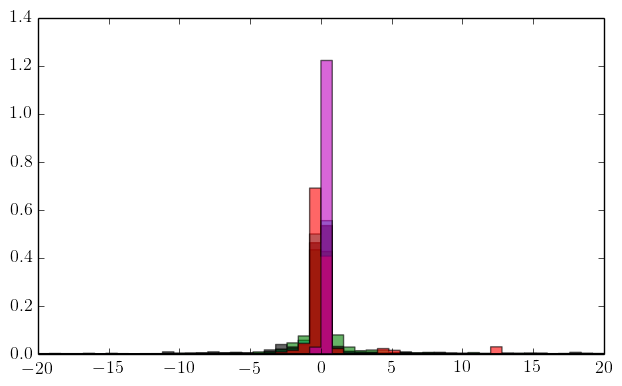

In [895]:
plt.hist(ccn_rsp_dif,bins=50, histtype='stepfilled', normed=True, color='c',alpha=0.6,range=[-20,20])
plt.hist(ccn_ssfr_dif,bins=50, histtype='stepfilled', normed=True, color='g',alpha=0.6,range=(-20,20))
plt.hist(ccn_emas_dif,bins=50, histtype='stepfilled', normed=True, color='k',alpha=0.6,range=(-20,20))
plt.hist(ccn_star_dif,bins=50, histtype='stepfilled', normed=True, color='r',alpha=0.6,range=(-20,20))
plt.hist(ccn_modis_dif,bins=50, histtype='stepfilled', normed=True, color='m',alpha=0.6,range=(-20,20))

In [898]:
reload(pu)

<module 'plotting_utils' from 'plotting_utils.pyc'>

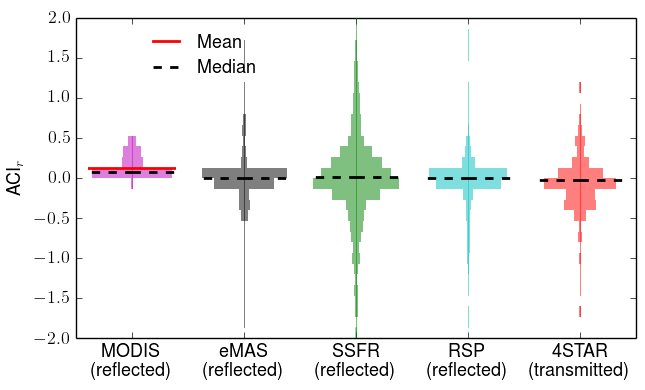

In [901]:
fig = plt.figure(figsize=(7,4))
ax1 = fig.add_axes([0.1,0.1,0.8,0.8],ylim=[-2,2],xlim=[-0.5,4.5])
ax1.set_ylabel('ACI$_{r}$')
ax1.set_xticks([0,1,2,3,4])
ax1.set_xticklabels(['MODIS\n(reflected)','eMAS\n(reflected)','SSFR\n(reflected)','RSP\n(reflected)','4STAR\n(transmitted)'])
pu.plot_vert_hist(fig,ax1,ccn_modis_dif,0,[-2,2],legend=True,onlyhist=False,loc=2,color='m')
pu.plot_vert_hist(fig,ax1,ccn_emas_dif,1,[-2,2],legend=True,color='k')
pu.plot_vert_hist(fig,ax1,ccn_ssfr_dif,2,[-2,2],legend=True,color='g')
pu.plot_vert_hist(fig,ax1,ccn_rsp_dif,3,[-2,2],legend=True,color='c')
pu.plot_vert_hist(fig,ax1,ccn_star_dif,4,[-2,2],legend=True,color='r')
plt.savefig(fp+'plots/vert_hist_ACI_r.png',dpi=600,transparent=True)

## Combine the vertical information into one figure

In [133]:
meas.good.shape

(180L,)

In [134]:
it = np.abs(apr['utc']-19.19).argmin()
inoisezone = apr['dbz'][:,it].argmax()
i=range(inoisezone-15)+range(inoisezone+15,len(apr['altflt'][:,0]))

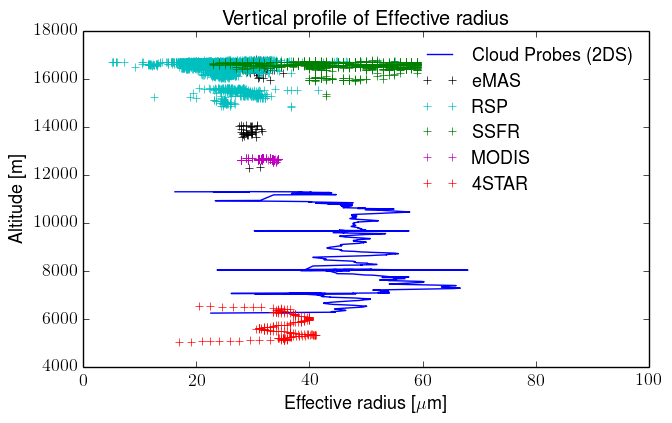

In [160]:
plt.figure
plt.plot(smooth(twoDS['effectiveD'][fl]/2.0,10),dc8['G_ALT'][fl],label='Cloud Probes (2DS)')
plt.plot(emas_ref_v1,cpl_layers['top'][dc8_ind[0,ie1],0],'k+',label='eMAS')
plt.plot(rsp_ref,cpl_layers['top'][rsp_good[0][irs],0],'c+',label='RSP')
plt.plot(ssfr_ref,cpl_layers['top'][ssfr.good[0][iss],0],'g+',label='SSFR')
plt.plot(modis_ref,cpl_layers['top'][dc8_ind_modis[0,im],0],'m+',label='MODIS')
plt.plot(star_ref,dc8['G_ALT'][meas.good[ist]],'r+',label='4STAR')
#plt.plot(smooth(apr['dbz'][i,it],10)/50.0,apr['altflt'][i,it],'k',label='APR-2 Reflectivity')
plt.legend(frameon=False)
plt.xlim([0,100])
plt.ylim([4000,18000])
plt.xlabel('Effective radius [$\\mu$m]')
plt.ylabel('Altitude [m]')
plt.title('Vertical profile of Effective radius')
plt.savefig(fp+'plots/ref_profile_seac4rs.png',dpi=600,transparent=True)

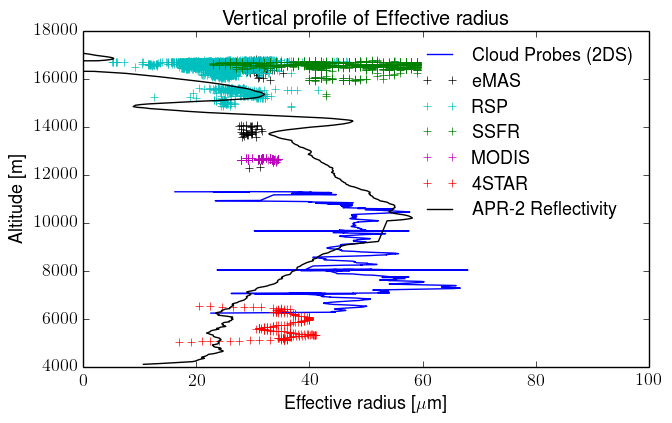

In [159]:
plt.figure
plt.plot(smooth(twoDS['effectiveD'][fl]/2.0,10),dc8['G_ALT'][fl],label='Cloud Probes (2DS)')
plt.plot(emas_ref_v1,cpl_layers['top'][dc8_ind[0,ie1],0],'k+',label='eMAS')
plt.plot(rsp_ref,cpl_layers['top'][rsp_good[0][irs],0],'c+',label='RSP')
plt.plot(ssfr_ref,cpl_layers['top'][ssfr.good[0][iss],0],'g+',label='SSFR')
plt.plot(modis_ref,cpl_layers['top'][dc8_ind_modis[0,im],0],'m+',label='MODIS')
plt.plot(star_ref,dc8['G_ALT'][meas.good[ist]],'r+',label='4STAR')
plt.plot(smooth(apr['dbz'][i,it],10)/50.0,apr['altflt'][i,it],'k',label='APR-2 Reflectivity')
plt.legend(frameon=False)
plt.xlim([0,100])
plt.ylim([4000,18000])
plt.xlabel('Effective radius [$\\mu$m]')
plt.ylabel('Altitude [m]')
plt.title('Vertical profile of Effective radius')
plt.savefig(fp+'plots/ref_profile_seac4rs_radar.png',dpi=600,transparent=True)

## eMAS V00 and V01 comparison

In [73]:
emas_v1.keys()

['tau', 'layer', 'lon', 'qa', 'phase', 'lat', 'ref']

ValueError: x and y must have same first dimension

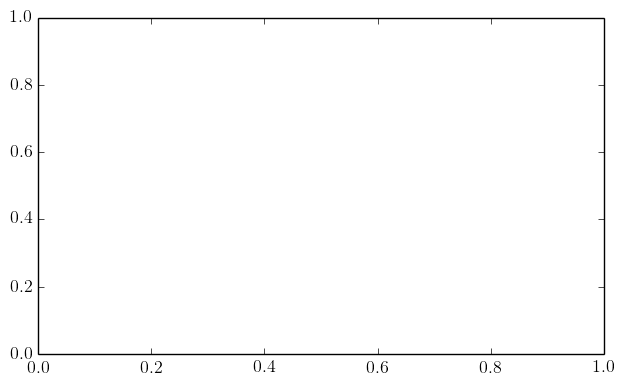

In [148]:
plt.figure();
plt.plot(emas_v1['lon'][dc8_ind[0,:],dc8_ind[1,:]],emas_tau_v1,label='V01')
plt.plot(emas['lon'][dc8_ind[0,:],dc8_ind[1,:]], emas_tau,label='V00')



# 1:1 relationship

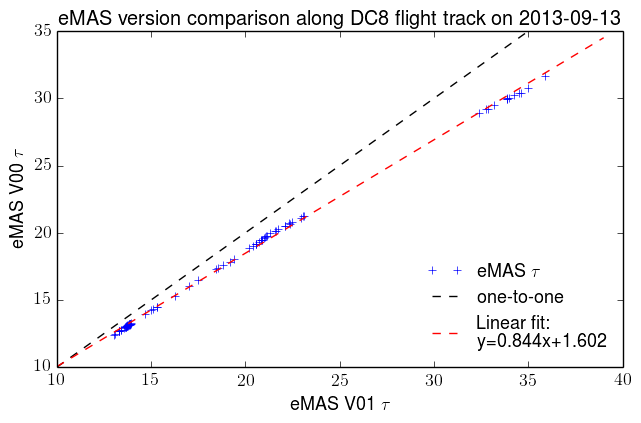

In [75]:
plt.figure()
plt.plot(emas_tau_v1,emas_tau,'+',label=r'eMAS $\tau$')
plt.plot([10,35],[10,35],'k--',label='one-to-one')
from linfit import linfit
emas_fit,z = linfit(emas_tau_v1,emas_tau)
plt.plot(np.linspace(10,39), emas_fit[1]+emas_fit[0]*np.linspace(10,39),'r--',label='Linear fit:\n y='+str('%.3f' % emas_fit[0])+'x+'+str('%.3f' % emas_fit[1]))
plt.title(r'eMAS version comparison along DC8 flight track on 2013-09-13')
plt.xlabel(r'eMAS V01 $\tau$')
plt.ylabel(r'eMAS V00 $\tau$')
plt.legend(frameon=False,loc=4)
plt.savefig(fp+'plots/emas_v00_compare_v01_tau.png',dpi=600,transparent=True)

In [76]:
print emas_tau_v1, emas_tau
print linfit(emas_tau_v1,emas_tau)

[ 13.08  13.01  13.3   13.38  13.31  13.38  13.31  13.3   13.54  13.62
  13.75  13.74  13.85  13.89  13.85  13.82  13.77  13.87  13.85  13.9
  13.87  13.9   13.81  13.88  13.92  13.76  13.69  13.78  13.69  13.73
  13.65  13.67  13.63  13.71  13.65  13.72  34.    34.61  34.51  34.26
  33.87  33.16  32.77  32.4   32.89  33.85  33.88  35.    35.88  13.88
  13.95  14.67  15.12  15.34  15.02  15.33  16.25  16.99  17.49  18.43
  18.81  18.53  19.19  19.38  20.18  20.54  20.38  20.55  20.85  21.12
  21.72  22.12  22.47  22.08  21.06  20.71  20.56  21.01  21.17  21.6
  22.33  23.07  23.11  22.94  22.35  21.57  21.33  20.87  20.83  20.87] [ 12.45  12.37  12.67  12.74  12.68  12.75  12.67  12.66  12.89  12.96
  13.11  13.09  13.2   13.24  13.2   13.17  13.12  13.21  13.19  13.24
  13.21  13.24  13.17  13.22  13.26  13.1   13.04  13.11  13.04  13.06
  12.98  13.    12.97  13.05  12.97  13.04  30.    30.42  30.42  30.23
  29.97  29.49  29.19  28.91  29.22  30.01  29.97  30.79  31.68  13.17
  13.23

4.2100000000000009

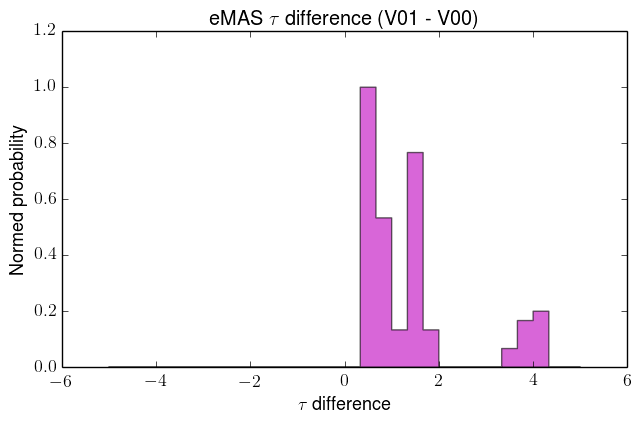

In [77]:
plt.figure()
plt.hist(emas_tau_v1-emas_tau,bins=30, histtype='stepfilled', normed=True, color='m',alpha=0.6, label='eMAS tau difference',range=(-5,5))
plt.xlabel(r'$\tau$ difference')
plt.ylabel('Normed probability')
plt.title(r'eMAS $\tau$ difference (V01 - V00)')
plt.savefig(fp+'plots/emas_diff_histogram_v01_v00_tau.png',dpi=600,transparent=True)
np.max(emas_tau_v1-emas_tau)

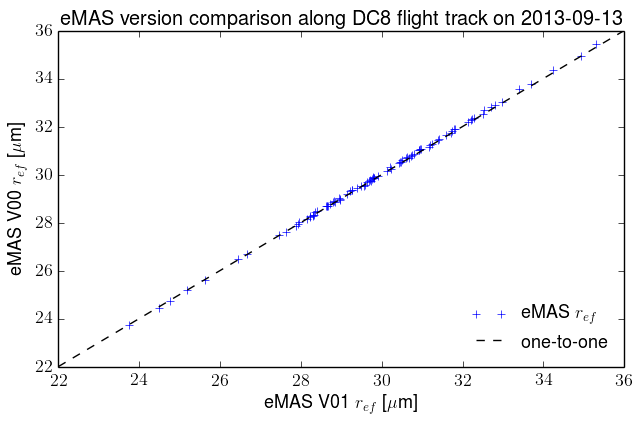

In [78]:
plt.figure()
plt.plot(emas_ref_v1,emas_ref,'+',label='eMAS $r_{ef}$')
plt.plot([22,36],[22,36],'k--', label='one-to-one')
plt.title('eMAS version comparison along DC8 flight track on 2013-09-13')
plt.xlabel('eMAS V01 $r_{ef}$ [$\mu$m]')
plt.ylabel('eMAS V00 $r_{ef}$ [$\mu$m]')
plt.legend(frameon=False,loc=4)
plt.savefig(fp+'plots/emas_v00_compare_v01_ref.png',dpi=600,transparent=True)

0.030000000000001137

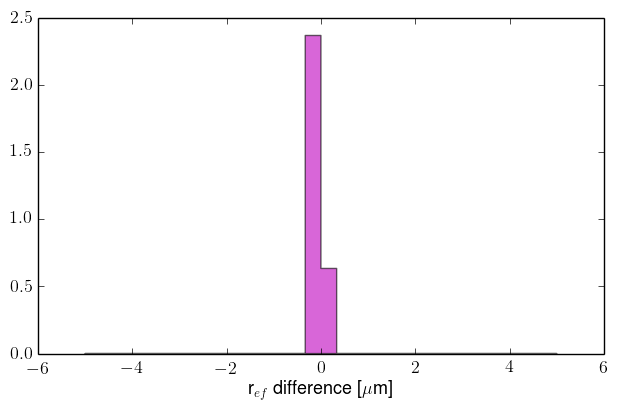

In [79]:
plt.figure()
plt.hist(emas_ref_v1-emas_ref,bins=30, histtype='stepfilled', normed=True, color='m',alpha=0.6, label='eMAS Ref difference',range=(-5,5))
plt.xlabel('r$_{ef}$ difference [$\mu$m]')
np.max(emas_ref_v1-emas_ref)

## Find the mean tau and ref for each instrument

In [75]:
print np.nanmean(modis_ref)

32.0052215068


In [76]:
print np.shape(modis_tau)

(180L,)


In [77]:
means = object()
means.tau = object()
means.ref = object()
means.tau.modis = np.nanmean(modis_tau)
means.ref.modis = np.nanmean(modis_ref)
means.tau.emas = np.nanmean(emas_tau)
means.ref.emas = np.nanmean(emas_ref)
means.tau.ssfr = np.nanmean(ssfr_tau)
means.ref.ssfr = np.nanmean(ssfr_ref)
means.tau.star = np.nanmean(star_tau)
means.ref.star = np.nanmean(star_ref)
means.ref.probes = np.nanmean(probes[:,7])
means.tau.rsp = np.nanmean(rsp_tau)
means.ref.rsp = np.nanmean(rsp_ref)

In [78]:
sttaumod = np.nanstd(modis_tau)
strefmod = np.nanstd(modis_ref)
sttauemas = np.nanstd(emas_tau)
strefemas = np.nanstd(emas_ref)
sttaussfr = np.nanstd(ssfr_tau)
strefssfr = np.nanstd(ssfr_ref)
sttaursp = np.nanstd(rsp_tau)
strefrsp = np.nanstd(rsp_ref)
sttaustar = np.nanstd(star_tau)
strefstar = np.nanstd(star_ref)

In [83]:
print lut

<Sp_parameters.Sp instance at 0x000000000AB27CC8>


In [84]:
print lut.sp_irrdn.shape
print lut.tausp.shape
print lut.refsp.shape
print lut.wvl.shape

(2L, 1556L, 2L, 35L, 22L)
(22L,)
(35L,)
(1556L,)


interpolate the modeled irradiance at z=0 (dc8 altitude) to the retrieved values of tau and ref

In [192]:
lut.sp_irrdn[1,:,0,4,0]

array([ 0.14664912,  0.15087938,  0.15516329, ...,  0.14636752,
        0.14599076,  0.14599076], dtype=float32)

In [79]:
from scipy import interpolate
#fx = interpolate.RectBivariateSpline(ref[refranges[ph]],tau,sp[ph,w,z,refranges[ph],:],kx=1,ky=1)
#sp_hires[ph,w,z,:,:] = fx(ref_hires,tau_hires)

In [81]:
def interpirr(re,ta):
    "interpolate over irradiance to get the spectrum at ta and re"
    sp = np.zeros(lut.wvl.size)
    print re,ta
    for w in xrange(lut.wvl.size):
        irrdnfx = interpolate.RectBivariateSpline(lut.refsp[lut.refsp>5],lut.tausp,lut.sp_irrdn[1,w,0,lut.refsp>5,:],kx=1,ky=1)
        sp[w] = irrdnfx(re,ta)
    return smooth(sp,20)

In [82]:
def interpirr_up(re,ta):
    "interpolate over irradiance to get the spectrum at ta and re"
    sp = np.zeros(lut.wvl.size)
    print re,ta
    for w in xrange(lut.wvl.size):
        irrupfx = interpolate.RectBivariateSpline(lut.refsp[lut.refsp>5],lut.tausp,lut.sp_irrup[1,w,0,lut.refsp>5,:],kx=1,ky=1)
        sp[w] = irrupfx(re,ta)
    return smooth(sp,20)

In [83]:
sp_modis = interpirr(means.ref.modis,means.tau.modis)
sp_emas = interpirr(means.ref.emas,means.tau.emas)
sp_ssfr = interpirr(means.ref.ssfr,means.tau.ssfr)
sp_star = interpirr(means.ref.star,means.tau.star)
sp_rsp = interpirr(means.ref.rsp,means.tau.rsp)
sp_modis_no = interpirr(means.ref.modis,means.tau.modis*0.0)
sp_emas_no = interpirr(means.ref.emas,means.tau.emas*0.0)
sp_ssfr_no = interpirr(means.ref.ssfr,means.tau.ssfr*0.0)
sp_star_no = interpirr(means.ref.star,means.tau.star*0.0)
sp_rsp_no = interpirr(means.ref.rsp,means.tau.rsp*0.0)

32.0052215068 14.5336663418
29.9477777778 17.9026666667
45.5085682698 23.8974571587
35.8777777778 10.3683333333
24.520490292 20.2777643534
32.0052215068 0.0
29.9477777778 0.0
45.5085682698 0.0
35.8777777778 0.0
24.520490292 0.0


In [84]:
sp_modisp = interpirr(means.ref.modis+sttaumod,means.tau.modis+sttaumod)
sp_emasp = interpirr(means.ref.emas+sttauemas,means.tau.emas+sttauemas)
sp_ssfrp = interpirr(means.ref.ssfr+sttaussfr,means.tau.ssfr+sttaussfr)
sp_starp = interpirr(means.ref.star+sttaustar,means.tau.star+sttaustar)
sp_rspp = interpirr(means.ref.rsp+sttaursp,means.tau.rsp+sttaursp)

38.5459447236 21.0743895586
35.7476482361 23.702537125
77.3683636347 55.7572525236
37.0320801164 11.5226356719
42.5066702728 38.2639443343


In [85]:
sp_modisp_up = interpirr_up(means.ref.modis+sttaumod,means.tau.modis+sttaumod)
sp_emasp_up = interpirr_up(means.ref.emas+sttauemas,means.tau.emas+sttauemas)
sp_ssfrp_up = interpirr_up(means.ref.ssfr+sttaussfr,means.tau.ssfr+sttaussfr)
sp_starp_up = interpirr_up(means.ref.star+sttaustar,means.tau.star+sttaustar)
sp_rspp_up = interpirr_up(means.ref.rsp+sttaursp,means.tau.rsp+sttaursp)

38.5459447236 21.0743895586
35.7476482361 23.702537125
77.3683636347 55.7572525236
37.0320801164 11.5226356719
42.5066702728 38.2639443343


In [86]:
sp_modis_up = interpirr_up(means.ref.modis,means.tau.modis)
sp_emas_up = interpirr_up(means.ref.emas,means.tau.emas)
sp_ssfr_up = interpirr_up(means.ref.ssfr,means.tau.ssfr)
sp_star_up = interpirr_up(means.ref.star,means.tau.star)
sp_rsp_up = interpirr_up(means.ref.rsp,means.tau.rsp)
sp_modis_no_up = interpirr_up(means.ref.modis,means.tau.modis*0.0)
sp_emas_no_up = interpirr_up(means.ref.emas,means.tau.emas*0.0)
sp_ssfr_no_up = interpirr_up(means.ref.ssfr,means.tau.ssfr*0.0)
sp_star_no_up = interpirr_up(means.ref.star,means.tau.star*0.0)
sp_rsp_no_up = interpirr_up(means.ref.rsp,means.tau.rsp*0.0)

32.0052215068 14.5336663418
29.9477777778 17.9026666667
45.5085682698 23.8974571587
35.8777777778 10.3683333333
24.520490292 20.2777643534
32.0052215068 0.0
29.9477777778 0.0
45.5085682698 0.0
35.8777777778 0.0
24.520490292 0.0


In [87]:
print list(enumerate(lut.refsp))
print list(enumerate(lut.tausp))
print lut.sp_irrdn.shape

[(0, 2.0), (1, 3.0), (2, 4.0), (3, 5.0), (4, 6.0), (5, 7.0), (6, 8.0), (7, 9.0), (8, 10.0), (9, 11.0), (10, 12.0), (11, 13.0), (12, 14.0), (13, 15.0), (14, 16.0), (15, 17.0), (16, 18.0), (17, 20.0), (18, 22.0), (19, 23.0), (20, 25.0), (21, 28.0), (22, 30.0), (23, 32.0), (24, 35.0), (25, 38.0), (26, 40.0), (27, 43.0), (28, 45.0), (29, 48.0), (30, 50.0), (31, 52.0), (32, 55.0), (33, 58.0), (34, 60.0)]
[(0, 1.0), (1, 2.0), (2, 3.0), (3, 4.0), (4, 5.0), (5, 7.0), (6, 8.0), (7, 10.0), (8, 12.0), (9, 15.0), (10, 20.0), (11, 25.0), (12, 30.0), (13, 35.0), (14, 40.0), (15, 45.0), (16, 50.0), (17, 60.0), (18, 70.0), (19, 80.0), (20, 90.0), (21, 100.0)]
(2L, 1556L, 2L, 35L, 22L)


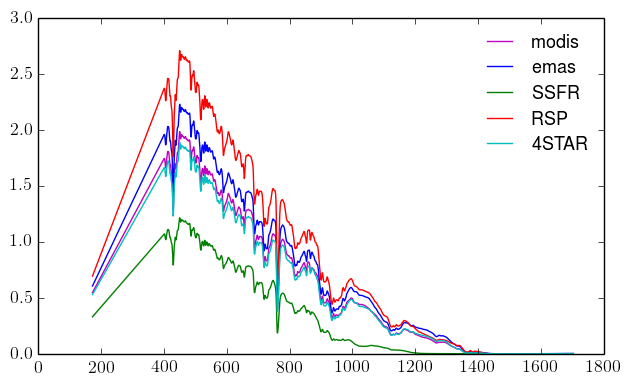

In [89]:
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,13,13]*10.0,'m',label='modis')
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,10,12]*10.0,'b',label='emas')
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,29,17]*10.0,'g',label='SSFR')
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,24,11]*10.0,'r',label='RSP')
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,9,13]*10.0,'c',label='4STAR')
#plt.plot(ssfr_dc8[''])
plt.legend(frameon=False)

In [90]:
print sp_rsp

[ 0.04207219  0.04647309  0.05090946 ...,  0.00042936  0.00039828
  0.00036677]


Load the SSFR from the DC8

In [137]:
ssfr_dc8 = sio.idl.readsav(fp+'dc8/20130913/20130913_calibspcs.out')
print ssfr_dc8.keys()
iutc185 = np.nanargmin(abs(ssfr_dc8['tmhrs']-18.5))
iutc189 = np.nanargmin(abs(ssfr_dc8['tmhrs']-18.9))
iutc191 = np.nanargmin(abs(ssfr_dc8['tmhrs']-19.1))
iutc192 = np.nanargmin(abs(ssfr_dc8['tmhrs']-19.2))
print ssfr_dc8['zspectra'].shape
dn = np.nanmean(ssfr_dc8['zspectra'][iutc189:iutc191,:],axis=0)
print dn.shape
up = np.nanmean(ssfr_dc8['nspectra'][iutc189:iutc191,:],axis=0)

['status', 'zenlambda', 'zer', 'nadlambda', 'nspectra', 'zspectra', 'sat', 'ner', 'tmhrs']
(28858L, 417L)
(417L,)


In [138]:
dnstd = np.nanstd(ssfr_dc8['zspectra'][iutc191:iutc192,:],axis=0)

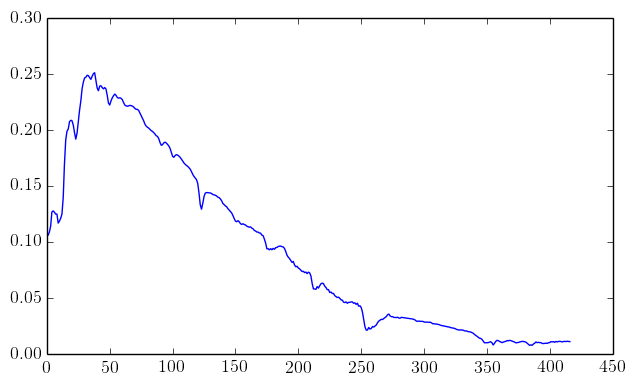

In [139]:
plt.plot(dnstd)

In [140]:
dn_no = interpirr(5.0,0)

5.0 0


ValueError: operands could not be broadcast together with shapes (1556,) (417,) 

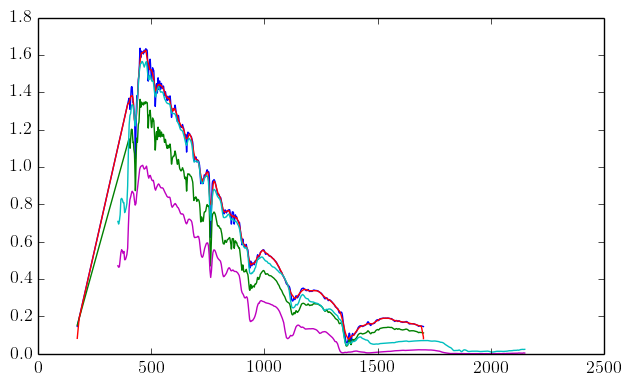

In [141]:
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,4,0])
plt.plot(lut.wvl,lut.sp_irrdn[1,:,0,4,1])
plt.plot(lut.wvl,dn_no)
plt.plot(ssfr_dc8['zenlambda'],dn)
plt.plot(ssfr_dc8['zenlambda'],up)
plt.plot((dn-up)-(dn_no-up))

In [142]:
ssfr_dc8_ict = load_ict(fp+'dc8/20130913/SEAC4RS-SSFR_DC8_20130913_R0.ict')

('UTC', 'DN500', 'DN936', 'DN1600', 'DN_SW350_700', 'DN_SW350_2150', 'UP500', 'UP936', 'UP1600', 'UP_SW350_700', 'UP_SW350_2150')


In [92]:
iutc185tt = np.nanargmin(abs(ssfr_dc8_ict['UTC']-18.5))
iutc192tt = np.nanargmin(abs(ssfr_dc8_ict['UTC']-19.2))
iutc190tt = np.nanargmin(abs(ssfr_dc8_ict['UTC']-19.0))
ssfr_dc8_ict_good = np.where((ssfr_dc8_ict['UTC']>19.0) & (ssfr_dc8_ict['UTC']<19.2) & (ssfr_dc8_ict['DN500']>0))

1.12612046175


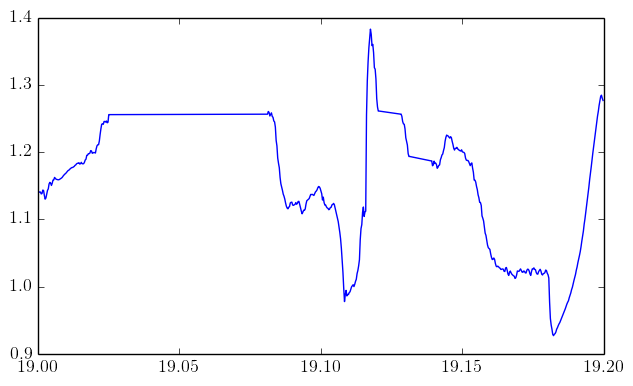

In [93]:
s500 = np.nanmean(ssfr_dc8_ict['DN500'][ssfr_dc8_ict_good[0]])
print s500
plt.plot(ssfr_dc8_ict['UTC'][ssfr_dc8_ict_good[0]],ssfr_dc8_ict['DN500'][ssfr_dc8_ict_good[0]])

In [143]:
idc500 = np.nanargmin(abs(ssfr_dc8['zenlambda']-500.0))
r500 = s500/dn[idc500]
print r500
fssp = interpolate.interp1d(ssfr_dc8['zenlambda'],dn*r500,bounds_error=False)
ssp = fssp(lut.wvl)

0.762808871843


In [156]:
fssps = interpolate.interp1d(ssfr_dc8['zenlambda'],(dn+dnstd)*r500,bounds_error=False)
ssps = fssps(lut.wvl)

In [144]:
fspup = interpolate.interp1d(ssfr_dc8['zenlambda'],up*r500,bounds_error=False)
sspup = fspup(lut.wvl)

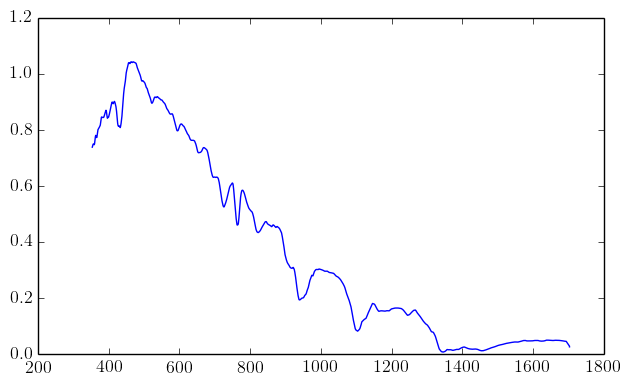

In [145]:
plt.plot(lut.wvl,dn_no*sspup/ssp)

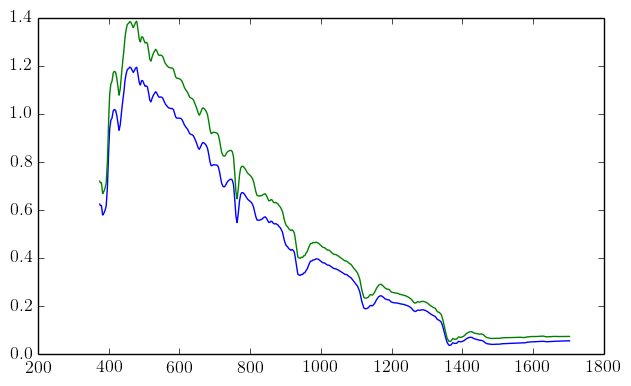

In [157]:
plt.plot(lut.wvl[250:],ssp[250:])
plt.plot(lut.wvl[250:],ssps[250:])

SSFR forcing, measurement based: -217.874433 W/m^2
SSFR forcing, std measurement based: -130.254563 W/m^2


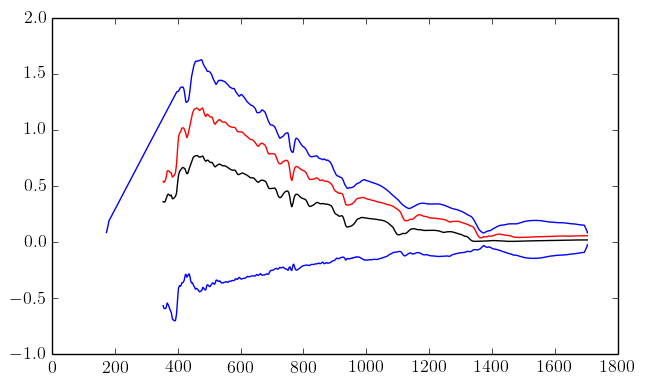

In [158]:
plt.plot(lut.wvl,sspup,'k')
plt.plot(lut.wvl,ssp,'r')
plt.plot(lut.wvl,dn_no,'b')
plt.plot(lut.wvl,(ssp-sspup)-(dn_no-sspup))
print 'SSFR forcing, measurement based: %f W/m^2' % np.nansum(((ssp[250:]-sspup[250:])-(dn_no[250:]-sspup[250:]))*lut.wvl[250:]/1000.0)
print 'SSFR forcing, std measurement based: %f W/m^2' % np.nansum(((ssps[250:]-sspup[250:])-(dn_no[250:]-sspup[250:]))*lut.wvl[250:]/1000.0)
                                                               

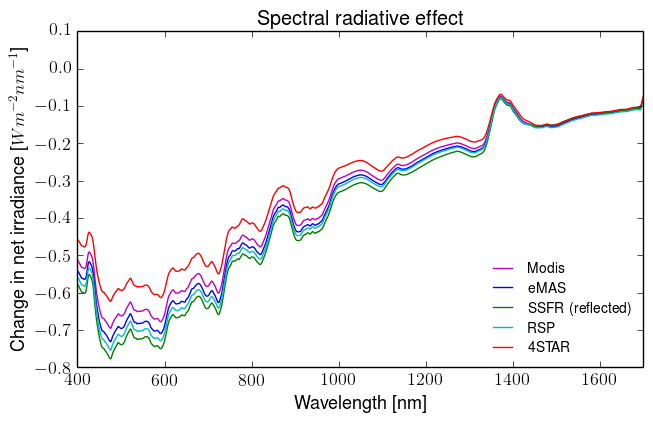

In [100]:
plt.figure
plt.plot(lut.wvl,(sp_modis-sp_modis_up)-(sp_modis_no-sp_modis_no_up),c='m',label='Modis')
plt.plot(lut.wvl,(sp_emas-sp_emas_up)-(sp_emas_no-sp_emas_no_up),c='b',label='eMAS')
plt.plot(lut.wvl,(sp_ssfr-sp_ssfr_up)-(sp_ssfr_no-sp_ssfr_no_up),c='g',label='SSFR (reflected)')
plt.plot(lut.wvl,(sp_rsp-sp_rsp_up)-(sp_rsp_no-sp_rsp_no_up),c='c',label='RSP')
plt.plot(lut.wvl,(sp_star-sp_star_up)-(sp_star_no-sp_star_no_up),c='r',label='4STAR')
plt.xlim([400,1700])
plt.legend(frameon=False,prop={'size':10},loc=4)
plt.title('Spectral radiative effect')
plt.xlabel('Wavelength [nm]')
plt.ylabel('Change in net irradiance [$Wm^{-2}nm^{-1}$]')
plt.savefig(fp+'plots/sp_rad_effect.png',dpi=600,transparent=True)

In [109]:
radeff_modis = np.sum(((sp_modis[250:]-sp_modis_up[250:])-(sp_modis_no[250:]-sp_modis_no_up[250:]))*lut.wvl[250:]/1000.0)
radeff_emas = np.sum(((sp_emas[250:]-sp_emas_up[250:])-(sp_emas_no[250:]-sp_emas_no_up[250:]))*lut.wvl[250:]/1000.0)
radeff_ssfr = np.sum(((sp_ssfr[250:]-sp_ssfr_up[250:])-(sp_ssfr_no[250:]-sp_ssfr_no_up[250:]))*lut.wvl[250:]/1000.0)
radeff_rsp = np.sum(((sp_rsp[250:]-sp_rsp_up[250:])-(sp_rsp_no[250:]-sp_rsp_no_up[250:]))*lut.wvl[250:]/1000.0)
radeff_star = np.sum(((sp_star[250:]-sp_star_up[250:])-(sp_star_no[250:]-sp_star_no_up[250:]))*lut.wvl[250:]/1000.0)

In [110]:
radeff_modisp = np.sum(((sp_modisp-sp_modisp_up)-(sp_modis_no-sp_modis_no_up))*lut.wvl/1000.0)
radeff_emasp = np.sum(((sp_emasp-sp_emasp_up)-(sp_emas_no-sp_emas_no_up))*lut.wvl/1000.0)
radeff_ssfrp = np.sum(((sp_ssfrp-sp_ssfrp_up)-(sp_ssfr_no-sp_ssfr_no_up))*lut.wvl/1000.0)
radeff_rspp = np.sum(((sp_rspp-sp_rspp_up)-(sp_rsp_no-sp_rsp_no_up))*lut.wvl/1000.0)
radeff_starp = np.sum(((sp_starp-sp_starp_up)-(sp_star_no-sp_star_no_up))*lut.wvl/1000.0)

In [111]:
print 'Modis: ',radeff_modis, ' +/- ', radeff_modisp-radeff_modis
print 'eMAS: ',radeff_emas, ' +/- ', radeff_emasp-radeff_emas
print 'SSFR: ',radeff_ssfr, ' +/- ', radeff_ssfrp-radeff_ssfr
print 'RSP: ',radeff_rsp, ' +/- ', radeff_rspp-radeff_rsp
print '4star: ', radeff_star, ' +/- ', radeff_starp-radeff_star

Modis:  -394.594742805  +/-  -45.5518685335
eMAS:  -410.836715417  +/-  -37.3153930792
SSFR:  -431.778486732  +/-  -55.91902437
RSP:  -420.430762281  +/-  -53.1438714948
4star:  -360.981420287  +/-  -25.0376429782


NameError: name 'ssp' is not defined

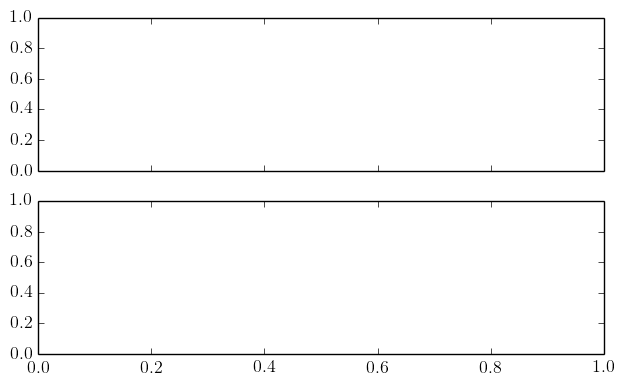

In [169]:
plt.figure(figsize=(13,10))
f0,a0 = plt.subplots(2,1,sharex=True)
a0[0].plot(lut.wvl,ssp,label='SSFR Measurement',c='k')
a0[0].axvspan(350,1700,color='#FFFFFF')
a0[1].axvspan(350,1700,color='#FFFFFF')
a0[0].plot(lut.wvl,sp_modis,c='m',label='Modis')
a0[0].plot(lut.wvl,sp_emas,c='b',label='eMAS')
a0[0].plot(lut.wvl,sp_ssfr,c='g',label='SSFR (reflected)')
a0[0].plot(lut.wvl,sp_rsp/10.0,c='c',label='RSP')
a0[0].plot(lut.wvl,sp_star,c='r',label='4STAR')
a0[0].legend(frameon=False,prop={'size':10})
a0[0].set_title('Below cloud downwelling irradiance')
a0[1].set_xlabel('Wavelength [nm]')
a0[0].set_ylabel('Irradiance\n[Wm$^{-2}$nm$^{-1}$]')
a0[0].set_xlim([400,1700])
a0[1].plot(lut.wvl,(ssp-sp_modis)/ssp*100.0,c='m',label='Modis')
a0[1].plot(lut.wvl,(ssp-sp_emas)/ssp*100.0,c='b',label='eMAS')
a0[1].plot(lut.wvl,(ssp-sp_ssfr)/ssp*100.0,c='g',label='SSFR (reflected)')
a0[1].plot(lut.wvl,(ssp-sp_rsp/10.0)/ssp*100.0,c='c',label='RSP')
a0[1].plot(lut.wvl,(ssp-sp_modis)/ssp*100.0,c='r',label='4STAR')
a0[1].axhline(0,linestyle='--',c='k')
a0[1].set_ylabel('Irradiance difference\n[$\%$]')
a0[1].set_ylim([-40,100])
plt.savefig(fp+'plots/sp_compare_mod_meas.png',dpi=600,transparent=True)

## Get GOES - Problematic now...

In [120]:
goes_file = fp+'er2/20130913/G13V04.0.CONUS.2013256.2045.PX.04K.NC'
goes,goes_dicts = load_hdf(goes_file)

Outputting the Data subdatasets:
0: [27x18] solar_zenith_angle (32-bit floating-point)
1: [27x18] view_zenith_angle (32-bit floating-point)
2: [27x18] azimuth_zenith_angle (32-bit floating-point)
3: [27x18] clearsky_vis_reflectance (32-bit floating-point)
4: [27x18] skin_temperature (32-bit floating-point)
5: [27x18] clearsky_ir_temperature (32-bit floating-point)
6: [350x400] latitude (32-bit floating-point)
7: [350x400] longitude (32-bit floating-point)
8: [350x400] reflectance_vis (32-bit floating-point)
9: [350x400] visible_count (32-bit floating-point)
10: [350x400] reflectance_nir (32-bit floating-point)
11: [350x400] temperature_sir (32-bit floating-point)
12: [350x400] temperature_67 (32-bit floating-point)
13: [350x400] temperature_ir (32-bit floating-point)
14: [350x400] temperature_sw (32-bit floating-point)
15: [350x400] broadband_shortwave_albedo (32-bit floating-point)
16: [350x400] broadband_longwave_flux (32-bit floating-point)
17: [350x400] cloud_ir_emittance (32-bit f

In [133]:
goes_values = (('lat',6),('lon',7),('tau',19),('ref',20))
goes,goes_dicts = load_hdf(goes_file,values=goes_values)

Outputting the Data subdatasets:
0: [27x18] solar_zenith_angle (32-bit floating-point)
1: [27x18] view_zenith_angle (32-bit floating-point)
2: [27x18] azimuth_zenith_angle (32-bit floating-point)
3: [27x18] clearsky_vis_reflectance (32-bit floating-point)
4: [27x18] skin_temperature (32-bit floating-point)
5: [27x18] clearsky_ir_temperature (32-bit floating-point)
6: [350x400] latitude (32-bit floating-point)
7: [350x400] longitude (32-bit floating-point)
8: [350x400] reflectance_vis (32-bit floating-point)
9: [350x400] visible_count (32-bit floating-point)
10: [350x400] reflectance_nir (32-bit floating-point)
11: [350x400] temperature_sir (32-bit floating-point)
12: [350x400] temperature_67 (32-bit floating-point)
13: [350x400] temperature_ir (32-bit floating-point)
14: [350x400] temperature_sw (32-bit floating-point)
15: [350x400] broadband_shortwave_albedo (32-bit floating-point)
16: [350x400] broadband_longwave_flux (32-bit floating-point)
17: [350x400] cloud_ir_emittance (32-bit f

BdbQuit: 

In [125]:
figmg = plt.figure()
axmg = figm.add_axes([0.1,0.1,0.8,0.8])
mg = Basemap(projection='stere',lon_0=-87,lat_0=20,
        llcrnrlon=-100, llcrnrlat=15,
        urcrnrlon=-85, urcrnrlat=25,resolution='h',ax=axmg)
mg.drawcoastlines()
#m.fillcontinents(color='#AAAAAA')
mg.drawstates()
mg.drawcountries()
figmg.show()
x,y = mg(goes['lon'],goes['lat'])
csg = mg.contourf(x,y,goes['tau'],clevels,cmap=plt.cm.gist_ncar)

C:\Python27_64\WinPython-64bit-2.7.6.4\python-2.7.6.amd64\lib\site-packages\matplotlib\figure.py:371: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


TypeError: input must be an array, list, tuple or scalar

## Plot out FOV of each instrument on eMAS figure

In [113]:
from plotting_utils import circles
from map_utils import radius_m2deg, spherical_dist

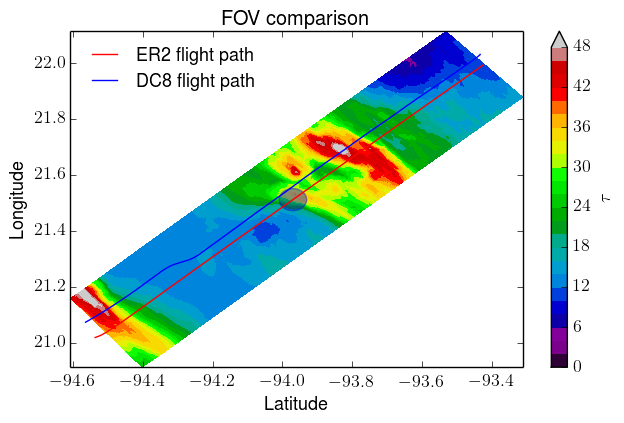

In [17]:
plt.figure()
clevels = range(0,50,2)
cf = plt.contourf(emas_v1['lon'],emas_v1['lat'],emas_v1['tau'],clevels,cmap=plt.cm.spectral,extend='max')
ier2 = np.where((er2['Start_UTC']>19.08) & (er2['Start_UTC']<19.3))[0]
idc8 = np.where((dc8['TIME_UTC']>19.08) & (dc8['TIME_UTC']<19.3))[0]
plt.plot(er2['Longitude'][ier2],er2['Latitude'][ier2],'r',label='ER2 flight path')
plt.plot(dc8['G_LONG'][idc8],dc8['G_LAT'][idc8],'b',label='DC8 flight path')
#plt.plot(dc8['G_LONG'][idc8[400]],dc8['G_LAT'][idc8[400]],'k*')

circles(dc8['G_LONG'][idc8[400]],dc8['G_LAT'][idc8[400]],radius_m2deg(dc8['G_LONG'][idc8[400]],dc8['G_LAT'][idc8[400]],r_4STAR),c='r',alpha=0.4)
circles(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],radius_m2deg(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],r_SSFR),c='b',alpha=0.4)
circles(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],radius_m2deg(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],r_eMAS),c='g',alpha=0.4)
circles(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],radius_m2deg(er2['Longitude'][ier2[400]],er2['Latitude'][ier2[400]],r_RSP),c='y',alpha=0.4)

plt.title('FOV comparison')
plt.ylabel('Longitude')
plt.xlabel('Latitude')
plt.legend(loc=2,frameon=False)

cbar = plt.colorbar(cf)
cbar.set_label('$\\tau$')
plt.savefig(fp+'plots/emas_FOV.png',dpi=600,transparent=True)

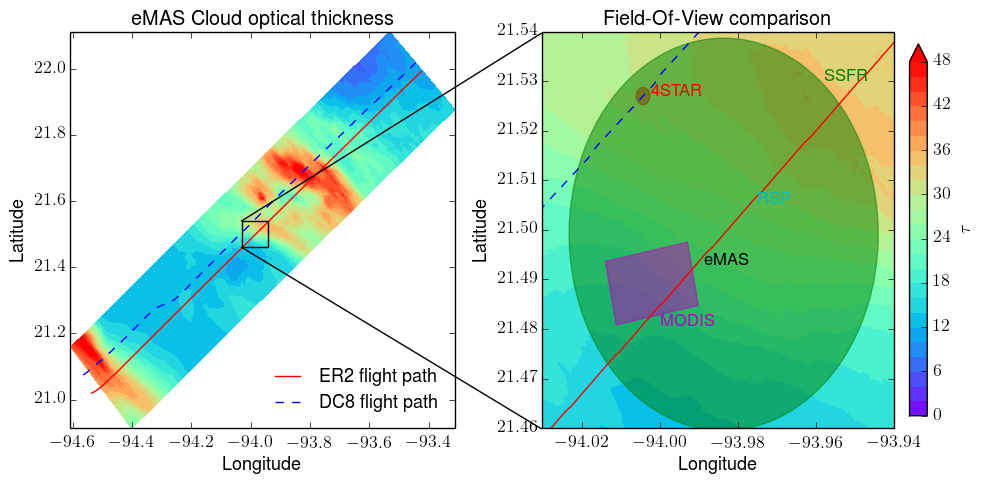

In [114]:
ier2 = np.where((er2['Start_UTC']>19.08) & (er2['Start_UTC']<19.3))[0]
idc8 = np.where((dc8['TIME_UTC']>19.08) & (dc8['TIME_UTC']<19.3))[0]
clevels = range(0,50,2)

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(122)
cf = ax.contourf(emas_v1['lon'],emas_v1['lat'],emas_v1['tau'],clevels,cmap=plt.cm.rainbow,extend='max')

ax.plot(er2['Longitude'][ier2],er2['Latitude'][ier2],'r',label='ER2 flight path')
ax.plot(dc8['G_LONG'][idc8],dc8['G_LAT'][idc8],'b--',label='DC8 flight path')

circles(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],radius_m2deg(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],r_4STAR),c='r',alpha=0.5,ax=ax,label='4STAR')
circles(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],radius_m2deg(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],r_SSFR),c='g',alpha=0.5,ax=ax,label='SSFR')
circles(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],radius_m2deg(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],r_eMAS),c='k',alpha=0.5,ax=ax,label='eMAS')
circles(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],radius_m2deg(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],r_RSP),c='c',alpha=0.5,ax=ax,label='RSP')
#circles(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],radius_m2deg(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],500.0),c='m',alpha=0.5,ax=ax,label='MODIS')
vo = [[modis['lon'][495,1208],modis['lat'][495,1208]],
      [modis['lon'][495,1209],modis['lat'][495,1209]],
      [modis['lon'][496,1209],modis['lat'][496,1209]],
      [modis['lon'][496,1208],modis['lat'][496,1208]],
      [modis['lon'][495,1208],modis['lat'][495,1208]]]
ax.add_patch(Polygon(vo,closed=True,color='m',alpha=0.5))


ax.text(dc8['G_LONG'][idc8[380]]+0.002,dc8['G_LAT'][idc8[380]],'4STAR',color='r')
ax.text(-93.958,21.53,'SSFR',color='g')
ax.text(er2['Longitude'][ier2[385]]+0.002,er2['Latitude'][ier2[385]],'eMAS',color='k')
ax.text(er2['Longitude'][ier2[395]]+0.002,er2['Latitude'][ier2[395]],'RSP',color='c')
ax.text(er2['Longitude'][ier2[375]]+0.005,er2['Latitude'][ier2[375]],'MODIS',color='m')

#dc8toer2 = spherical_dist(np.array((er2['Latitude'][ier2[393]],er2['Longitude'][ier2[393]])),np.array((dc8['G_LAT'][idc8[380]],dc8['G_LONG'][idc8[380]])))
#ax.annotate('' , (er2['Longitude'][ier2[393]],er2['Latitude'][ier2[393]]),(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]]), arrowprops={'arrowstyle':'<->'})
#ax.text(-93.991,21.515,'%.2f km' % dc8toer2)

ya,yb,xa,xb = 21.46,21.54,-94.03,-93.94
ax.set_ylim([ya,yb])
ax.set_xlim([xa,xb])
ax.get_yaxis().get_major_formatter().set_useOffset(False)
ax.get_xaxis().get_major_formatter().set_useOffset(False)
ax.set_title('Field-Of-View comparison')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

cbar = plt.colorbar(cf,fraction=0.046, pad=0.04)
cbar.set_label('$\\tau$')

ax2 = fig.add_subplot(121)
#ax2.locator_params(nbins=4)
cf = ax2.contourf(emas_v1['lon'],emas_v1['lat'],emas_v1['tau'],clevels,cmap=plt.cm.rainbow,extend='max')
ax2.plot(er2['Longitude'][ier2],er2['Latitude'][ier2],'r',label='ER2 flight path')
ax2.plot(dc8['G_LONG'][idc8],dc8['G_LAT'][idc8],'b--',label='DC8 flight path')
ax2.plot([xa,xa,xb,xb,xa],[ya,yb,yb,ya,ya],'k')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')
ax2.set_title('eMAS Cloud optical thickness')
ax2.legend(loc=4,frameon=False)
yr = ax2.get_ylim()
xr = ax2.get_xlim()
ax2.plot([xa,-93.02],[yb,22.107],'k',clip_on=False)
ax2.plot([xa,-93.02],[ya,20.912],'k',clip_on=False)
ax2.set_ylim(yr)
ax2.set_xlim(xr)
plt.tight_layout()
plt.savefig(fp+'plots/emas_FOV_comp.png',dpi=600,transparent=True)

In [63]:
import map_utils
reload(map_utils)
from map_utils import stats_within_radius

In [64]:
out_ssfrtau = stats_within_radius(er2['Latitude'][ier2[::10]],er2['Longitude'][ier2[::10]],emas_v1['lat'],emas_v1['lon'],emas_v1['tau'],r_SSFR)
out_ssfrref = stats_within_radius(er2['Latitude'][ier2[::10]],er2['Longitude'][ier2[::10]],emas_v1['lat'],emas_v1['lon'],emas_v1['ref'],r_SSFR)

Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']


In [70]:
out_rspref = stats_within_radius(er2['Latitude'][ier2[::10]],er2['Longitude'][ier2[::10]],emas_v1['lat'],emas_v1['lon'],emas_v1['ref'],r_RSP)
out_rsptau = stats_within_radius(er2['Latitude'][ier2[::10]],er2['Longitude'][ier2[::10]],emas_v1['lat'],emas_v1['lon'],emas_v1['tau'],r_RSP)

Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']
Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']


In [72]:
out_starref = stats_within_radius(dc8['G_LAT'][idc8],dc8['G_LONG'][idc8],emas_v1['lat'],emas_v1['lon'],emas_v1['ref'],r_4STAR)
out_startau = stats_within_radius(dc8['G_LAT'][idc8],dc8['G_LONG'][idc8],emas_v1['lat'],emas_v1['lon'],emas_v1['tau'],r_4STAR)

Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']
Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']


In [74]:
r_MODIS = 500.0
out_modisref = stats_within_radius(dc8['G_LAT'][idc8],dc8['G_LONG'][idc8],emas_v1['lat'],emas_v1['lon'],emas_v1['ref'],r_MODIS)
out_modistau = stats_within_radius(dc8['G_LAT'][idc8],dc8['G_LONG'][idc8],emas_v1['lat'],emas_v1['lon'],emas_v1['tau'],r_MODIS)

Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']
Setting up the lat, lon, localization
... Getting the index points
... Running through index points
['std', 'index', 'range', 'median', 'mean']


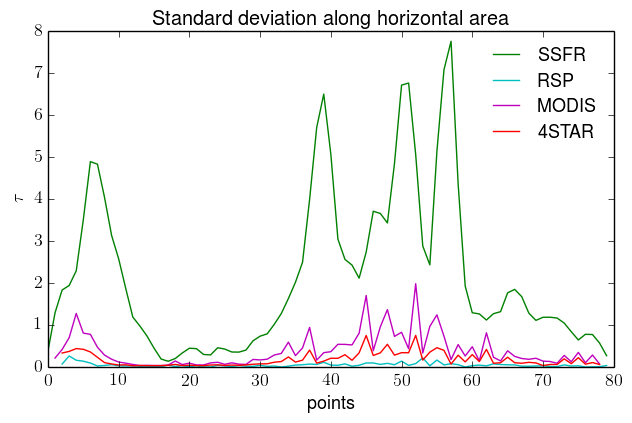

In [78]:
plt.plot(out_ssfrtau['std'],'g',label='SSFR')
plt.plot(out_rsptau['std'],'c',label='RSP')
plt.plot(out_modistau['std'],'m',label='MODIS')
plt.plot(out_startau['std'],'r',label='4STAR')
plt.xlabel('points')
plt.ylabel('$\\tau$')
plt.title('Standard deviation along horizontal area')
plt.legend(frameon=False)

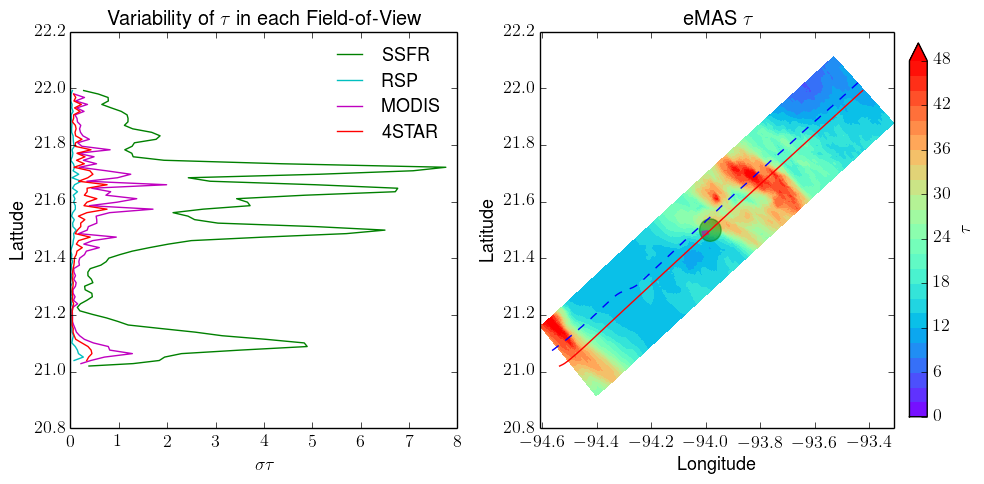

In [157]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(122)
cf = ax.contourf(emas_v1['lon'],emas_v1['lat'],emas_v1['tau'],clevels,cmap=plt.cm.rainbow,extend='max')

ax.plot(er2['Longitude'][ier2],er2['Latitude'][ier2],'r',label='ER2 flight path')
ax.plot(dc8['G_LONG'][idc8],dc8['G_LAT'][idc8],'b--',label='DC8 flight path')

circles(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],radius_m2deg(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],r_4STAR),c='r',alpha=0.5,ax=ax,label='4STAR')
circles(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],radius_m2deg(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],r_SSFR),c='g',alpha=0.5,ax=ax,label='SSFR')
circles(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],radius_m2deg(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],r_eMAS),c='k',alpha=0.5,ax=ax,label='eMAS')
circles(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],radius_m2deg(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],r_RSP),c='c',alpha=0.5,ax=ax,label='RSP')
#circles(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],radius_m2deg(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],500.0),c='m',alpha=0.5,ax=ax,label='MODIS')
vo = [[modis['lon'][495,1208],modis['lat'][495,1208]],
      [modis['lon'][495,1209],modis['lat'][495,1209]],
      [modis['lon'][496,1209],modis['lat'][496,1209]],
      [modis['lon'][496,1208],modis['lat'][496,1208]],
      [modis['lon'][495,1208],modis['lat'][495,1208]]]
ax.add_patch(Polygon(vo,closed=True,color='m',alpha=0.5))


#ax.text(dc8['G_LONG'][idc8[380]]+0.002,dc8['G_LAT'][idc8[380]],'4STAR',color='r')
#ax.text(-93.958,21.53,'SSFR',color='g')
#ax.text(er2['Longitude'][ier2[385]]+0.002,er2['Latitude'][ier2[385]],'eMAS',color='k')
#ax.text(er2['Longitude'][ier2[395]]+0.002,er2['Latitude'][ier2[395]],'RSP',color='c')
#ax.text(er2['Longitude'][ier2[375]]+0.005,er2['Latitude'][ier2[375]],'MODIS',color='m')

#dc8toer2 = spherical_dist(np.array((er2['Latitude'][ier2[393]],er2['Longitude'][ier2[393]])),np.array((dc8['G_LAT'][idc8[380]],dc8['G_LONG'][idc8[380]])))
#ax.annotate('' , (er2['Longitude'][ier2[393]],er2['Latitude'][ier2[393]]),(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]]), arrowprops={'arrowstyle':'<->'})
#ax.text(-93.991,21.515,'%.2f km' % dc8toer2)

#ya,yb,xa,xb = 21.46,21.54,-94.03,-93.94
#ax.set_ylim([ya,yb])
#ax.set_xlim([xa,xb])
ax.get_yaxis().get_major_formatter().set_useOffset(False)
ax.get_xaxis().get_major_formatter().set_useOffset(False)
ax.set_title('eMAS $\\tau$')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

cbar = plt.colorbar(cf,fraction=0.046, pad=0.04)
cbar.set_label('$\\tau$')

ax2 = fig.add_subplot(121,sharey=ax)
ax2.plot(out_ssfrtau['std'],er2['Latitude'][ier2[::10]],'g',label='SSFR')
ax2.plot(out_rsptau['std'],er2['Latitude'][ier2[::10]],'c',label='RSP')
ax2.plot(out_modistau['std'],er2['Latitude'][ier2[::10]],'m',label='MODIS')
ax2.plot(out_startau['std'],er2['Latitude'][ier2[::10]],'r',label='4STAR')
ax2.set_ylabel('Lattude')
ax2.set_xlabel('$\\sigma\\tau$')
ax2.set_title('Variability of $\\tau$ in each Field-of-View')
plt.legend(frameon=False)
plt.tight_layout()

plt.savefig(fp+'plots/emas_tau_variations.png',dpi=600,transparent=True)

In [124]:
print 'SSFR tau: %.2f, %.2f, max, min:%.2f, %.2f ' % (np.nanmean(out_ssfrtau['std']), np.median(out_ssfrtau['std']), np.nanmax(out_ssfrtau['std']), np.nanmin(out_ssfrtau['std']))
print 'RSP tau: %.2f, %.2f, max, min:%.2f, %.2f ' % (np.nanmean(out_rsptau['std']), np.median(out_rsptau['std']),np.nanmax(out_rsptau['std']), np.nanmin(out_rsptau['std']))
print 'MODIS tau: %.2f, %.2f, max, min:%.2f, %.2f ' % (np.nanmean(out_modistau['std']), np.median(out_modistau['std']),np.nanmax(out_modistau['std']), np.nanmin(out_modistau['std']))
print '4STAR tau: %.2f , %.2f, max, min:%.2f, %.2f' % (np.nanmean(out_startau['std']), np.median(out_startau['std']),np.nanmax(out_startau['std']), np.nanmin(out_startau['std']))

SSFR tau: 2.17, 1.31, max, min:7.76, 0.14 
RSP tau: 0.05, 0.04, max, min:0.27, 0.00 
MODIS tau: 0.39, 0.27, max, min:1.99, 0.04 
4STAR tau: 0.19 , 0.12, max, min:0.76, 0.03


In [125]:
print 'SSFR ref: %.2f, %.2f, max, min: %.2f,%.2f' % (np.nanmean(out_ssfrref['std']),np.median(out_ssfrref['std']),np.nanmax(out_ssfrref['std']),np.nanmin(out_ssfrref['std']))
print 'RSP ref: %.2f, %.2f, max, min: %.2f,%.2f' % (np.nanmean(out_rspref['std']),np.median(out_rspref['std']),np.nanmax(out_rspref['std']),np.nanmin(out_rspref['std']))
print 'MODIS ref: %.2f, %.2f, max, min: %.2f,%.2f' % (np.nanmean(out_modisref['std']),np.median(out_modisref['std']),np.nanmax(out_modisref['std']),np.nanmin(out_modisref['std']))
print '4STAR ref: %.2f, %.2f, max, min: %.2f,%.2f' % (np.nanmean(out_starref['std']),np.median(out_starref['std']),np.nanmax(out_starref['std']),np.nanmin(out_starref['std']))

SSFR ref: 1.54, 1.47, max, min: 2.67,1.06
RSP ref: 0.78, 0.74, max, min: 1.88,0.12
MODIS ref: 1.29, 1.28, max, min: 1.72,0.95
4STAR ref: 1.22, 1.20, max, min: 1.94,0.73


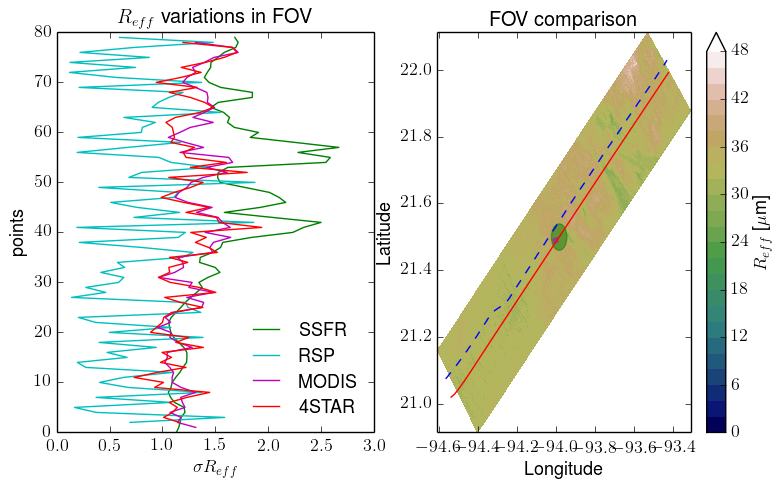

In [114]:
fig = plt.figure(figsize=(9,5))
ax = fig.add_subplot(122)

cf = ax.contourf(emas_v1['lon'],emas_v1['lat'],emas_v1['ref'],clevels,cmap=plt.cm.gist_earth,extend='max')

ax.plot(er2['Longitude'][ier2],er2['Latitude'][ier2],'r',label='ER2 flight path')
ax.plot(dc8['G_LONG'][idc8],dc8['G_LAT'][idc8],'b--',label='DC8 flight path')

circles(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],radius_m2deg(dc8['G_LONG'][idc8[380]],dc8['G_LAT'][idc8[380]],r_4STAR),c='r',alpha=0.5,ax=ax,label='4STAR')
circles(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],radius_m2deg(er2['Longitude'][ier2[390]],er2['Latitude'][ier2[390]],r_SSFR),c='g',alpha=0.5,ax=ax,label='SSFR')
circles(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],radius_m2deg(er2['Longitude'][ier2[385]],er2['Latitude'][ier2[385]],r_eMAS),c='k',alpha=0.5,ax=ax,label='eMAS')
circles(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],radius_m2deg(er2['Longitude'][ier2[395]],er2['Latitude'][ier2[395]],r_RSP),c='c',alpha=0.5,ax=ax,label='RSP')
#circles(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],radius_m2deg(er2['Longitude'][ier2[375]],er2['Latitude'][ier2[375]],500.0),c='m',alpha=0.5,ax=ax,label='MODIS')
vo = [[modis['lon'][495,1208],modis['lat'][495,1208]],
      [modis['lon'][495,1209],modis['lat'][495,1209]],
      [modis['lon'][496,1209],modis['lat'][496,1209]],
      [modis['lon'][496,1208],modis['lat'][496,1208]],
      [modis['lon'][495,1208],modis['lat'][495,1208]]]
ax.add_patch(Polygon(vo,closed=True,color='m',alpha=0.5))

ax.get_yaxis().get_major_formatter().set_useOffset(False)
ax.get_xaxis().get_major_formatter().set_useOffset(False)
ax.set_title('FOV comparison')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')

cbar = plt.colorbar(cf)
cbar.set_label('$R_{eff}$ [$\\mu$m]')

ax2 = fig.add_subplot(121)
ax2.plot(out_ssfrref['std'],range(80),'g',label='SSFR')
ax2.plot(out_rspref['std'],range(80),'c',label='RSP')
ax2.plot(out_modisref['std'],range(80),'m',label='MODIS')
ax2.plot(out_starref['std'],range(80),'r',label='4STAR')
ax2.set_ylabel('points')
ax2.set_xlabel('$\\sigma R_{eff}$')
ax2.set_title('$R_{eff}$ variations in FOV')
plt.legend(frameon=False,loc=4)

plt.savefig(fp+'plots/emas_ref_variations.png',dpi=600,transparent=True)

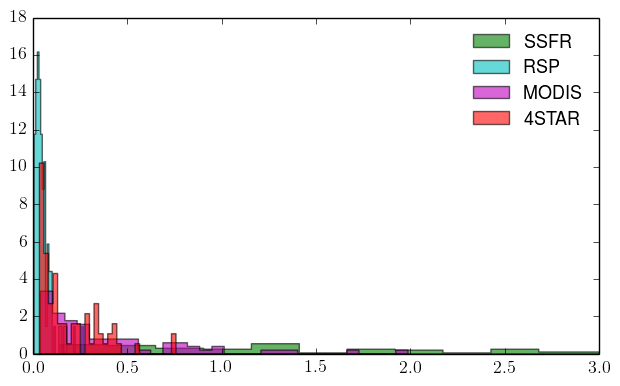

In [115]:
plt.hist(out_ssfrtau['std'],bins=30, histtype='stepfilled', normed=True,color='g',label='SSFR',alpha=0.6)
plt.hist(out_rsptau['std'][~isnan(out_rsptau['std'])],bins=30, histtype='stepfilled', normed=True,color='c',label='RSP',alpha=0.6)
plt.hist(out_modistau['std'][~isnan(out_modistau['std'])],bins=30, histtype='stepfilled', normed=True,color='m',label='MODIS',alpha=0.6)
plt.hist(out_startau['std'][~isnan(out_startau['std'])],bins=30, histtype='stepfilled', normed=True,color='r',label='4STAR',alpha=0.6)
plt.xlim([0,3])
plt.legend(frameon=False)